In [1]:
import pickle
from rbbm_src.labelling_func_src.src.LFRepair import fix_rules_with_solver_input
import pydot
from IPython.display import Image, display

[nltk_data] Downloading package words to /home/opc/nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package stopwords to /home/opc/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
2024-10-08 04:31:35.183120: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-10-08 04:31:35.235796: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-10-08 04:31:35.237007: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
DEBUG 2024-10-08 04:31:36,113 [tpu_cluster_resolver.py:<module>:32] Falling back to TensorFlow client; we recommended you install the Cloud TPU client directly with pip install c

In [2]:
with open('amazon_la_0.2_ia_0.25_input.pkl', 'rb') as f:
    input_dict = pickle.load(f)


In [3]:
for i in input_dict:
    input_dict[i]['user_input']['id'] = input_dict[i]['user_input'].reset_index().index

In [4]:
fix_rules_with_solver_input(fix_book_keeping_dict=input_dict)


In [20]:
test_tree = input_dict[2]['rule']

In [21]:
test_tree

PredicateNode(id=1, pred=keyword_predicate-word-(great))
    PredicateNode(id=4, pred=keyword_predicate-word-(though), added=True)
        PredicateNode(id=7, pred=keyword_predicate-word-(big), added=True)
            LabelNode(id=8, label=-1, added=True)
            PredicateNode(id=10, pred=keyword_predicate-word-(one), added=True)
                LabelNode(id=11, label=-1, added=True)
                LabelNode(id=12, label=1, added=True)
        LabelNode(id=6, label=0, added=True)
    LabelNode(id=3, label=0)

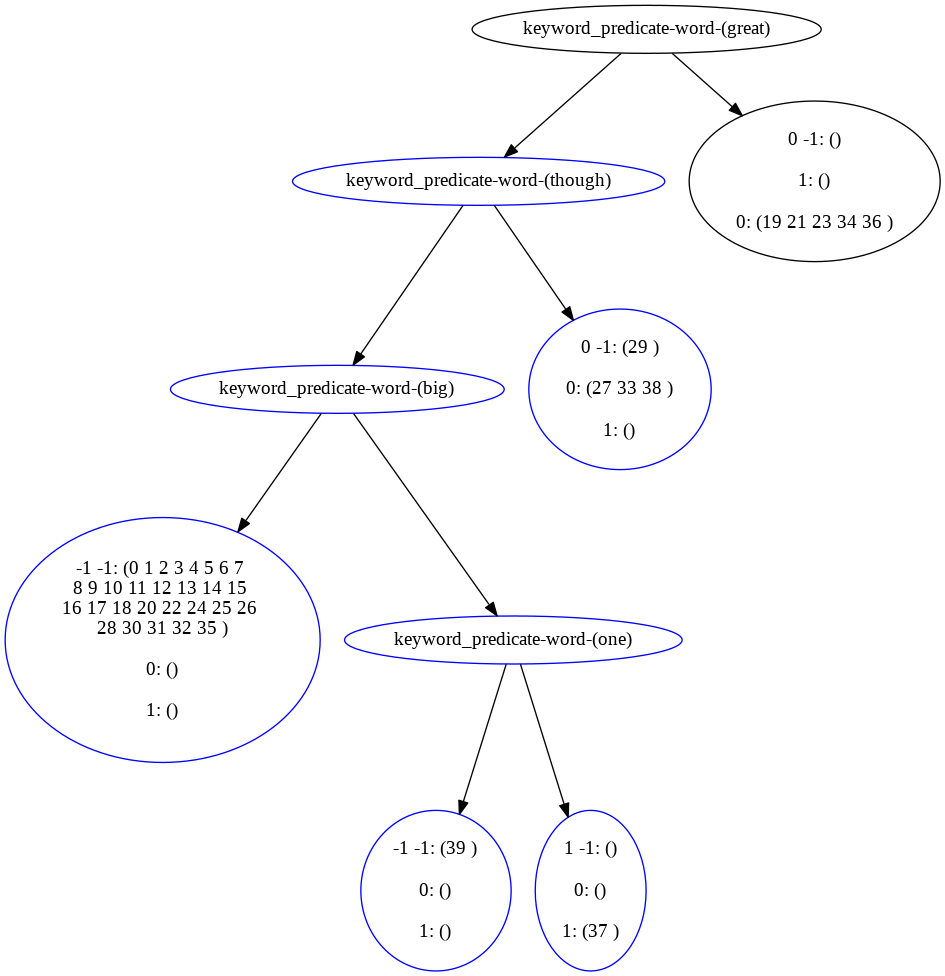

In [22]:
dot_string=test_tree.gen_dot_string('')
graph = pydot.graph_from_dot_data(dot_string)[0]
plt = Image(graph.create_png())
display(plt)
print('\n')

# algorithm 

1. When we extend a left branch (no matter where), we create a new tree
2. If the parent of the current left branch is not root, add the previous ancestors (starting from root, and every "right turn" the 

In [23]:
test_tree.root.left.parent.pred

keyword_predicate-word-(great)

In [24]:
import copy

In [26]:
from collections import deque

In [27]:
from rbbm_src.labelling_func_src.src.TreeRules import PredicateNode,TreeRule,ABSTAIN, SPAM, HAM,LabelNode

In [56]:
def construct_new_tree(node):
    
    node_copy = copy.deepcopy(node)
    cur_number = 1
    node_copy.left = LabelNode(number=f'added_{cur_number}', label=ABSTAIN, 
                               pairs={ABSTAIN:[], SPAM:[], HAM:[]}, used_predicates=set([]))
    cur_number+=1
    valid_ancestors = [node_copy]
    tree_size=3
    
#     print(f"node_copy: {node_copy.pred}")
    while(node_copy.parent):
#         print(f"parent of node copy: {node_copy.parent.pred}")
        if(node_copy.parent.right is node_copy):
#             print(f"{node_copy.parent.right} is {}")
            parent_copy = copy.deepcopy(node_copy.parent)
            parent_copy.left= LabelNode(number=f'added_{cur_number}', label=ABSTAIN, 
                                        pairs={ABSTAIN:[], SPAM:[], HAM:[]}, used_predicates=set([]))
            cur_number+=1
            parent_copy.right=None
            parent_copy.parent=None
            valid_ancestors.append(parent_copy)
        node_copy=node_copy.parent
    
    if(len(valid_ancestors)>1):
        for i in range(len(valid_ancestors)-1, 0, -1):
            pnode, cnode= valid_ancestors[i], valid_ancestors[i-1]
            pnode.right=cnode
            cnode.parent=pnode
            tree_size+=2
#     print("valid ancestors")
#     print([f.pred for f in valid_ancestors])
    return TreeRule(rtype='lf', root=valid_ancestors[-1], 
                    size=tree_size, max_node_id=tree_size, is_good=True)

In [28]:
queue = deque([test_tree.root])

In [29]:
new_trees = []

In [30]:
while(queue):
    cur_node = queue.popleft()
    if(cur_node.left):
        queue.append(cur_node.left)
        if(isinstance(cur_node.left, PredicateNode)):
            new_trees.append(construct_new_tree(cur_node.left))
            print('\n')
    if(cur_node.right):
        queue.append(cur_node.right)

node_copy: keyword_predicate-word-(though)
parent of node copy: keyword_predicate-word-(great)
valid ancestors
[keyword_predicate-word-(though)]


node_copy: keyword_predicate-word-(big)
parent of node copy: keyword_predicate-word-(though)
parent of node copy: keyword_predicate-word-(great)
valid ancestors
[keyword_predicate-word-(big)]




In [31]:
new_trees

[PredicateNode(id=4, pred=keyword_predicate-word-(though), added=True)
     LabelNode(id=added_1, label=-1)
     LabelNode(id=6, label=0, added=True),
 PredicateNode(id=7, pred=keyword_predicate-word-(big), added=True)
     LabelNode(id=added_1, label=-1)
     PredicateNode(id=10, pred=keyword_predicate-word-(one), added=True)
         LabelNode(id=11, label=-1, added=True)
         LabelNode(id=12, label=1, added=True)]

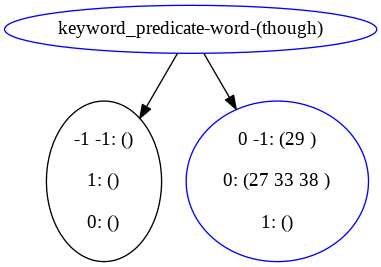

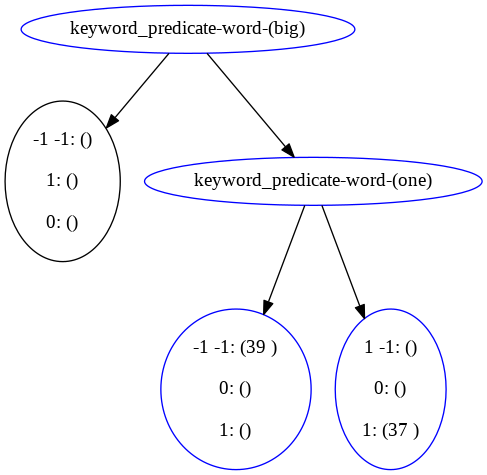

In [32]:
for nt in new_trees:
    dot_string=nt.gen_dot_string('')
    graph = pydot.graph_from_dot_data(dot_string)[0]
    plt = Image(graph.create_png())
    display(plt)
    print('\n')

In [33]:
# second traversal to cut ties with non-fulfilled branches
queue = deque([test_tree.root])

while(queue):
    cur_node = queue.popleft()
    if(cur_node.left):
        queue.append(cur_node.left)
        if(isinstance(cur_node.left, PredicateNode)):
            cur_node.left = LabelNode(number=test_tree.max_node_id+1, label=ABSTAIN, 
                                        pairs={ABSTAIN:[], SPAM:[], HAM:[]}, used_predicates=set([]))
            test_tree.max_node_id+=1
    if(cur_node.right):
        queue.append(cur_node.right)

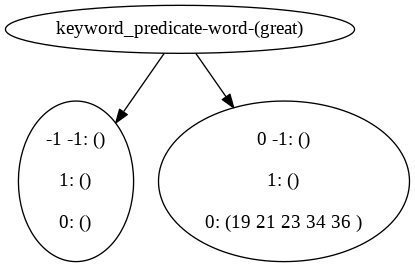

In [34]:
dot_string=test_tree.gen_dot_string('')
graph = pydot.graph_from_dot_data(dot_string)[0]
plt = Image(graph.create_png())
display(plt)
print('\n')


In [115]:
def post_process_break_tree_to_subtrees(input_tree):
    
    queue = deque([input_tree.root])
    new_trees = []
    
    # first traversal, create sub trees
    while(queue):
        cur_node = queue.popleft()
        if(cur_node.left):
            queue.append(cur_node.left)
            if(isinstance(cur_node.left, PredicateNode)):
                new_trees.append(construct_new_tree(cur_node.left))
                print('\n')
        if(cur_node.right):
            queue.append(cur_node.right)

    # second traversal to cut ties with non-fulfilled branches
    queue = deque([input_tree.root])

    while(queue):
        cur_node = queue.popleft()
        if(cur_node.left):
            queue.append(cur_node.left)
            if(isinstance(cur_node.left, PredicateNode)):
                cur_node.left = LabelNode(number=input_tree.max_node_id+1, label=ABSTAIN, 
                                            pairs={ABSTAIN:[], SPAM:[], HAM:[]}, used_predicates=set([]))
                input_tree.max_node_id+=1
        if(cur_node.right):
            queue.append(cur_node.right)
    
    res = [input_tree]
    filtered_res = []
    print("after reconstructing, original tree is")
    dot_string=input_tree.gen_dot_string('')
    graph = pydot.graph_from_dot_data(dot_string)[0]
    plt = Image(graph.create_png())
    display(plt)
    print('\n')
    res.extend(new_trees)
    
    print("res trees before deduplication")
    for nt in res:
        dot_string=nt.gen_dot_string('')
        graph = pydot.graph_from_dot_data(dot_string)[0]
        plt = Image(graph.create_png())
        display(plt)
        print('\n')
    print('***********************************')
    for r in res:
        print("candidate res tree:")
        print(r)
        include=True
        q = deque([r.root])
        while(q):
            cur_node = q.popleft()
            if(cur_node.left):
                if(isinstance(cur_node.left, PredicateNode)):
                    include=False
                    break
                q.append(cur_node.left)
            if(cur_node.right):
                q.append(cur_node.right)
        if(include):
            filtered_res.append(r)
    
    print("the new trees are: ")
    for nt in filtered_res:
        dot_string=nt.gen_dot_string('')
        graph = pydot.graph_from_dot_data(dot_string)[0]
        plt = Image(graph.create_png())
        display(plt)
        print('\n')
        
    return filtered_res

In [116]:
with open('amazon_la_0.8_ia_0.75_input.pkl', 'rb') as f08075:
    input_08075 = pickle.load(f08075)

In [117]:
for i in input_08075:
    input_08075[i]['user_input']['id'] = input_08075[i]['user_input'].reset_index().index
fix_rules_with_solver_input(fix_book_keeping_dict=input_08075)

In [118]:
new_rules = []

original tree 0


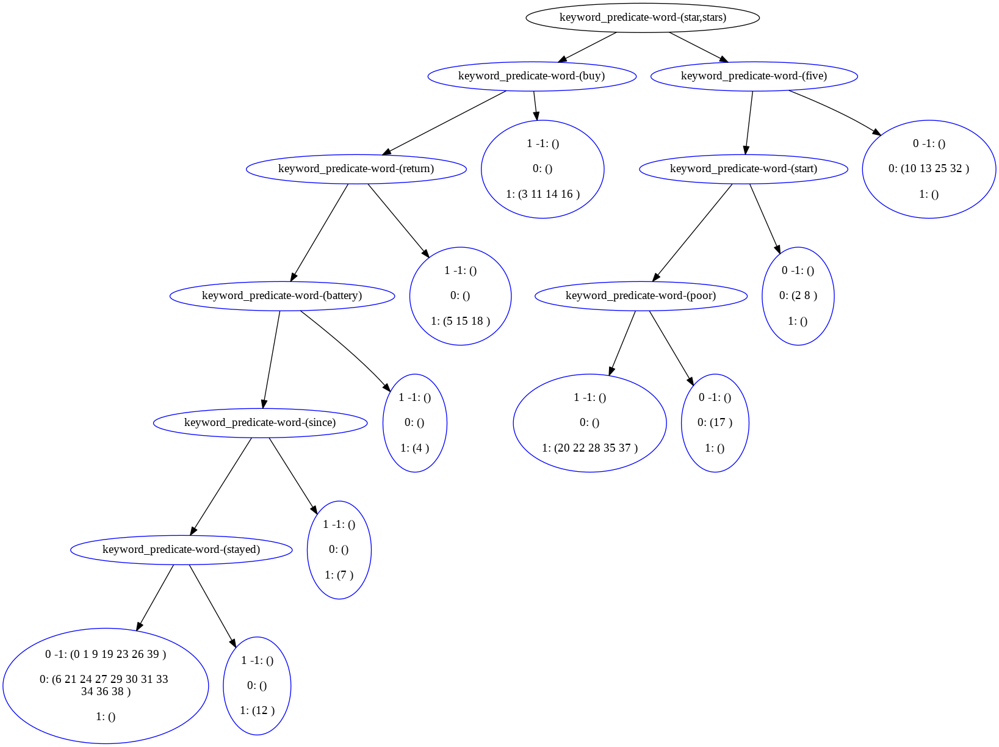















after reconstructing, original tree is


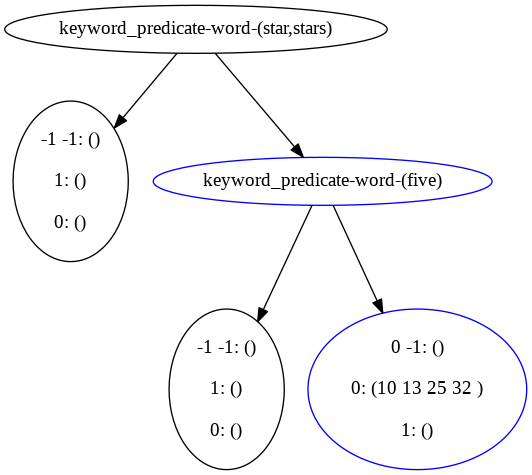



res trees before deduplication


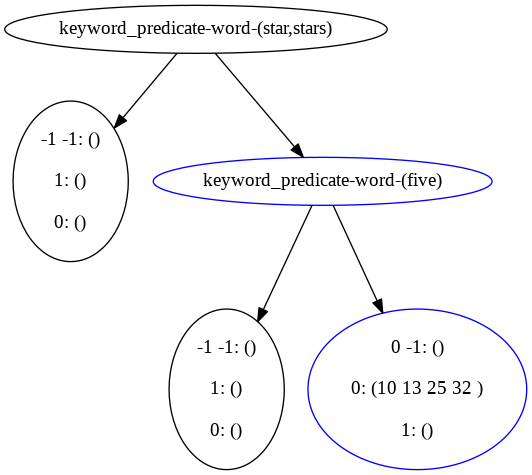

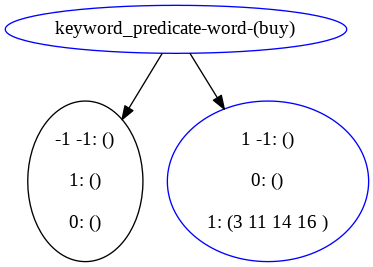

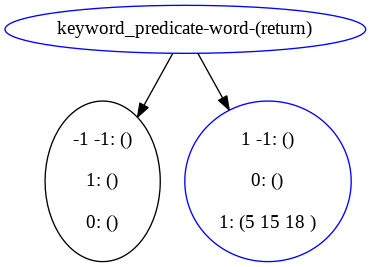

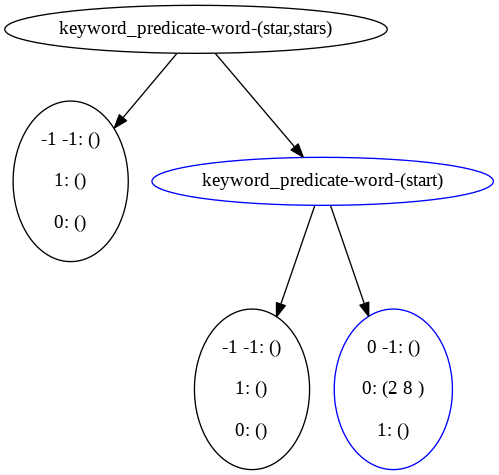

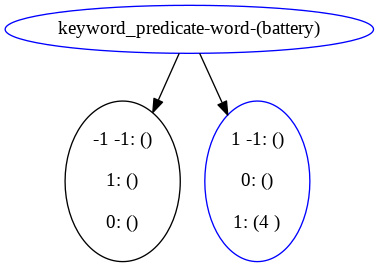

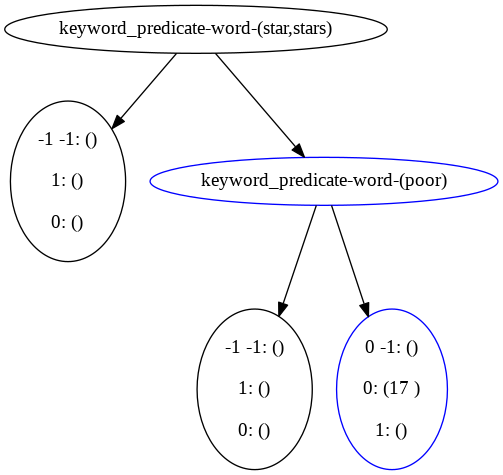

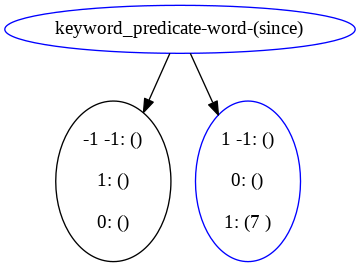

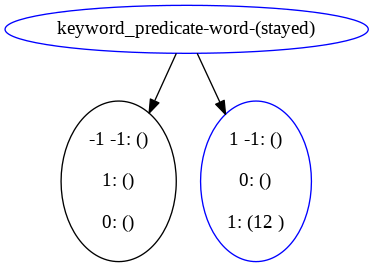



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(star,stars))
    LabelNode(id=28, label=-1)
    PredicateNode(id=7, pred=keyword_predicate-word-(five), added=True)
        LabelNode(id=30, label=-1)
        LabelNode(id=9, label=0, added=True)
candidate res tree:
PredicateNode(id=4, pred=keyword_predicate-word-(buy), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=6, label=1, added=True)
candidate res tree:
PredicateNode(id=10, pred=keyword_predicate-word-(return), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=12, label=1, added=True)
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(star,stars))
    LabelNode(id=added_2, label=-1)
    PredicateNode(id=13, pred=keyword_predicate-word-(start), added=True)
        LabelNode(id=added_1, label=-1)
        LabelNode(id=15, label=0, added=True)
candidate res tree:
PredicateNode(id=16, pred=keyword_predicate-word-(battery), added=

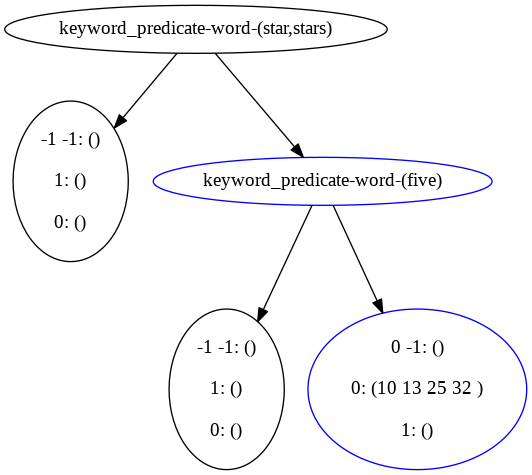

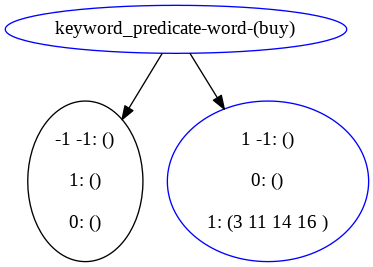

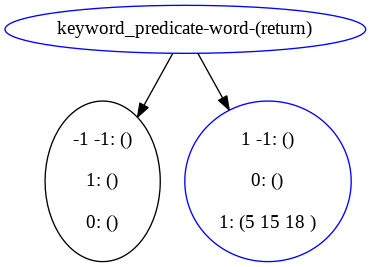

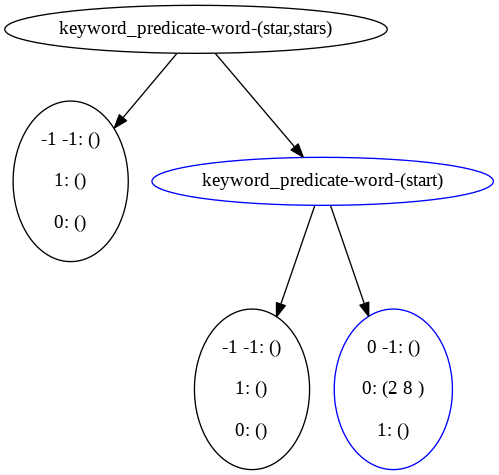

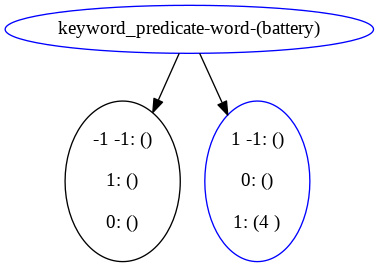

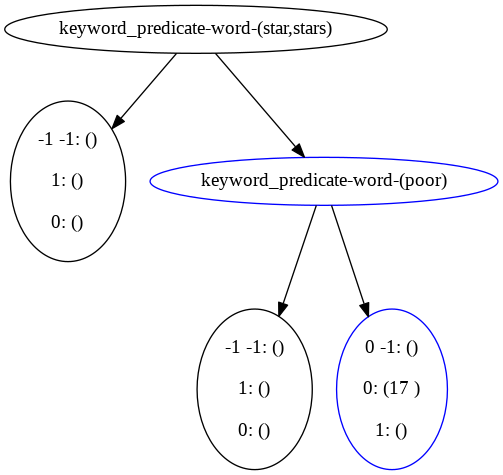

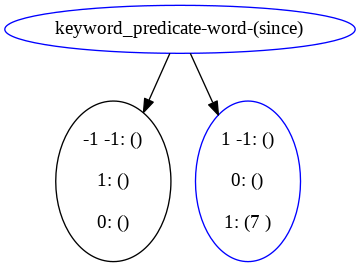

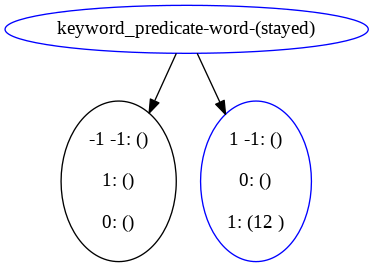



-----------------------------------------------------
original tree 1


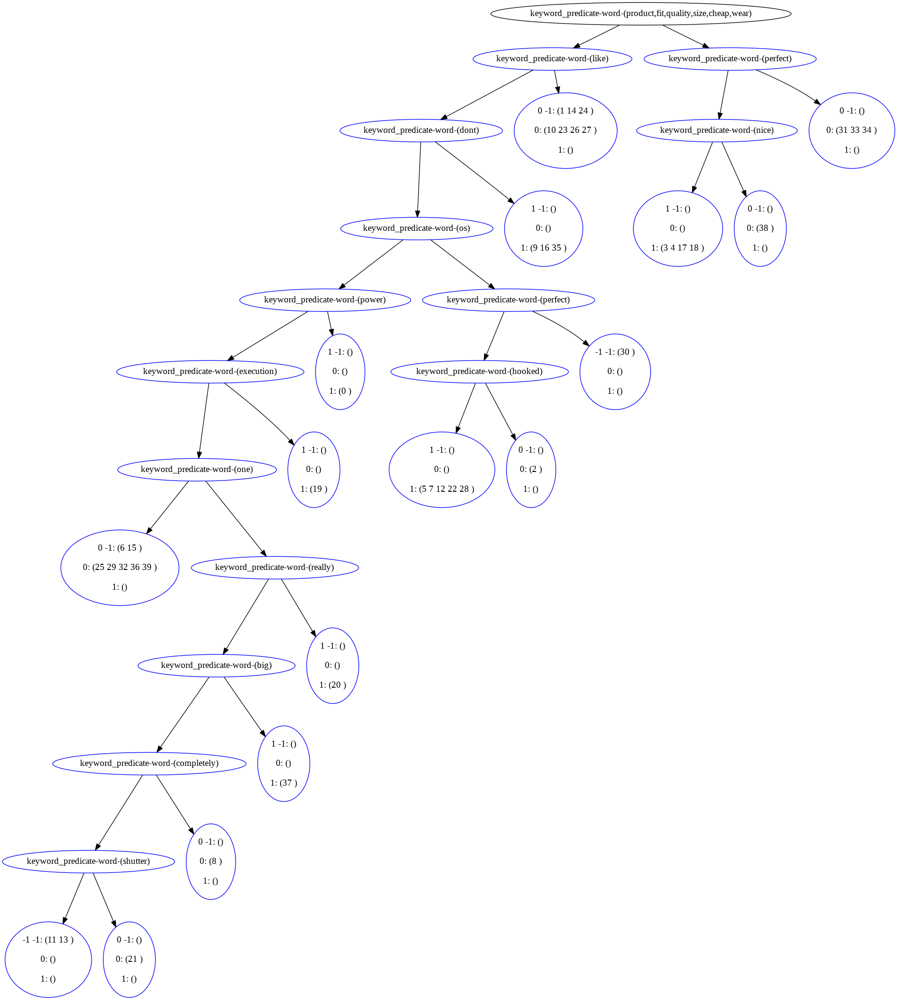























after reconstructing, original tree is


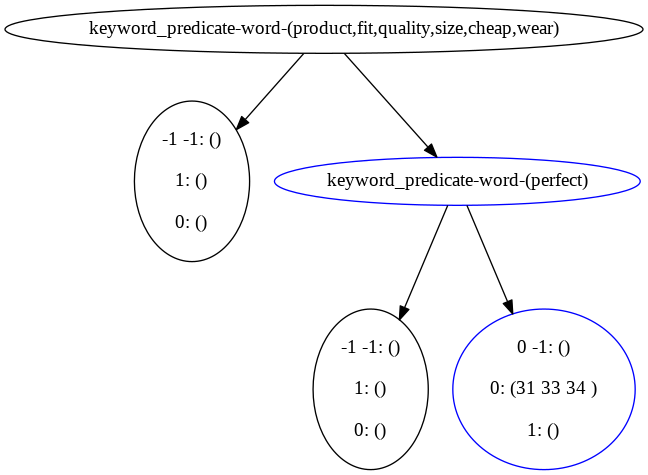



res trees before deduplication


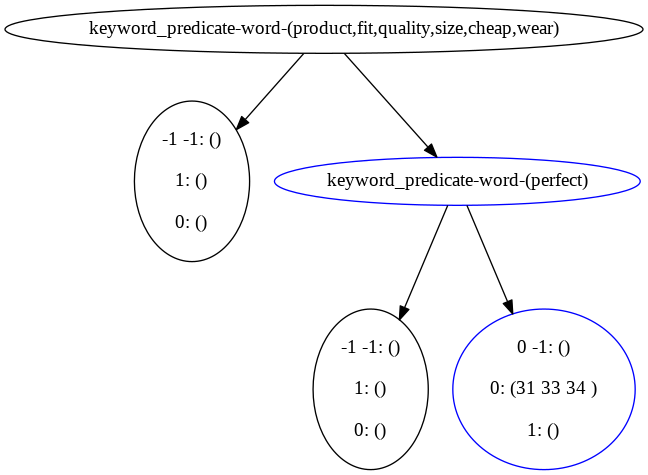

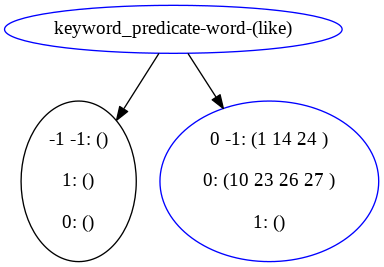

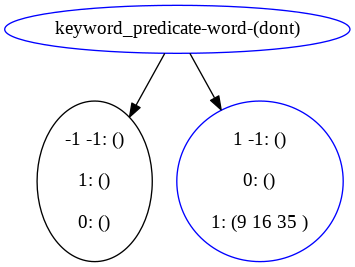

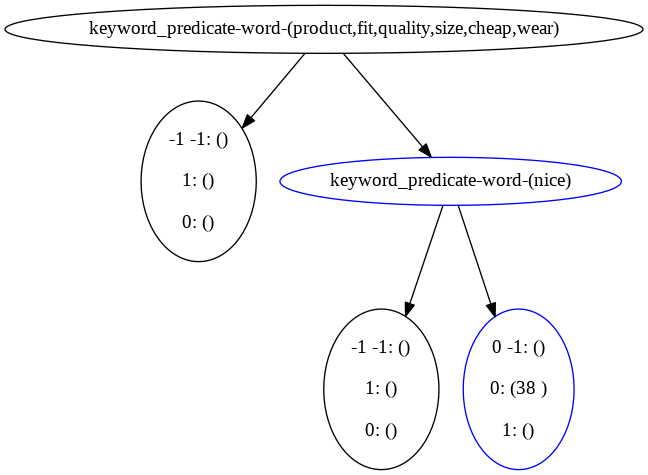

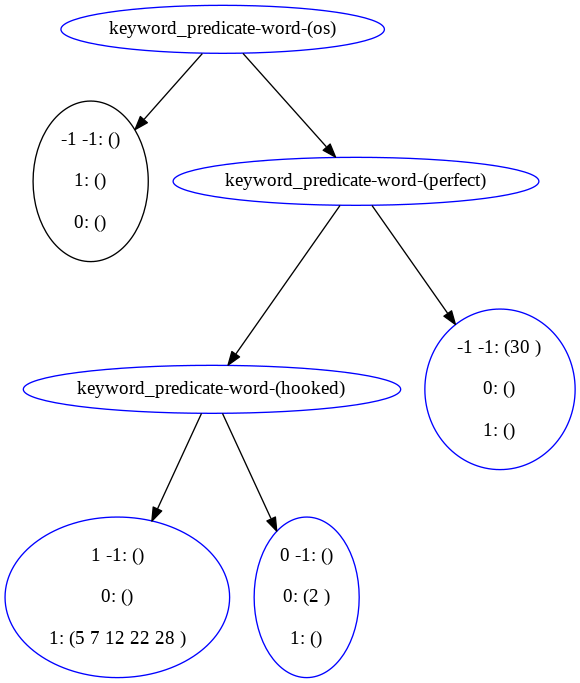

...

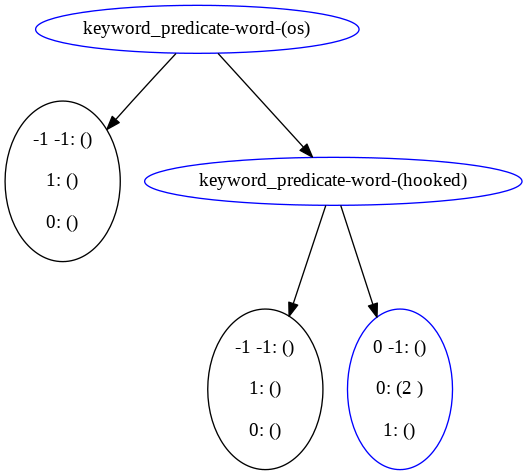

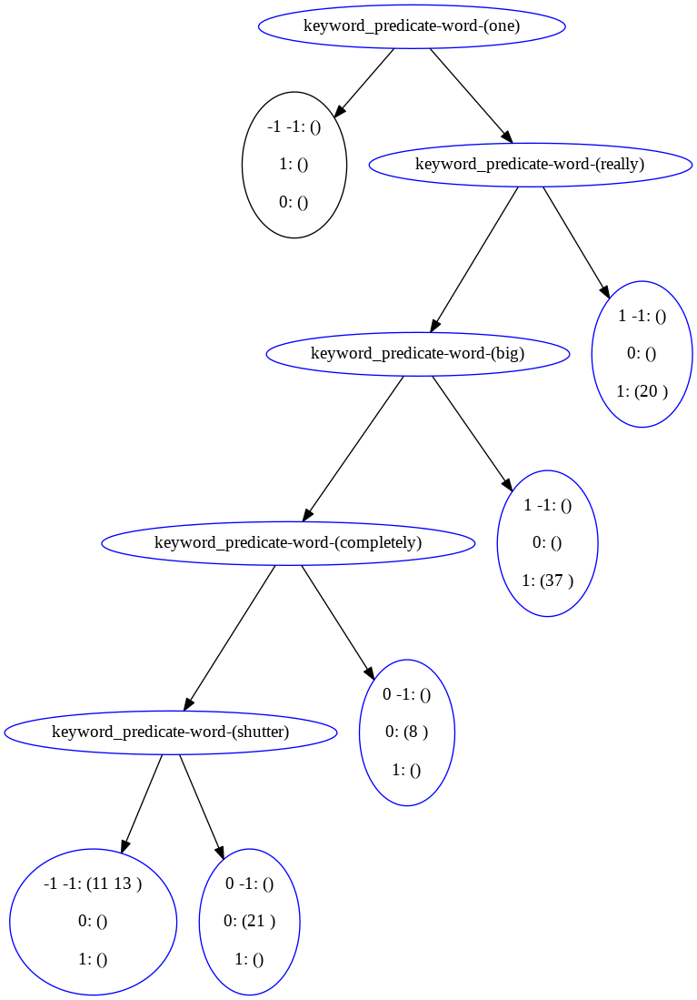

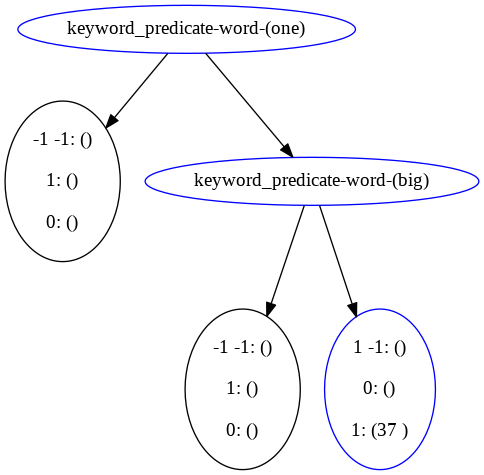

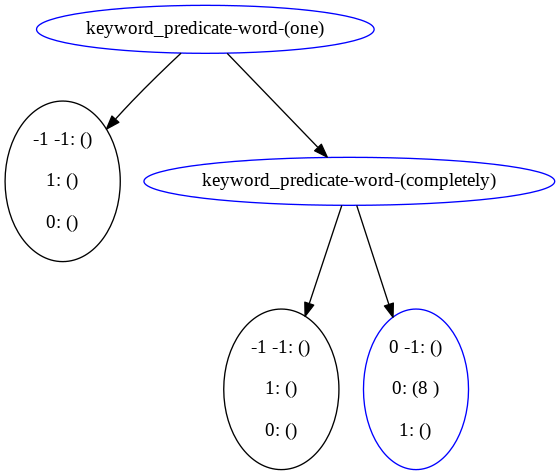

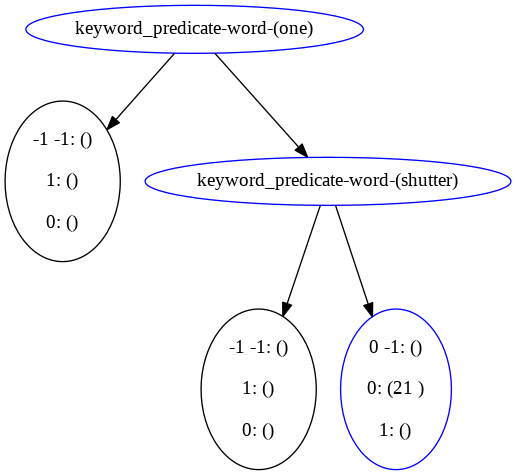



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(product,fit,quality,size,cheap,wear))
    LabelNode(id=46, label=-1)
    PredicateNode(id=7, pred=keyword_predicate-word-(perfect), added=True)
        LabelNode(id=48, label=-1)
        LabelNode(id=9, label=0, added=True)
candidate res tree:
PredicateNode(id=4, pred=keyword_predicate-word-(like), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=6, label=0, added=True)
candidate res tree:
PredicateNode(id=10, pred=keyword_predicate-word-(dont), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=12, label=1, added=True)
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(product,fit,quality,size,cheap,wear))
    LabelNode(id=added_2, label=-1)
    PredicateNode(id=13, pred=keyword_predicate-word-(nice), added=True)
        LabelNode(id=added_1, label=-1)
        LabelNode(id=15, label=0, added=True)
candidate res tree:
PredicateNode(i

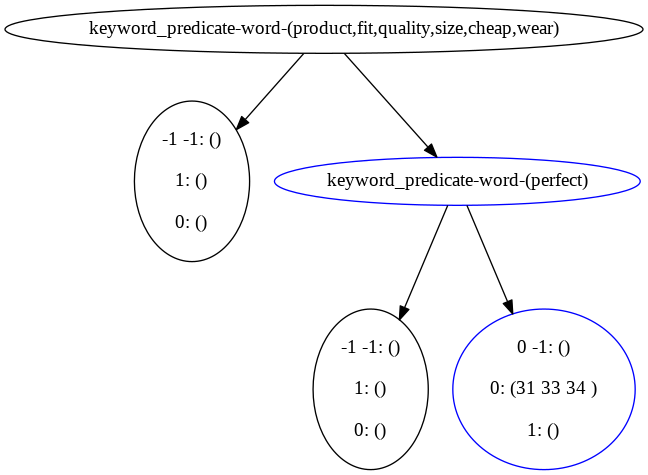

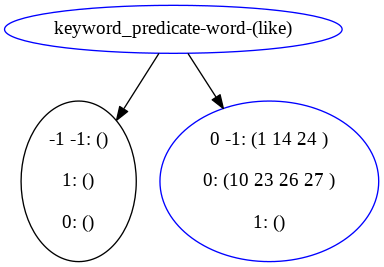

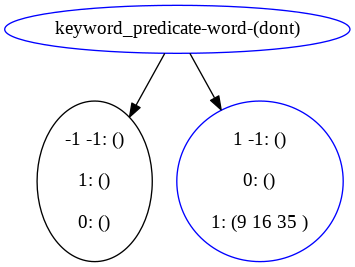

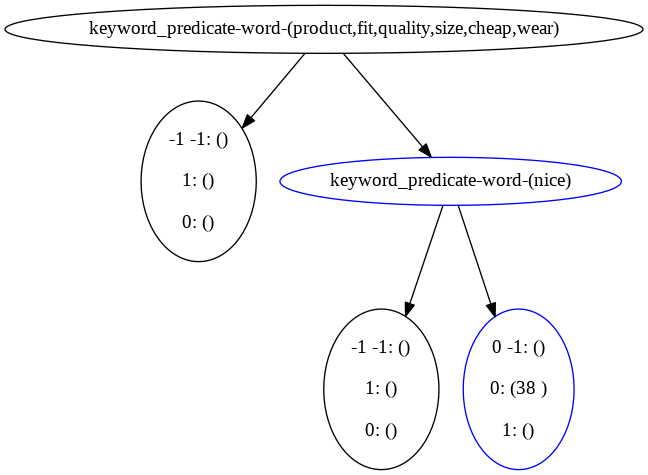

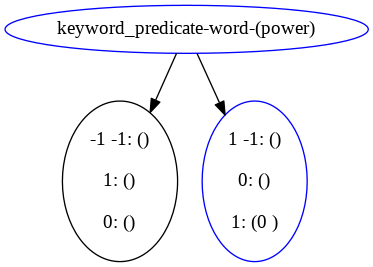

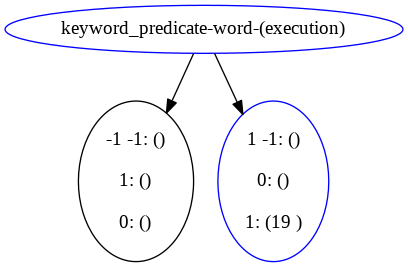

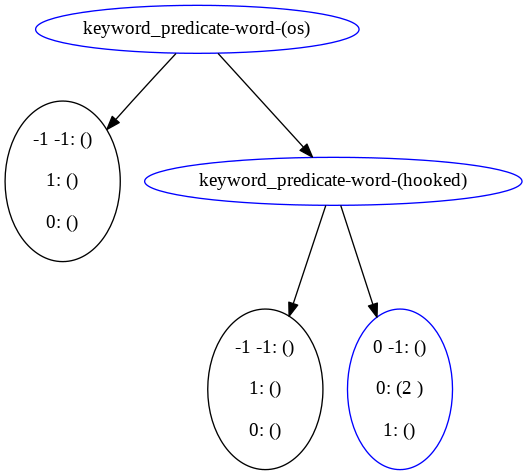

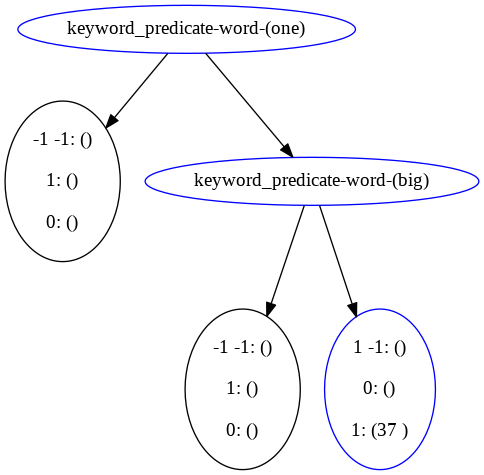

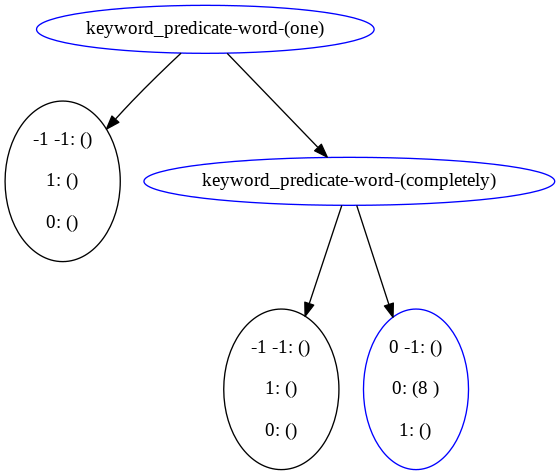

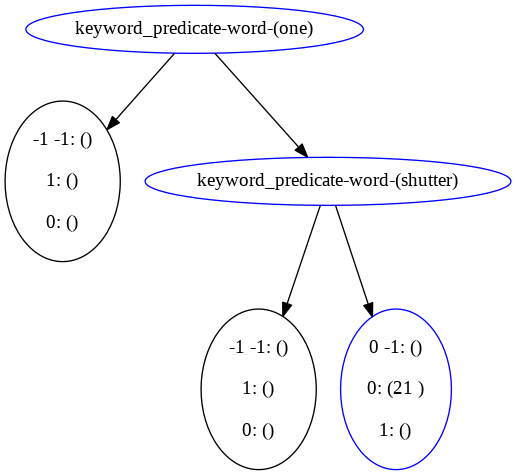



-----------------------------------------------------
original tree 2


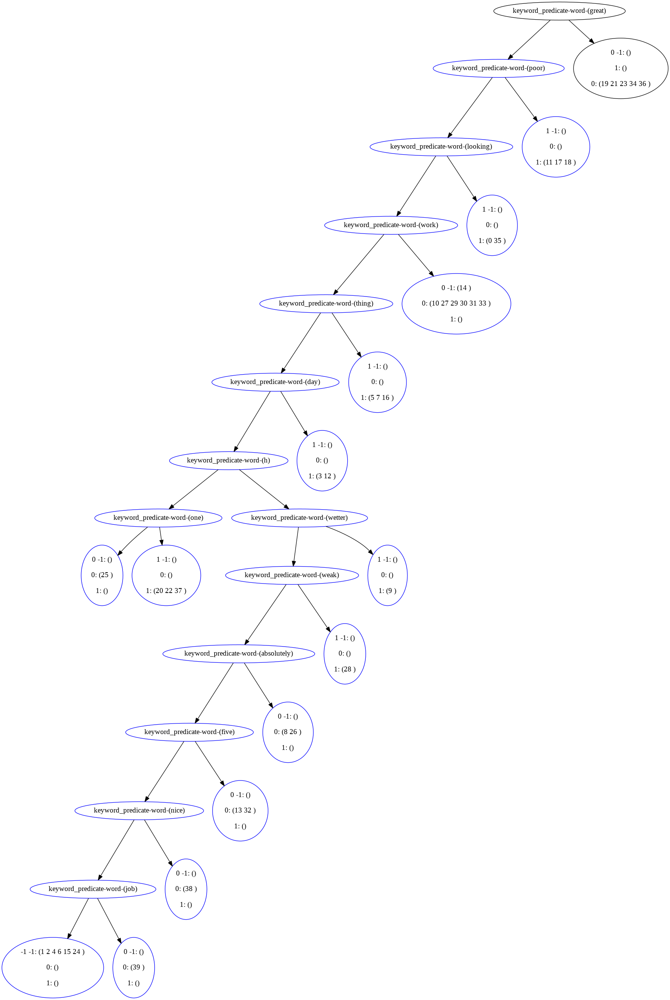

























after reconstructing, original tree is


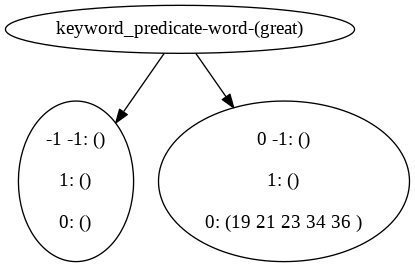



res trees before deduplication


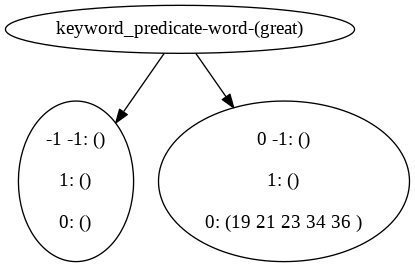

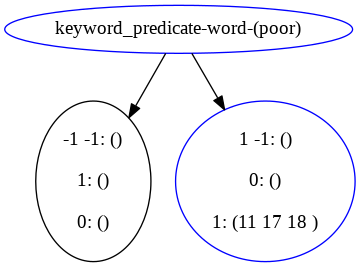

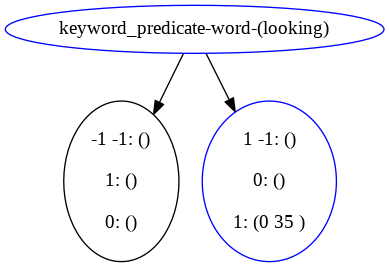

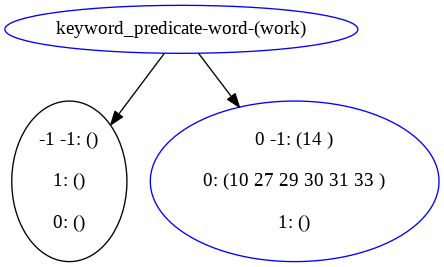

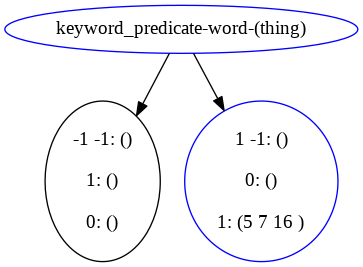

...

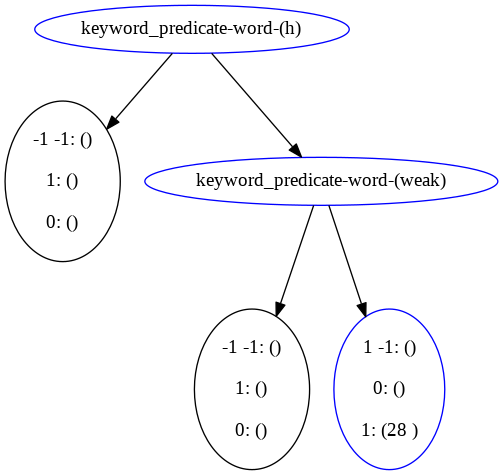

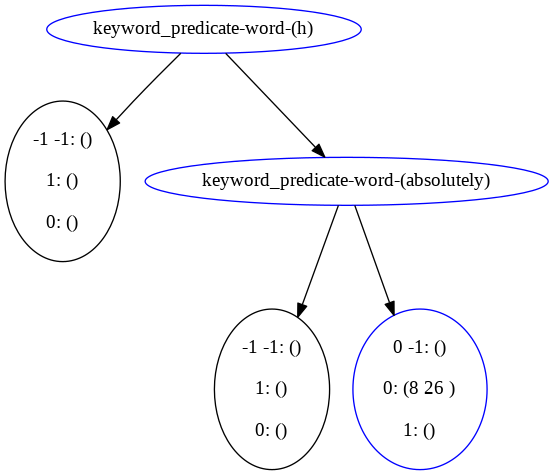

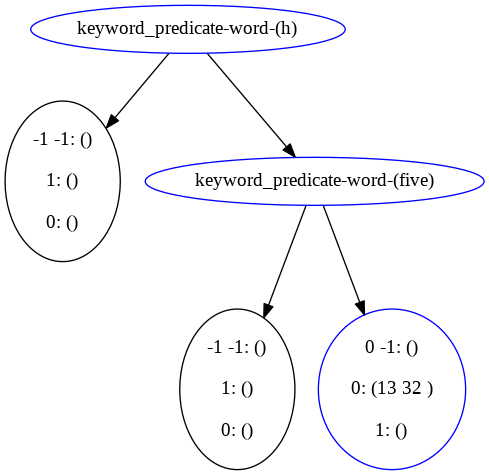

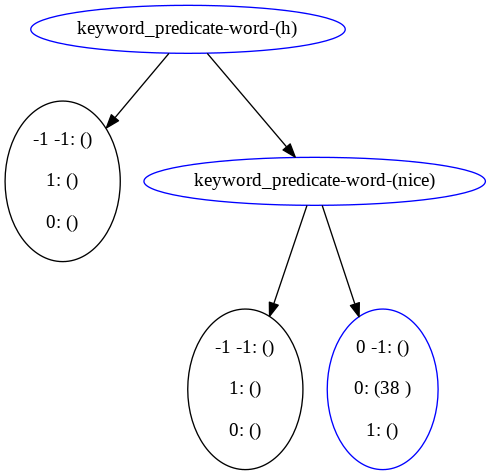

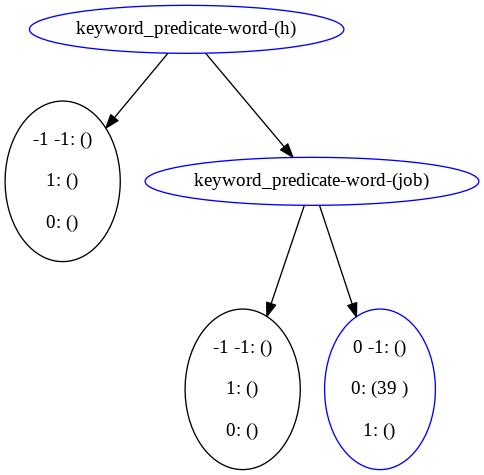



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(great))
    LabelNode(id=43, label=-1)
    LabelNode(id=3, label=0)
candidate res tree:
PredicateNode(id=4, pred=keyword_predicate-word-(poor), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=6, label=1, added=True)
candidate res tree:
PredicateNode(id=7, pred=keyword_predicate-word-(looking), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=9, label=1, added=True)
candidate res tree:
PredicateNode(id=10, pred=keyword_predicate-word-(work), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=12, label=0, added=True)
candidate res tree:
PredicateNode(id=13, pred=keyword_predicate-word-(thing), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=15, label=1, added=True)
candidate res tree:
PredicateNode(id=16, pred=keyword_predicate-word-(day), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=18, label=1, add

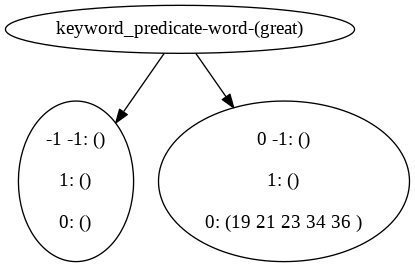

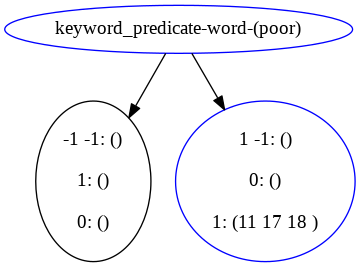

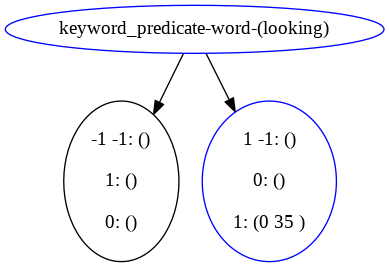

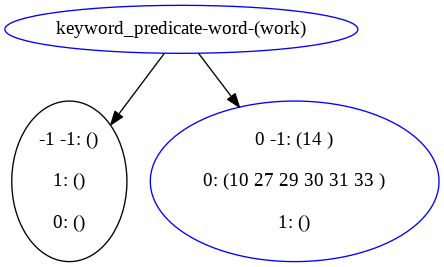

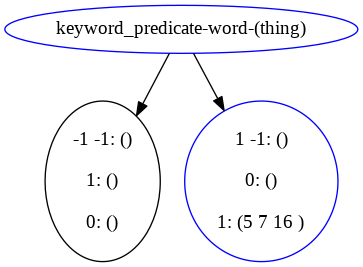

...

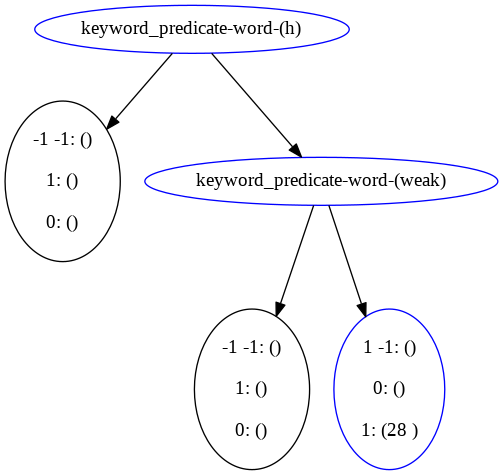

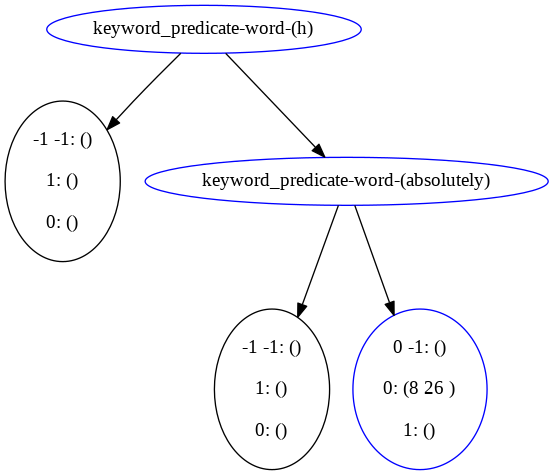

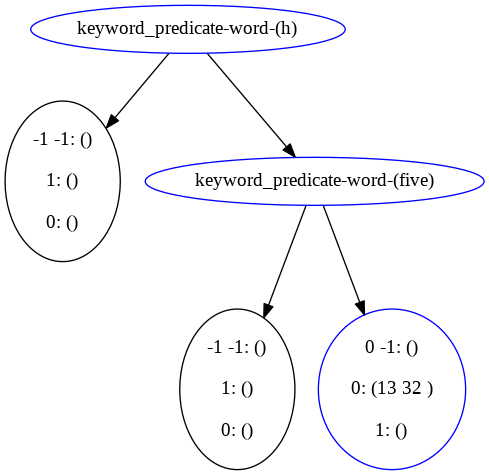

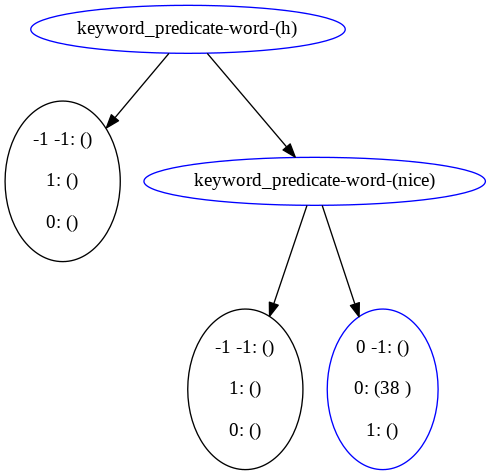

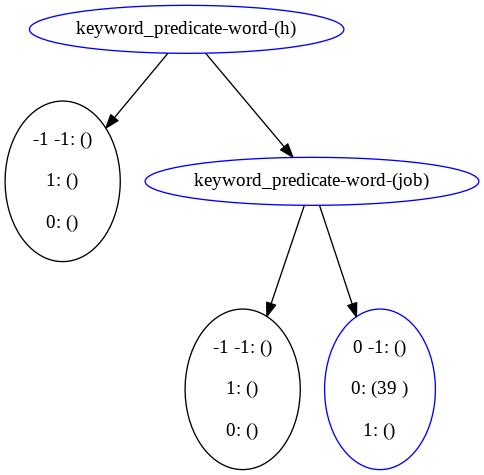



-----------------------------------------------------
original tree 3


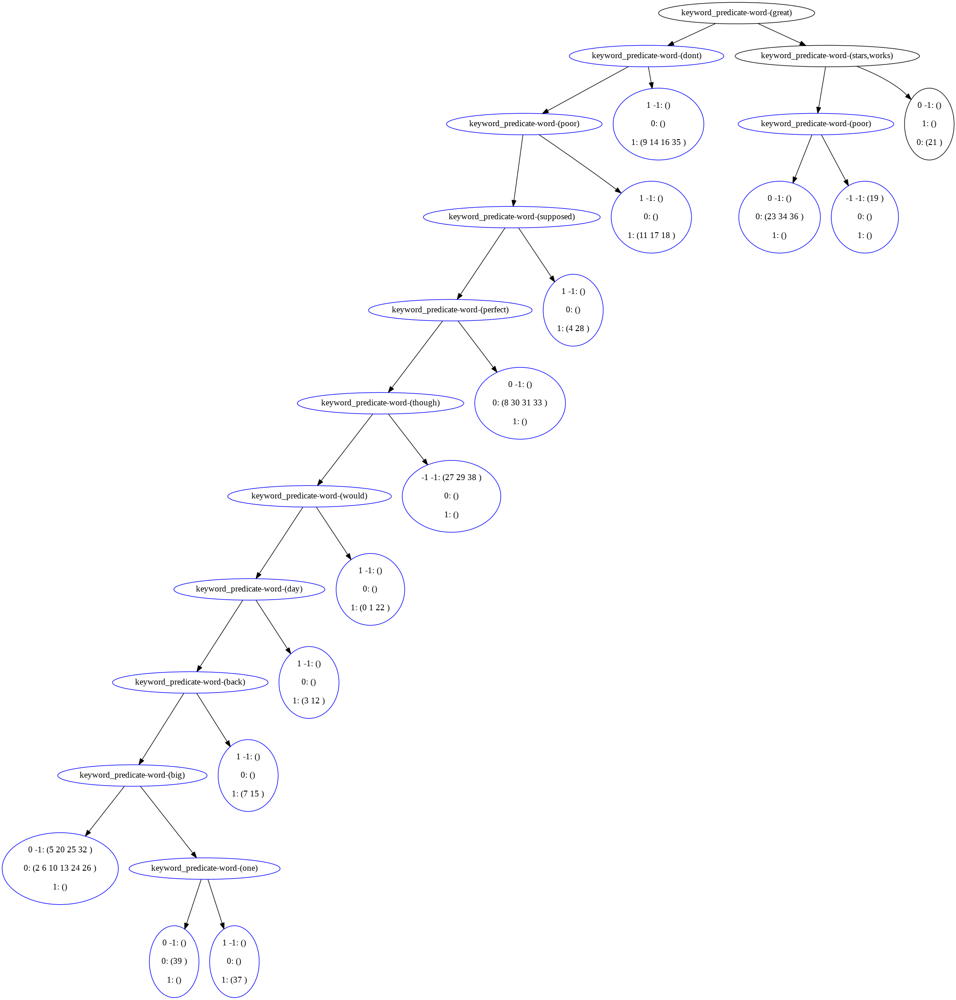





















after reconstructing, original tree is


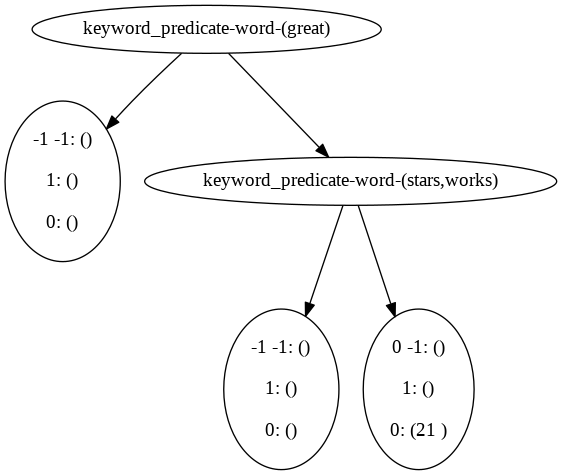



res trees before deduplication


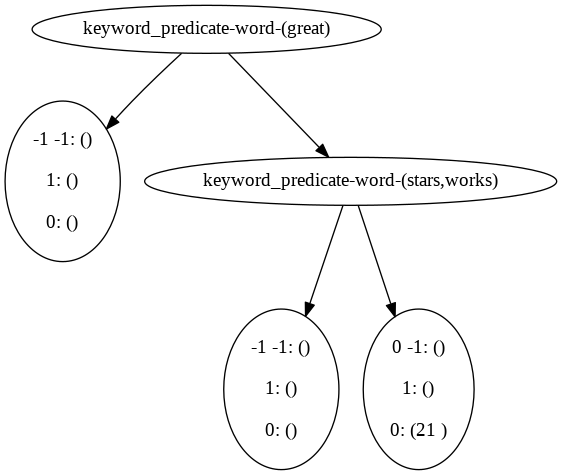

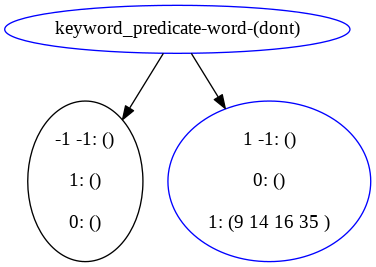

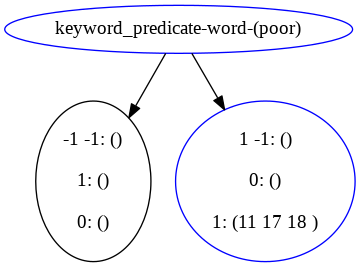

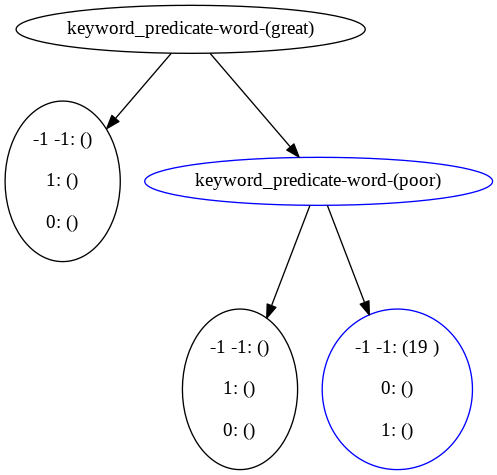

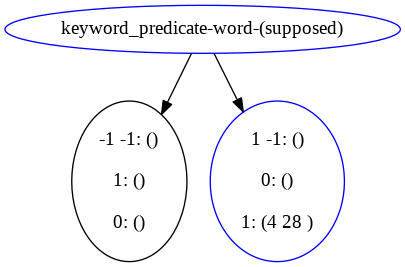

...

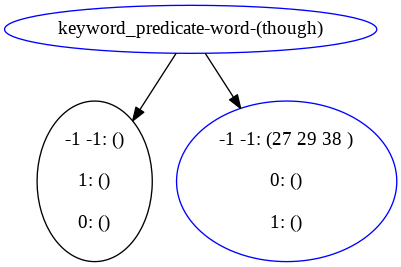

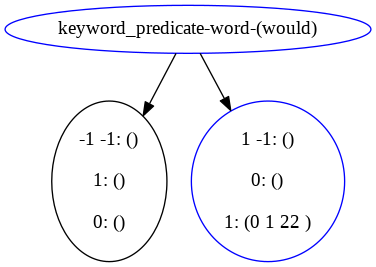

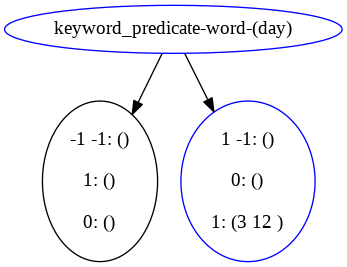

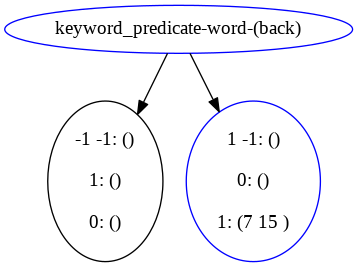

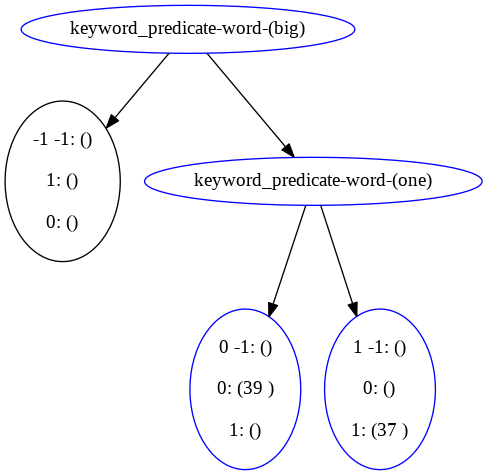



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(great))
    LabelNode(id=39, label=-1)
    PredicateNode(id=3, pred=keyword_predicate-word-(stars,works))
        LabelNode(id=41, label=-1)
        LabelNode(id=5, label=0)
candidate res tree:
PredicateNode(id=6, pred=keyword_predicate-word-(dont), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=8, label=1, added=True)
candidate res tree:
PredicateNode(id=12, pred=keyword_predicate-word-(poor), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=14, label=1, added=True)
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(great))
    LabelNode(id=added_2, label=-1)
    PredicateNode(id=9, pred=keyword_predicate-word-(poor), added=True)
        LabelNode(id=added_1, label=-1)
        LabelNode(id=11, label=-1, added=True)
candidate res tree:
PredicateNode(id=15, pred=keyword_predicate-word-(supposed), added=True)
    LabelNode(id=added

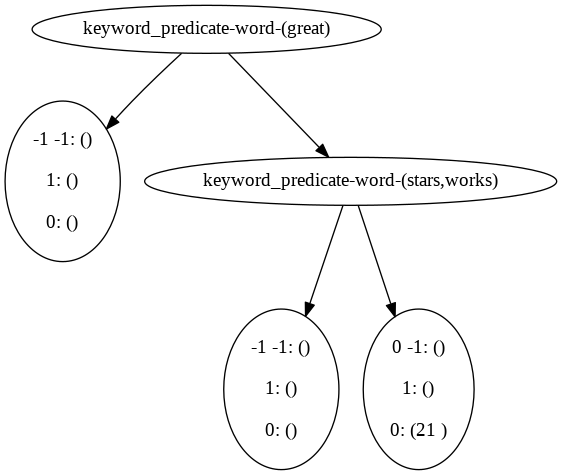

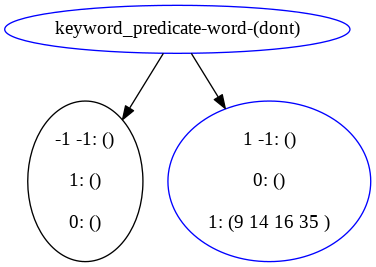

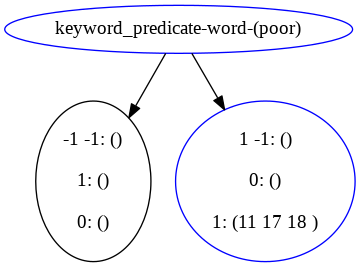

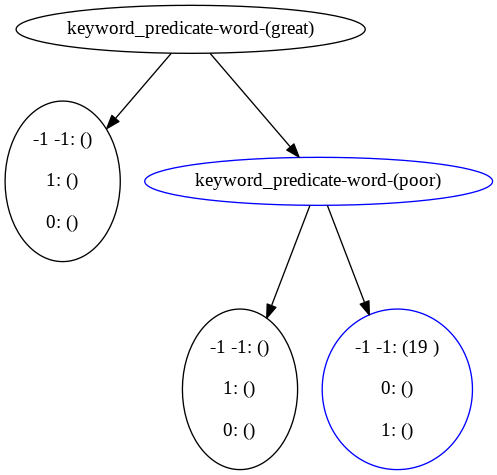

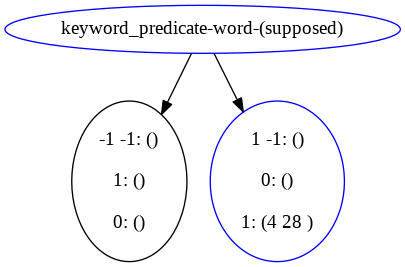

...

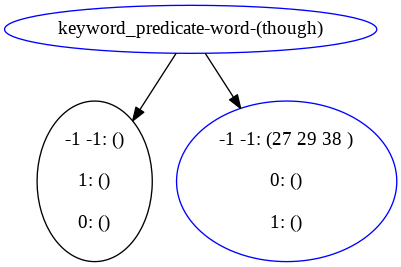

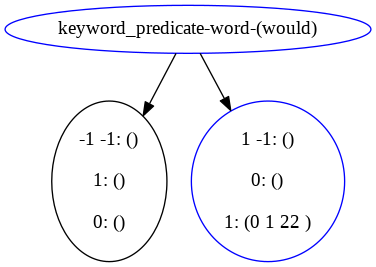

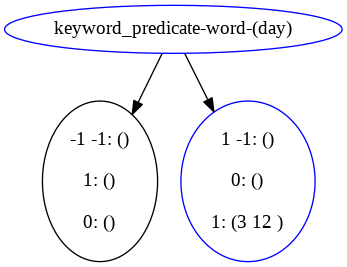

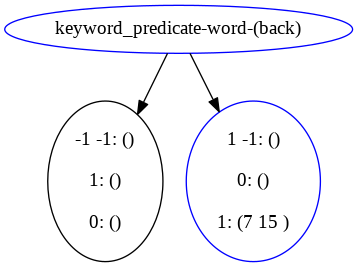

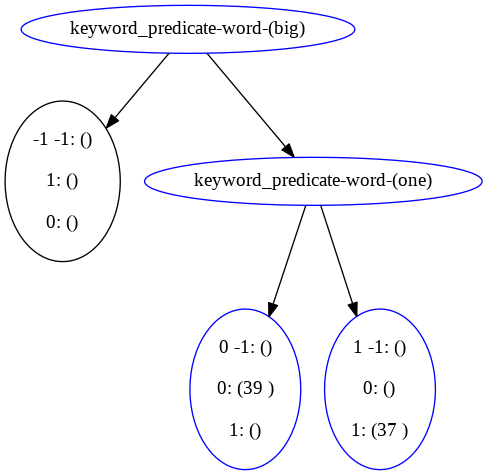



-----------------------------------------------------
original tree 4


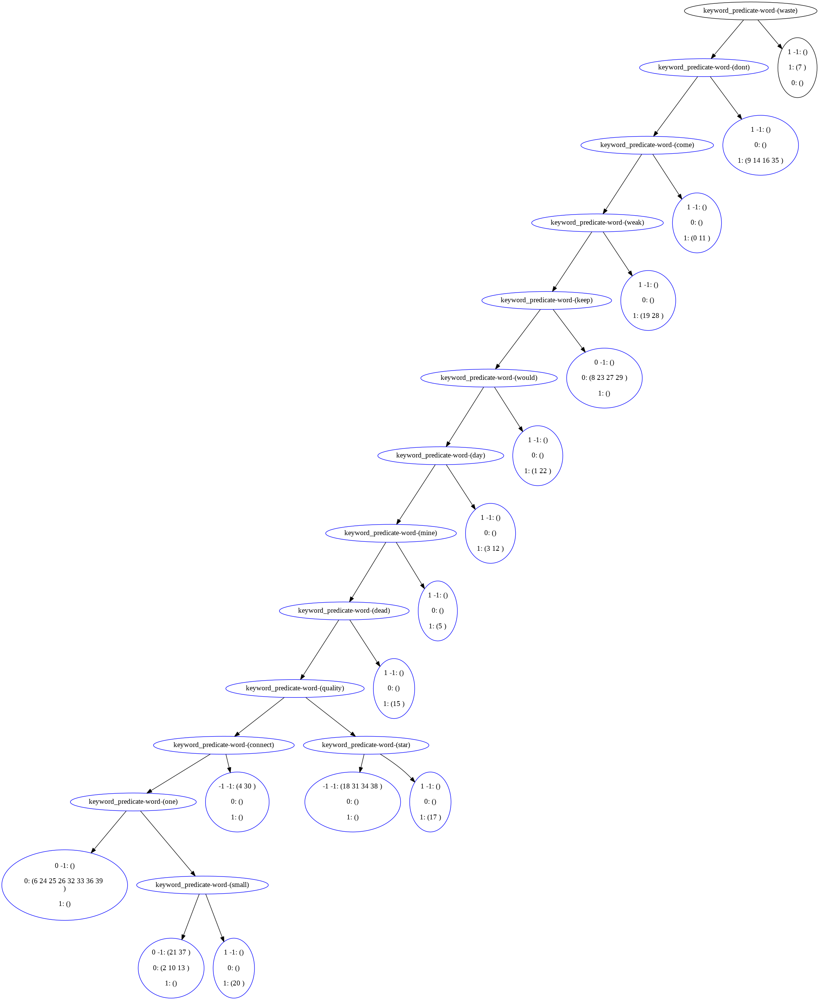























after reconstructing, original tree is


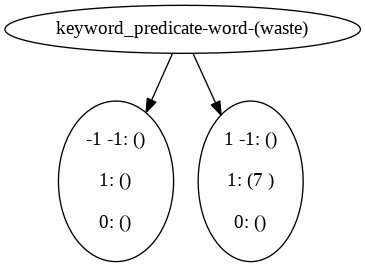



res trees before deduplication


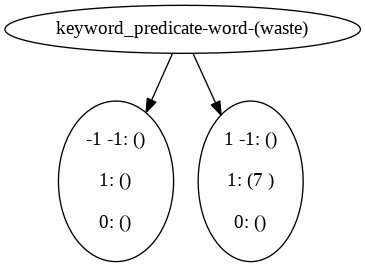

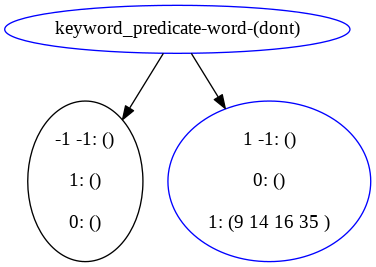

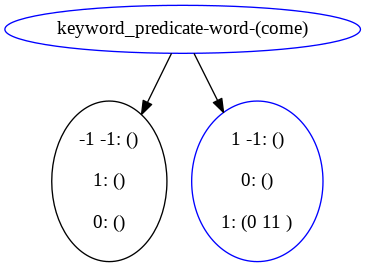

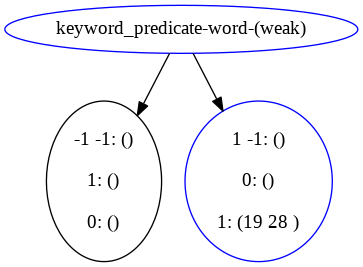

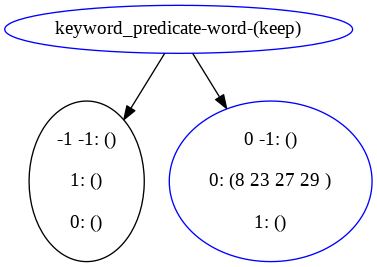

...

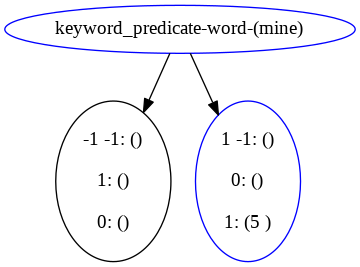

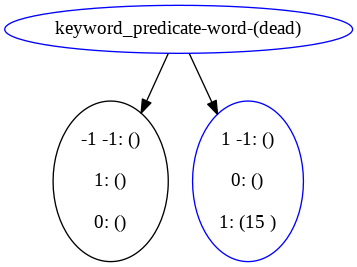

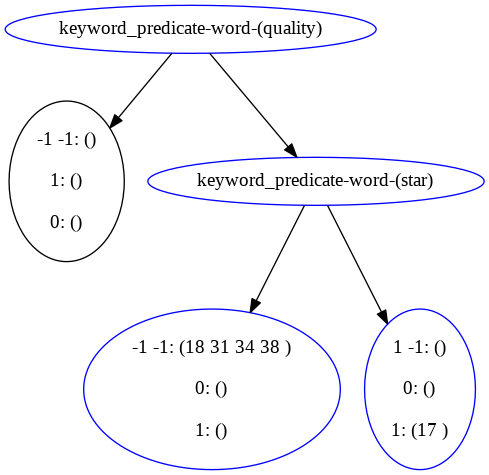

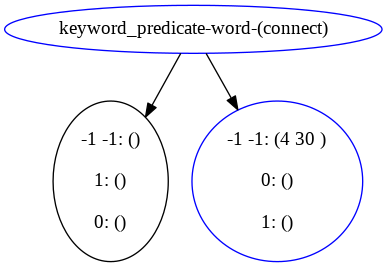

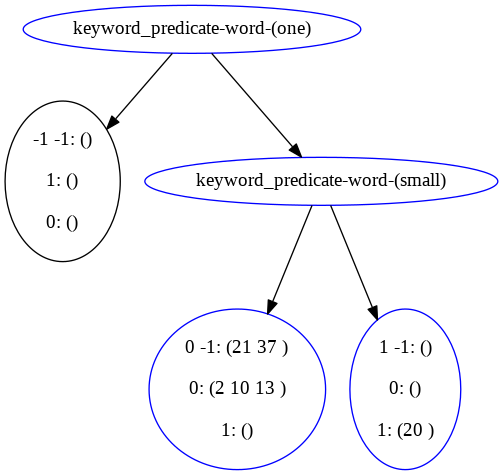



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(waste))
    LabelNode(id=43, label=-1)
    LabelNode(id=3, label=1)
candidate res tree:
PredicateNode(id=4, pred=keyword_predicate-word-(dont), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=6, label=1, added=True)
candidate res tree:
PredicateNode(id=7, pred=keyword_predicate-word-(come), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=9, label=1, added=True)
candidate res tree:
PredicateNode(id=10, pred=keyword_predicate-word-(weak), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=12, label=1, added=True)
candidate res tree:
PredicateNode(id=13, pred=keyword_predicate-word-(keep), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=15, label=0, added=True)
candidate res tree:
PredicateNode(id=16, pred=keyword_predicate-word-(would), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=18, label=1, added

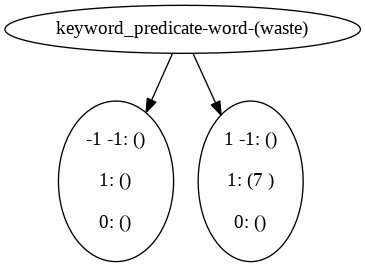

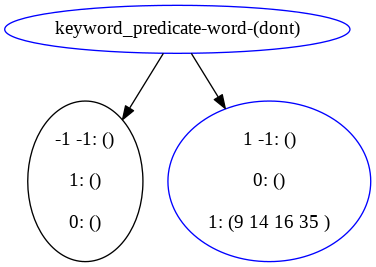

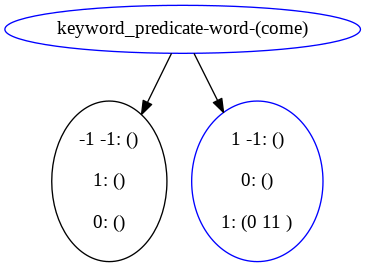

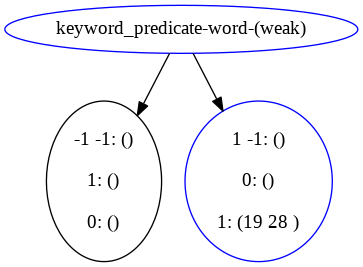

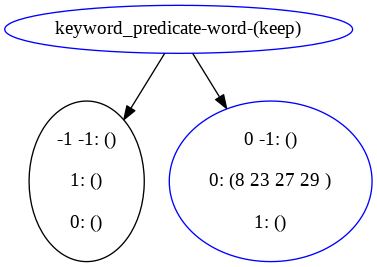

...

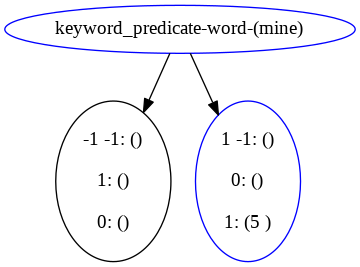

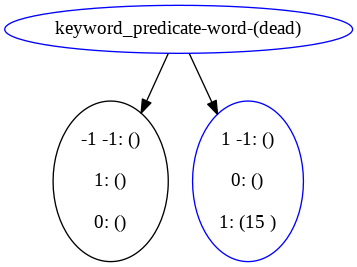

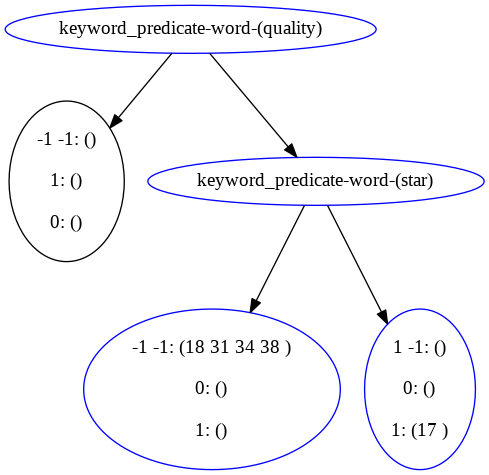

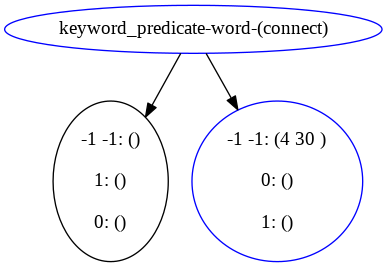

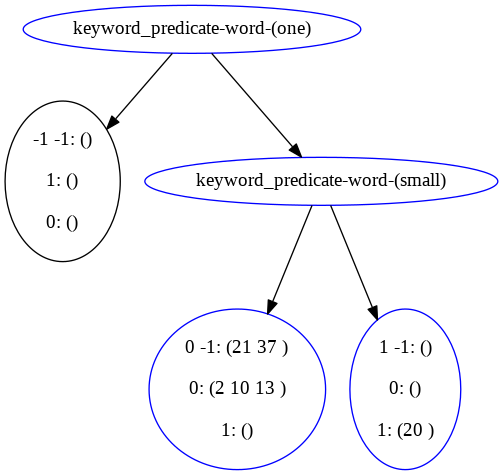



-----------------------------------------------------
original tree 5


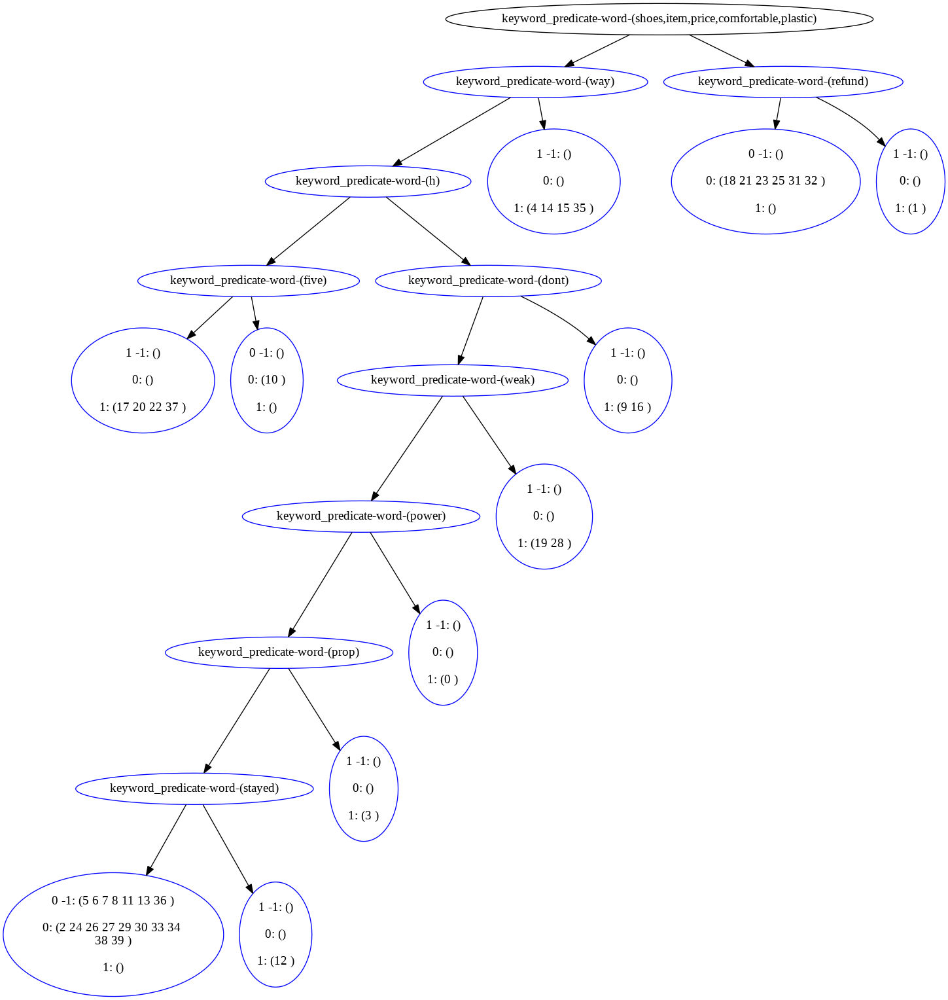















after reconstructing, original tree is


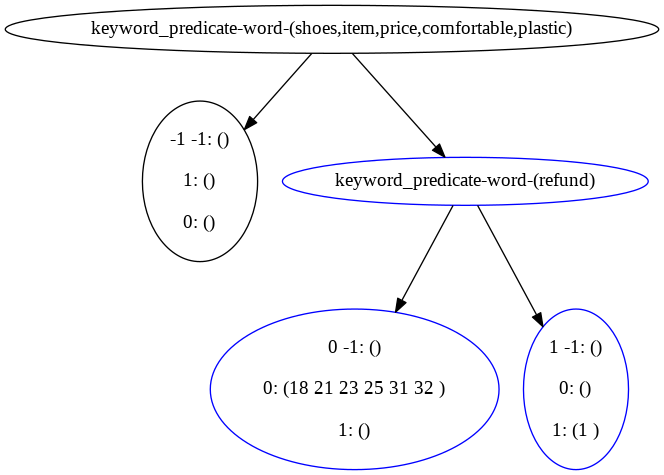



res trees before deduplication


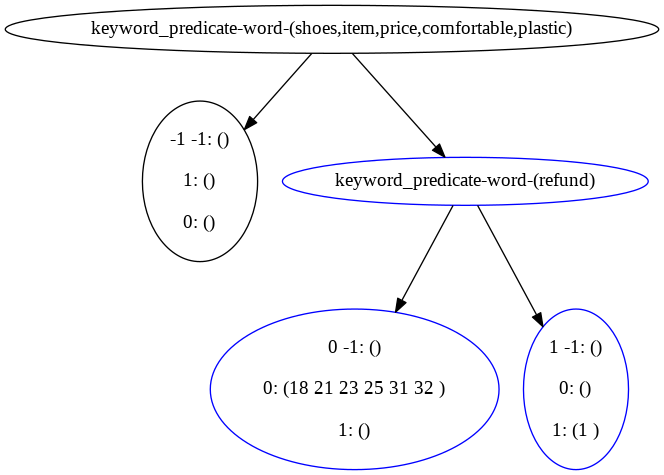

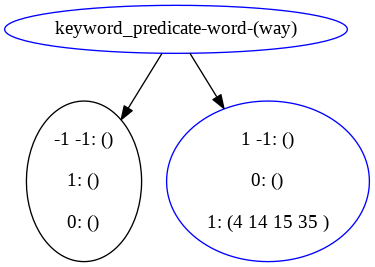

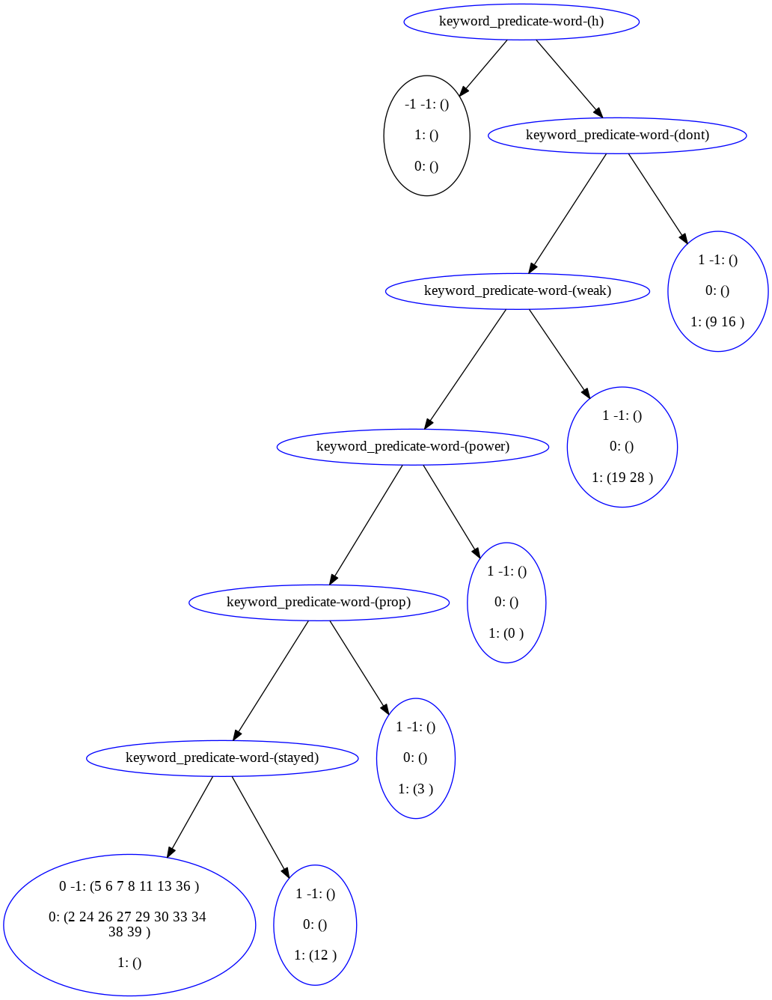

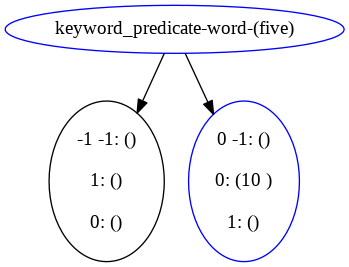

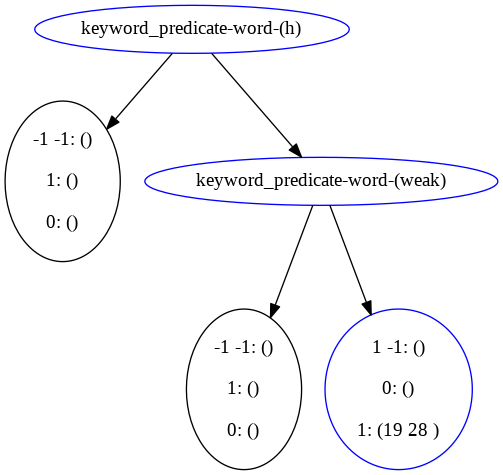

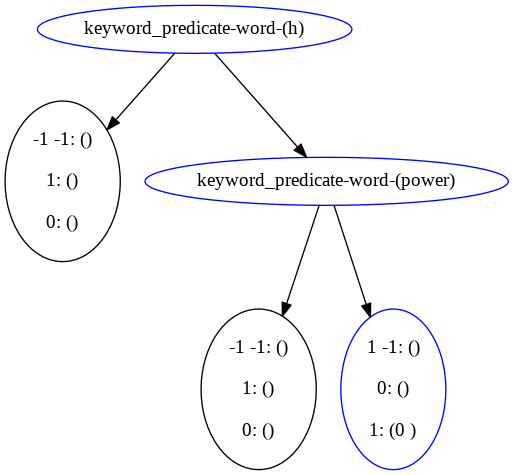

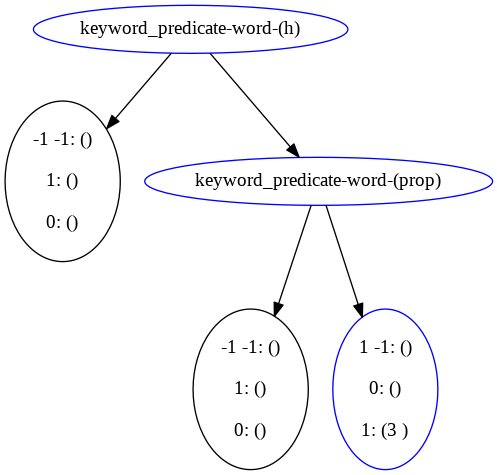

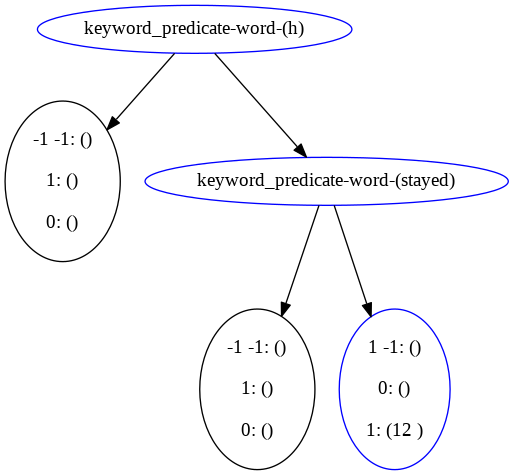



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(shoes,item,price,comfortable,plastic))
    LabelNode(id=31, label=-1)
    PredicateNode(id=7, pred=keyword_predicate-word-(refund), added=True)
        LabelNode(id=8, label=0, added=True)
        LabelNode(id=9, label=1, added=True)
candidate res tree:
PredicateNode(id=4, pred=keyword_predicate-word-(way), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=6, label=1, added=True)
candidate res tree:
PredicateNode(id=10, pred=keyword_predicate-word-(h), added=True)
    LabelNode(id=added_1, label=-1)
    PredicateNode(id=16, pred=keyword_predicate-word-(dont), added=True)
        PredicateNode(id=19, pred=keyword_predicate-word-(weak), added=True)
            PredicateNode(id=22, pred=keyword_predicate-word-(power), added=True)
                PredicateNode(id=25, pred=keyword_predicate-word-(prop), added=True)
                    PredicateNode(id=28, pred=keyword_pr

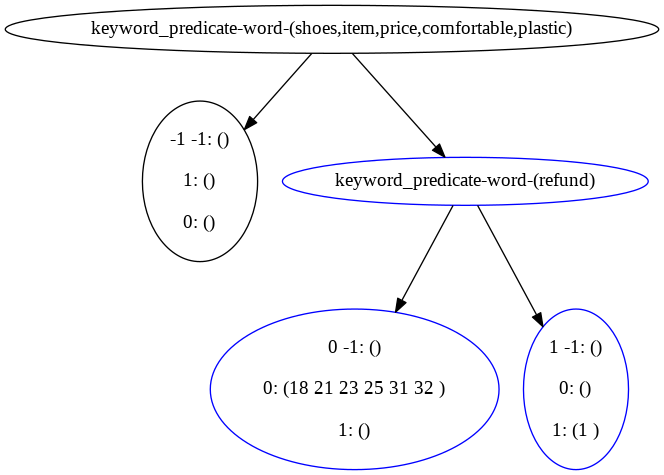

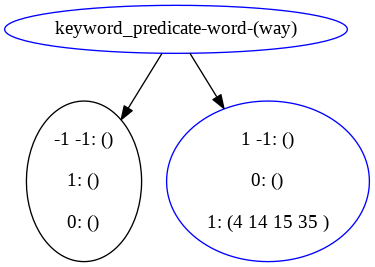

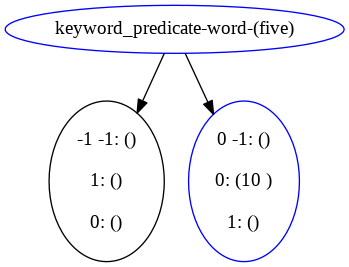

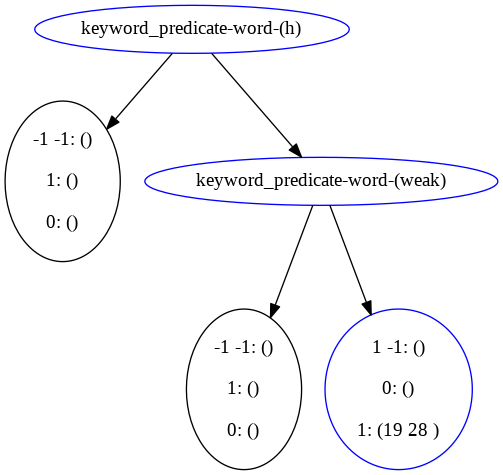

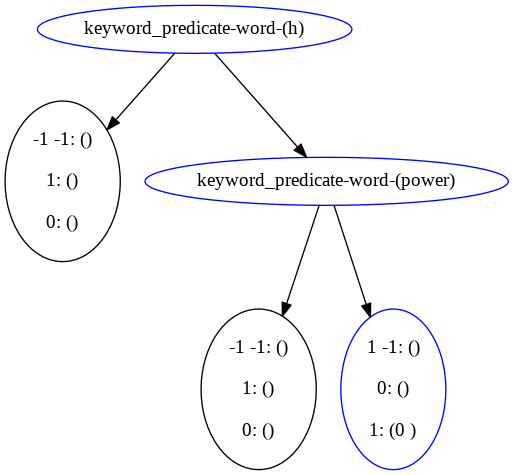

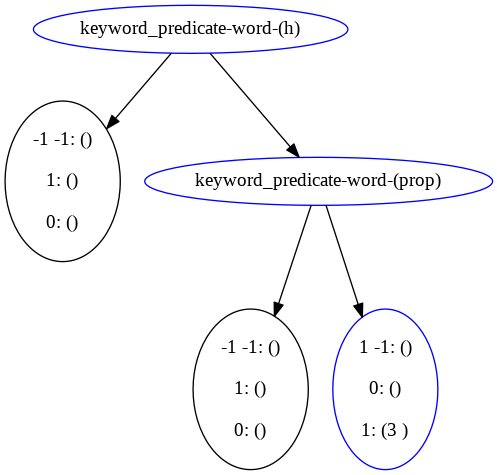

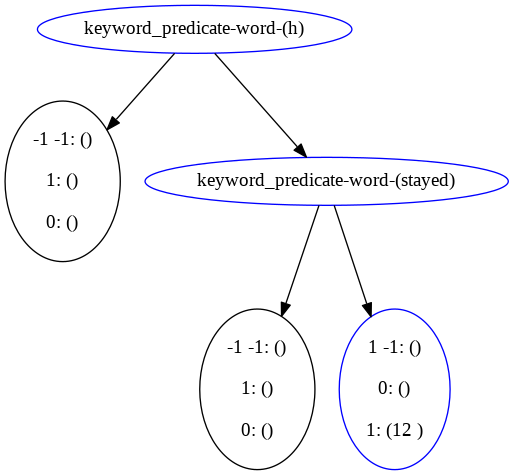



-----------------------------------------------------
original tree 6


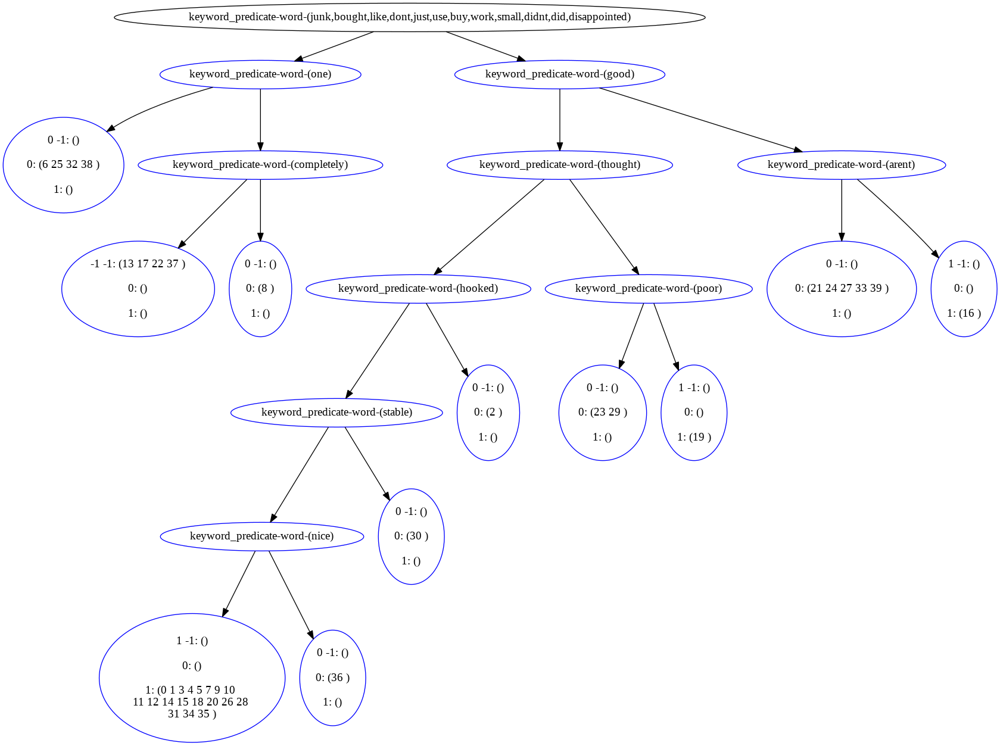











after reconstructing, original tree is


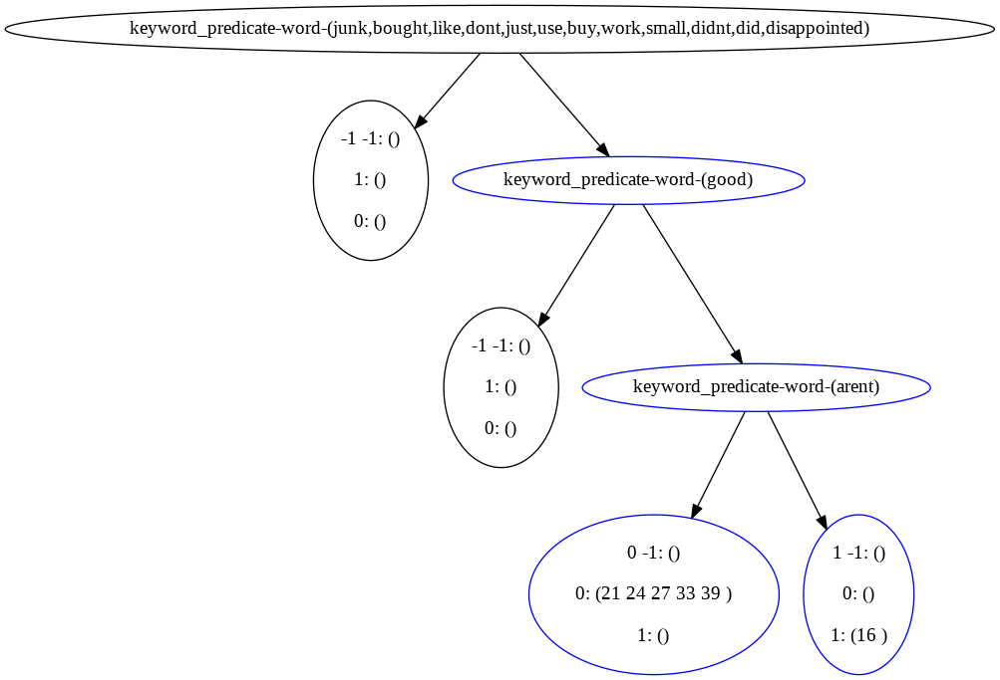



res trees before deduplication


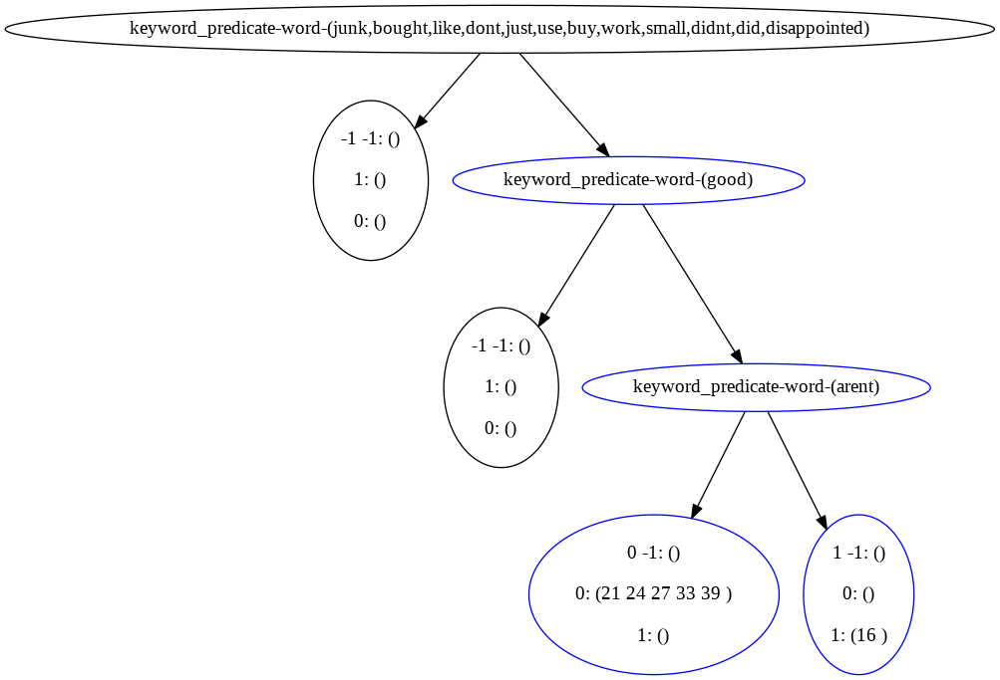

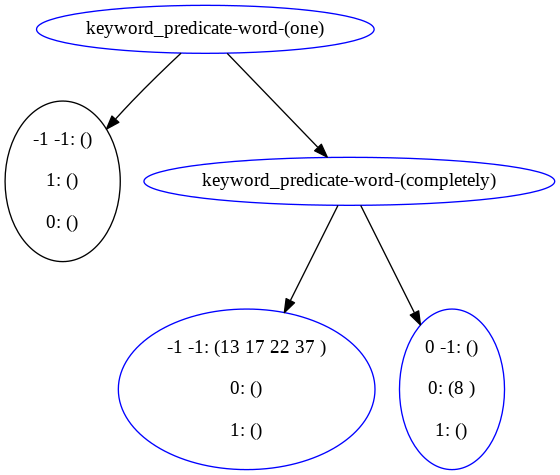

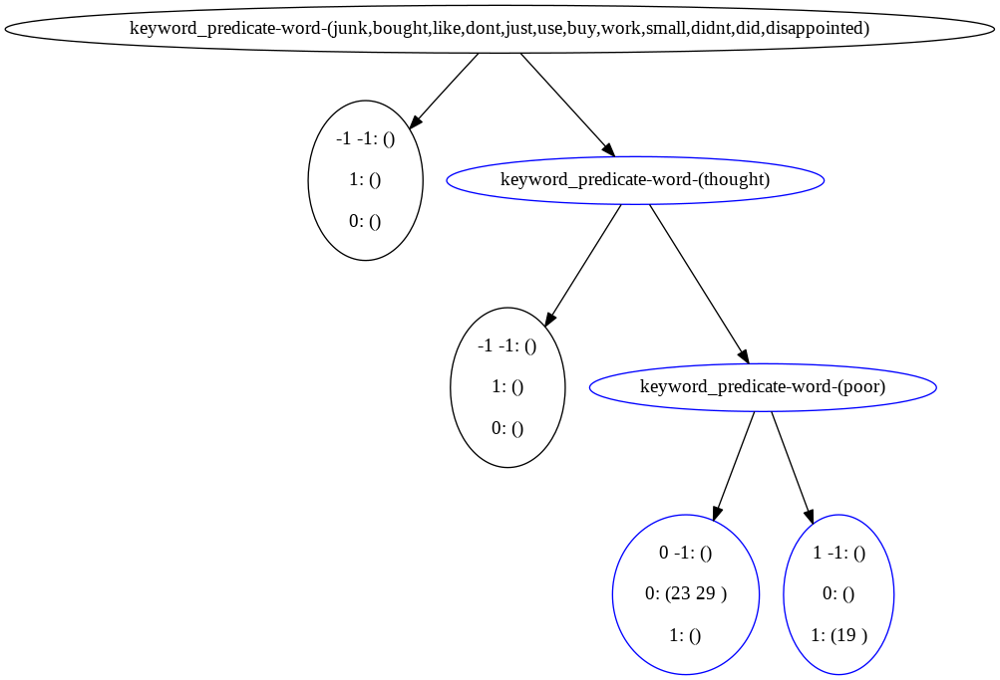

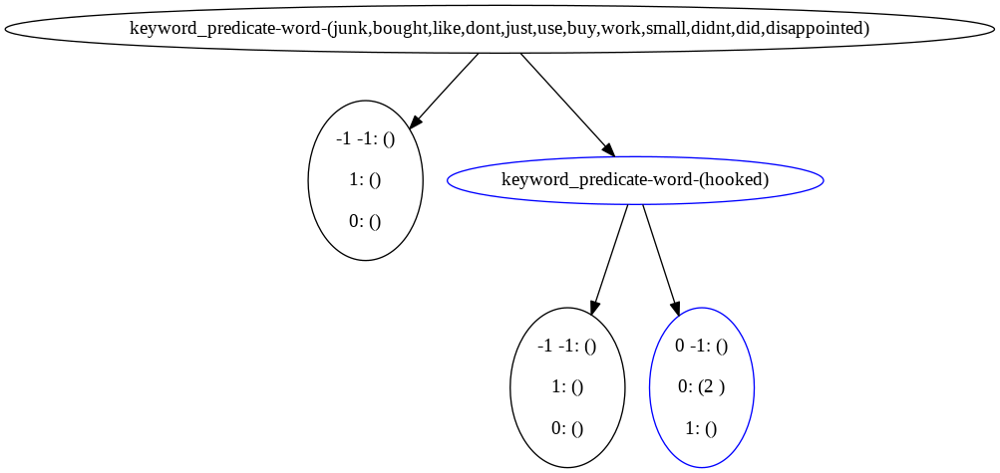

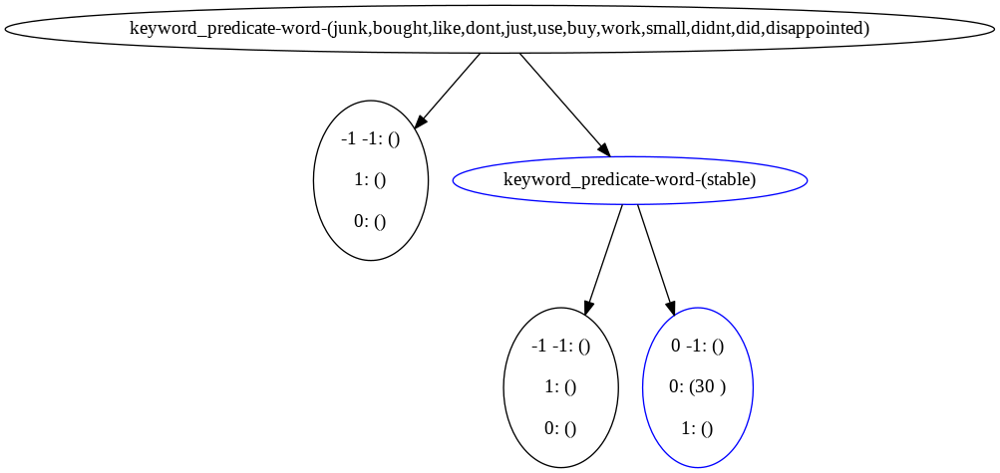

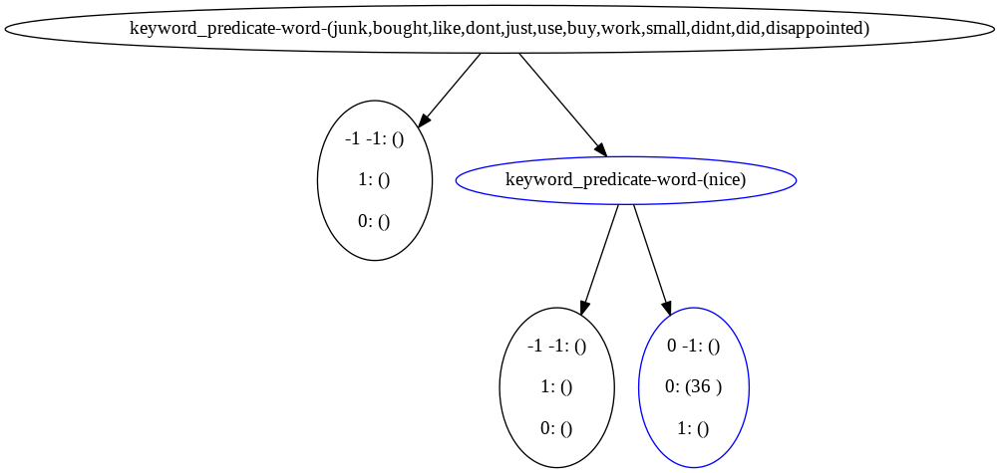



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(junk,bought,like,dont,just,use,buy,work,small,didnt,did,disappointed))
    LabelNode(id=31, label=-1)
    PredicateNode(id=4, pred=keyword_predicate-word-(good), added=True)
        LabelNode(id=32, label=-1)
        PredicateNode(id=13, pred=keyword_predicate-word-(arent), added=True)
            LabelNode(id=14, label=0, added=True)
            LabelNode(id=15, label=1, added=True)
candidate res tree:
PredicateNode(id=7, pred=keyword_predicate-word-(one), added=True)
    LabelNode(id=added_1, label=-1)
    PredicateNode(id=16, pred=keyword_predicate-word-(completely), added=True)
        LabelNode(id=17, label=-1, added=True)
        LabelNode(id=18, label=0, added=True)
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(junk,bought,like,dont,just,use,buy,work,small,didnt,did,disappointed))
    LabelNode(id=added_2, label=-1)
    PredicateNode(id=10, pred=keywo

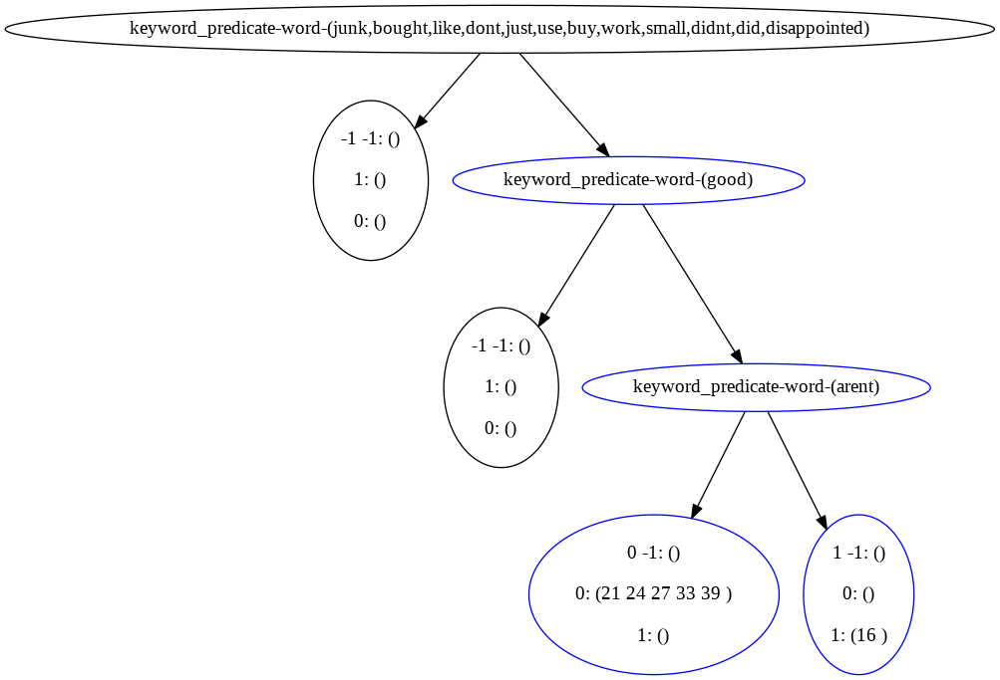

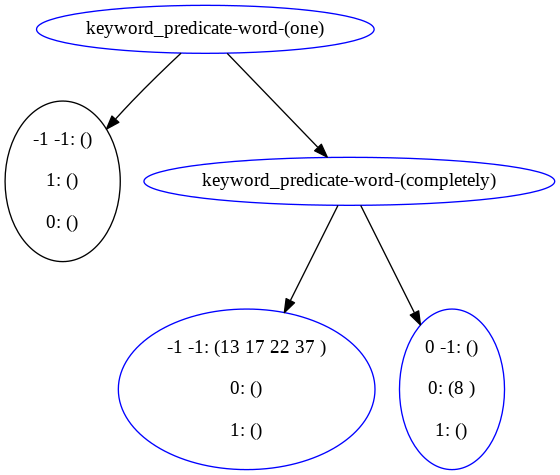

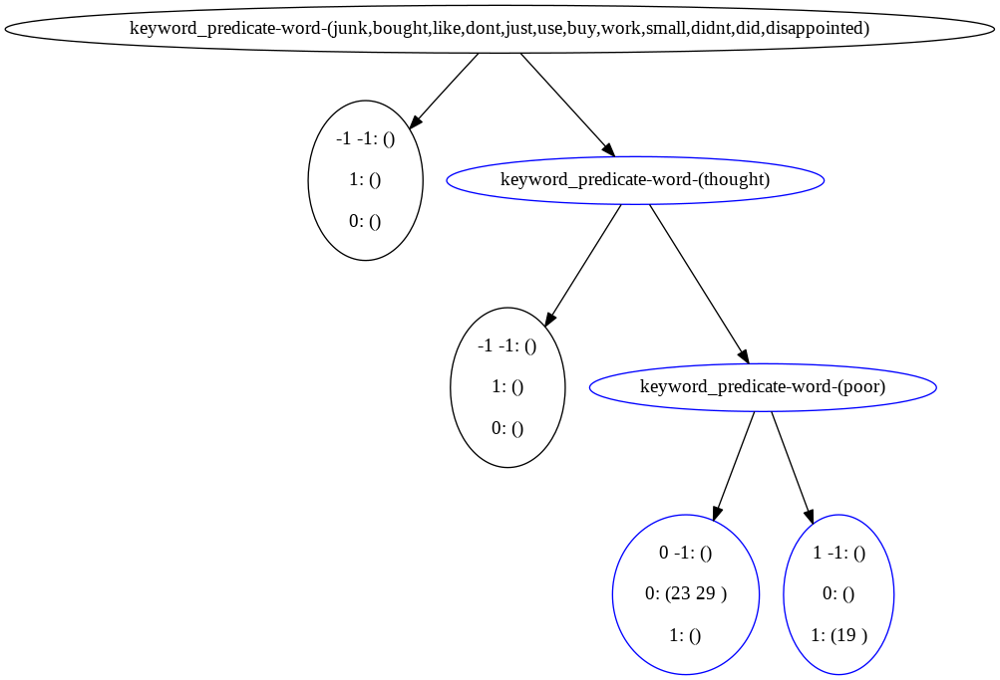

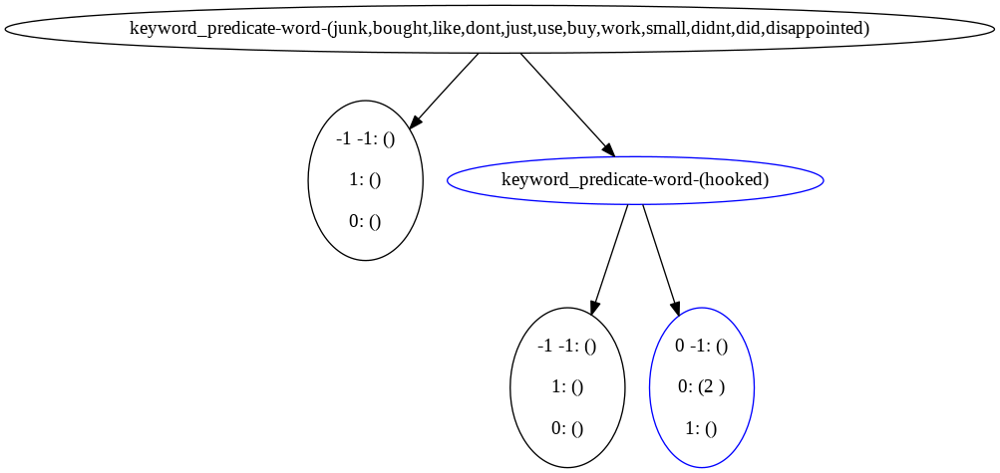

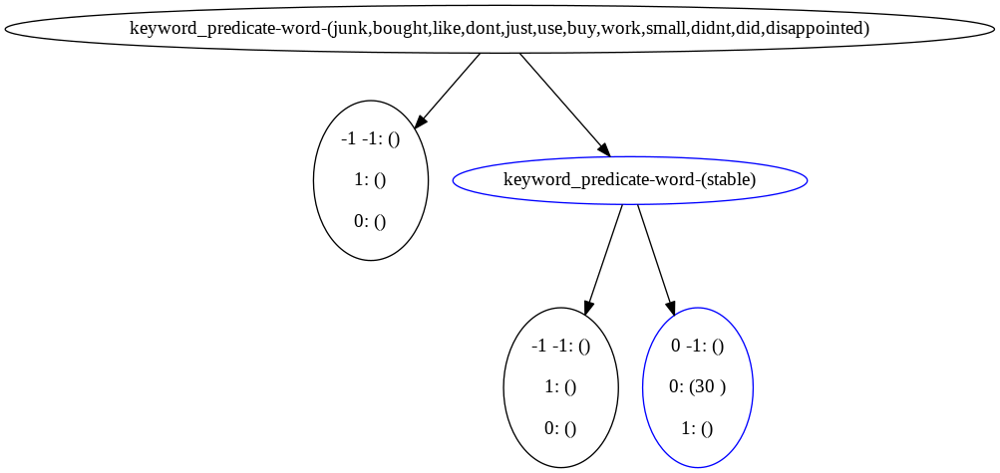

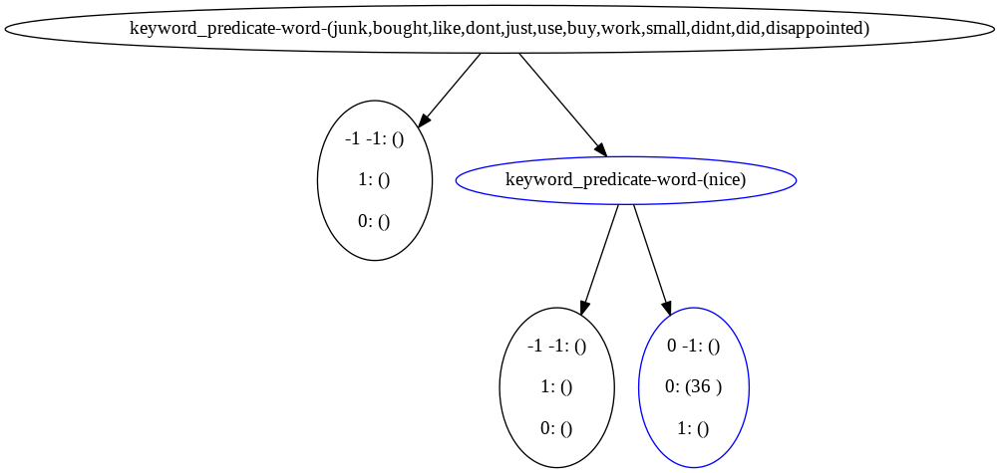



-----------------------------------------------------
original tree 7


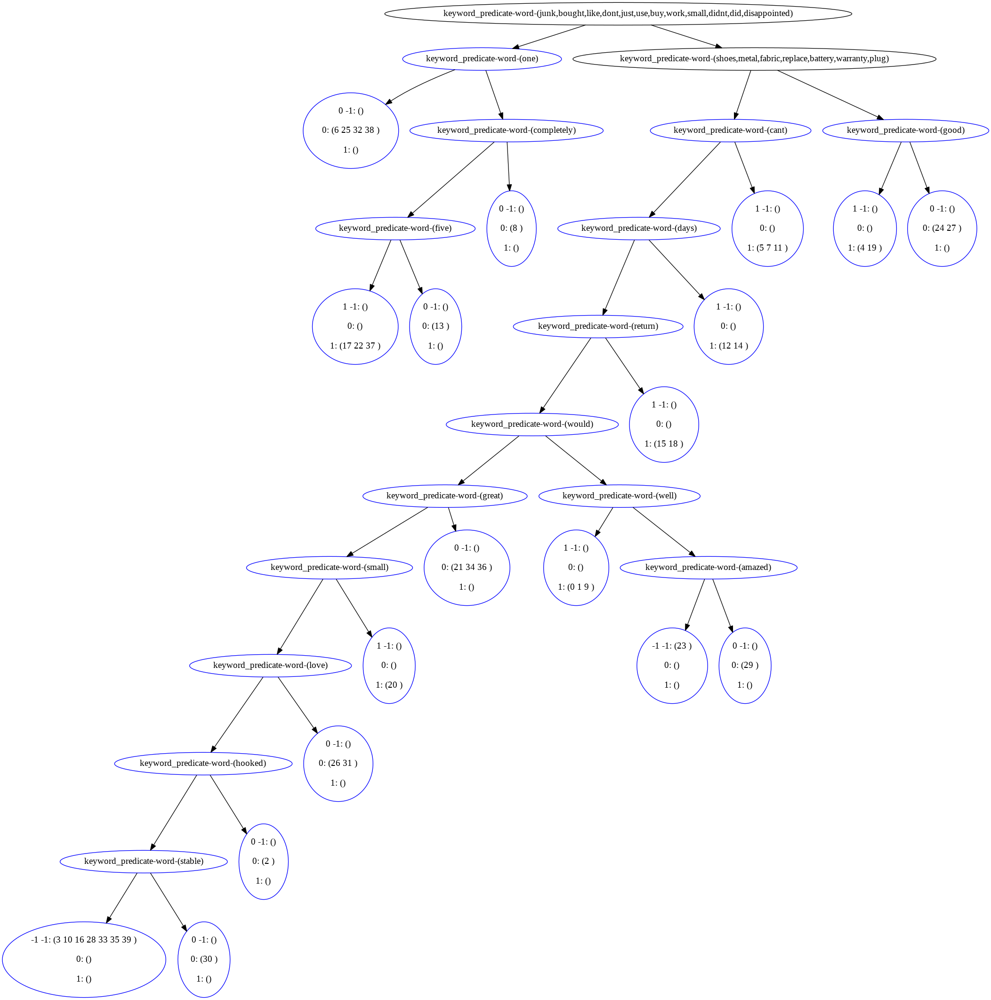























after reconstructing, original tree is


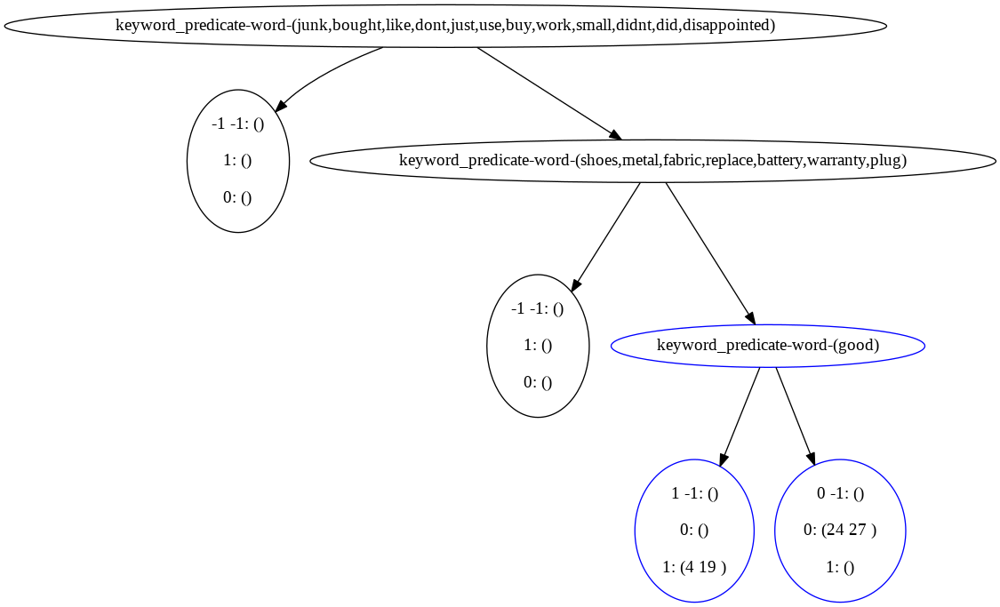



res trees before deduplication


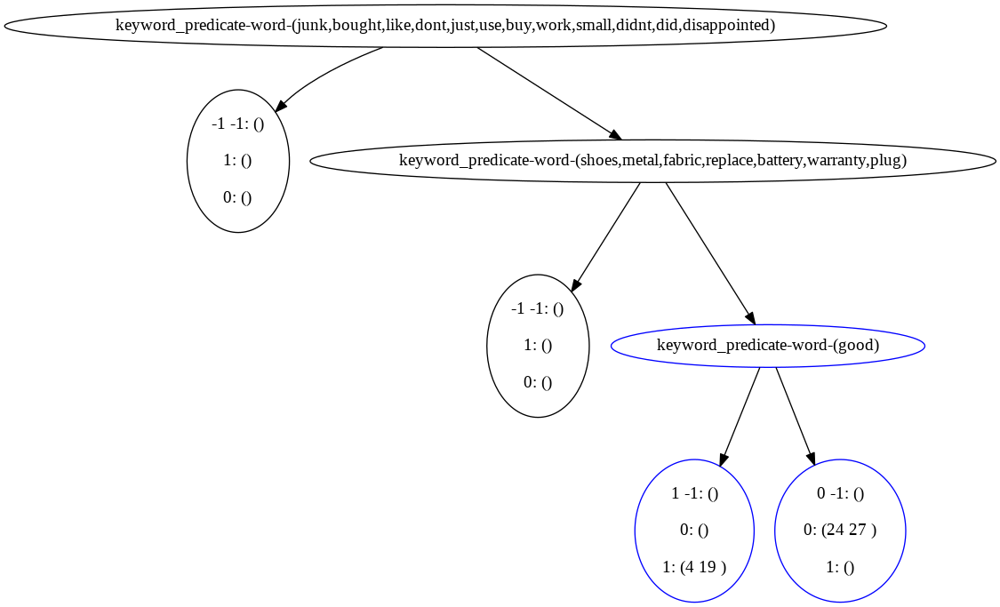

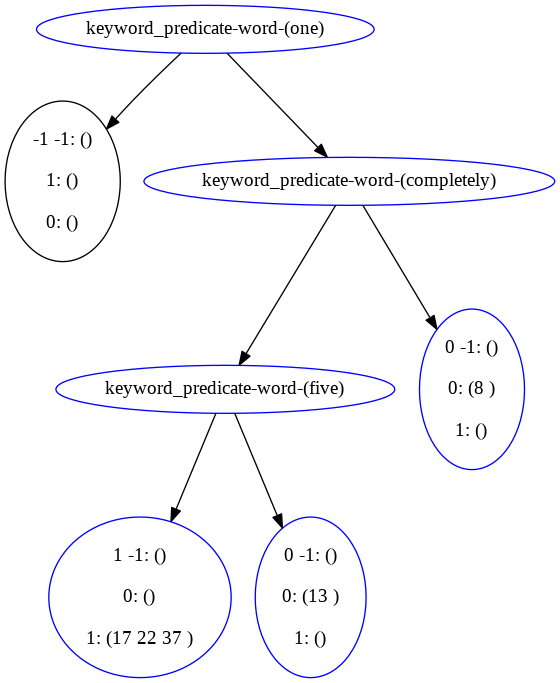

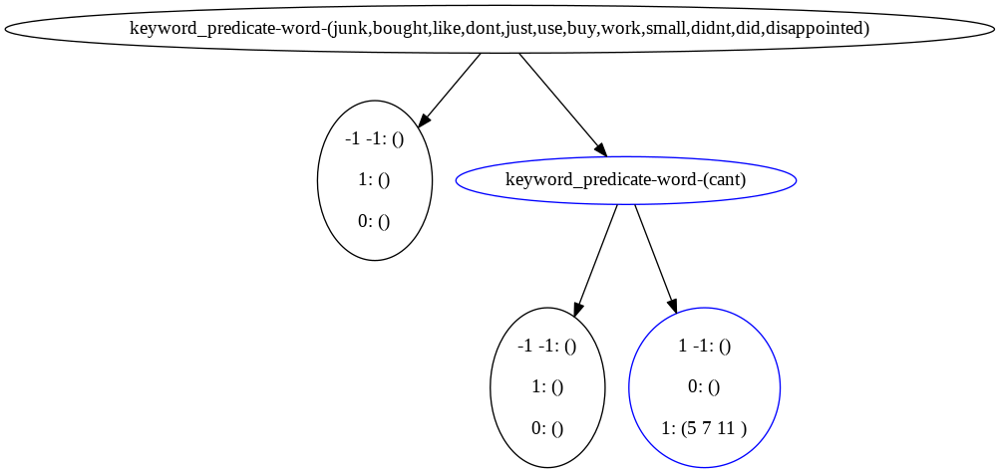

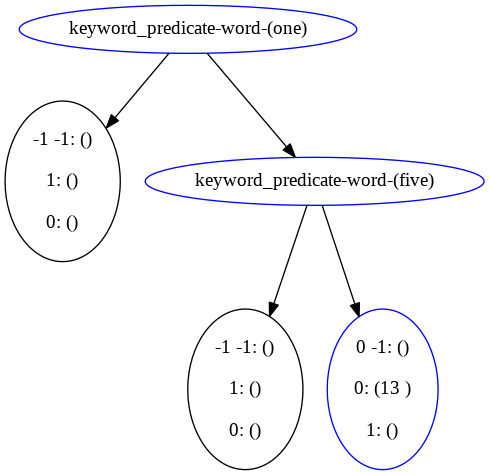

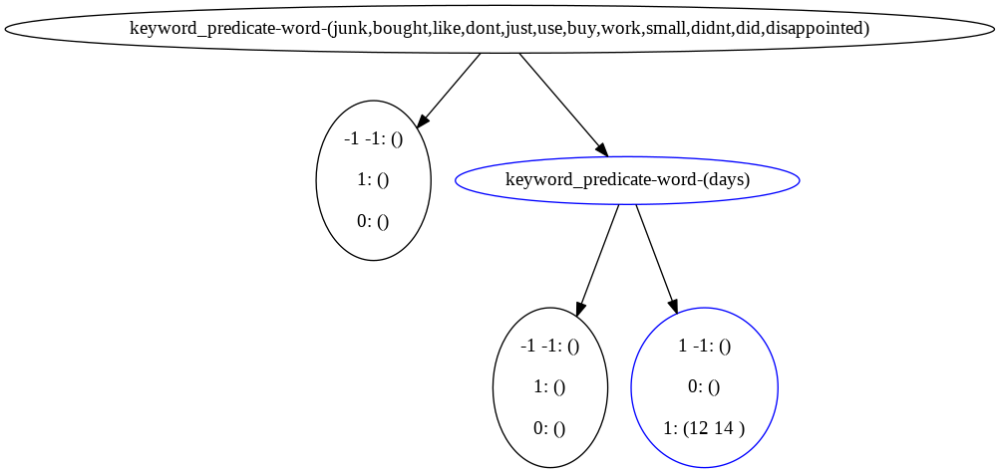

...

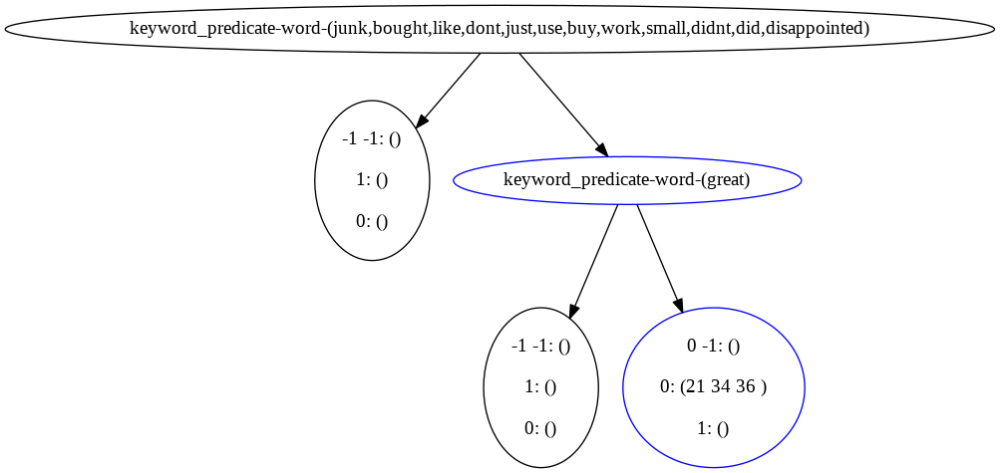

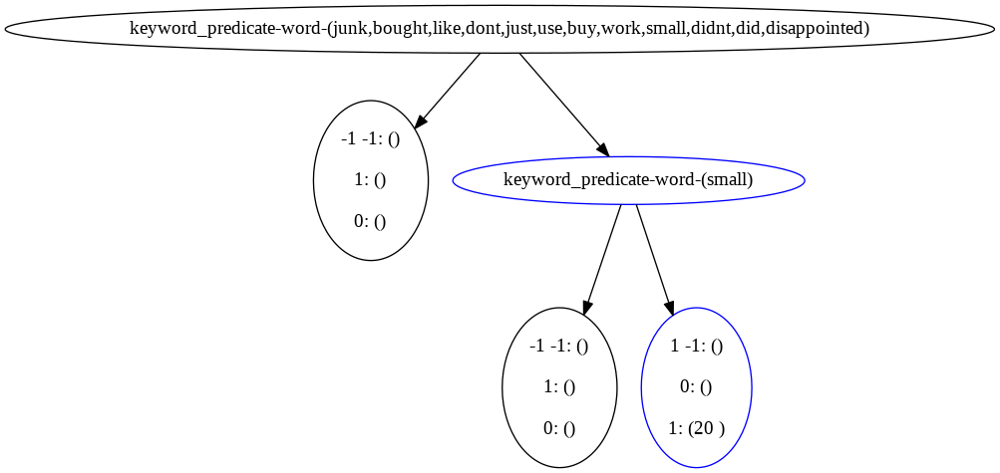

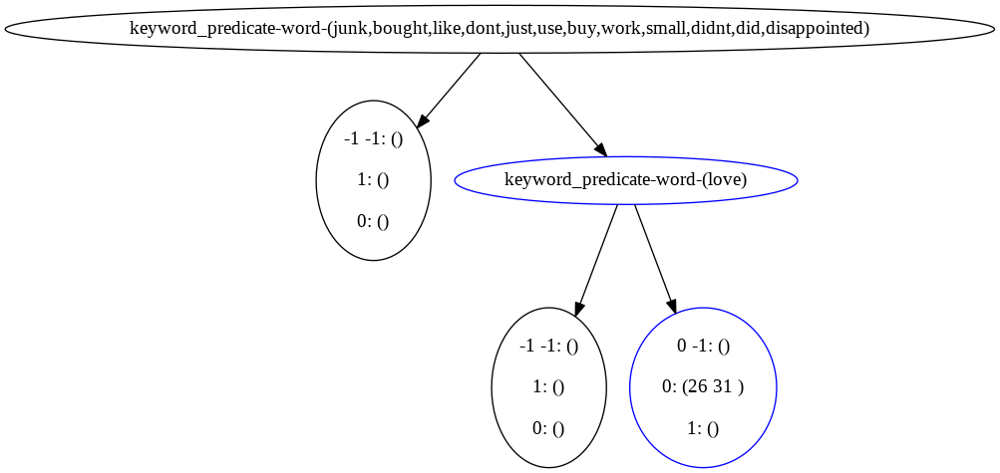

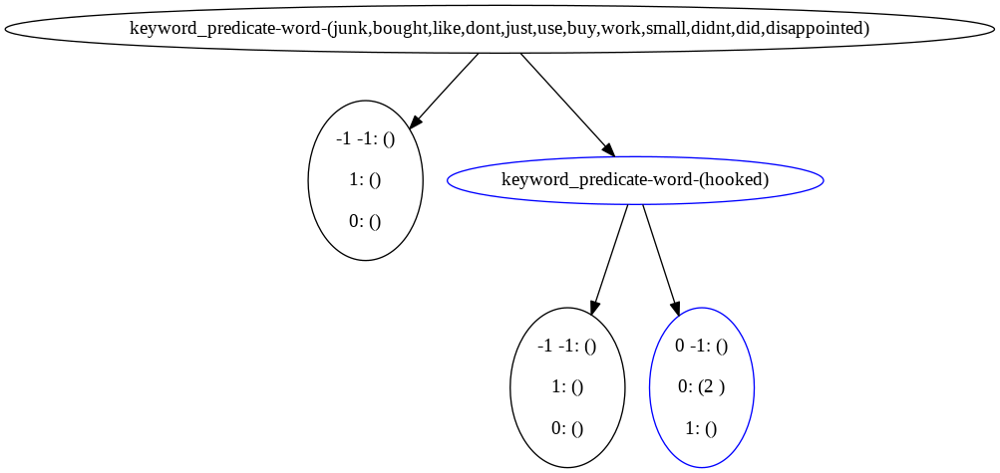

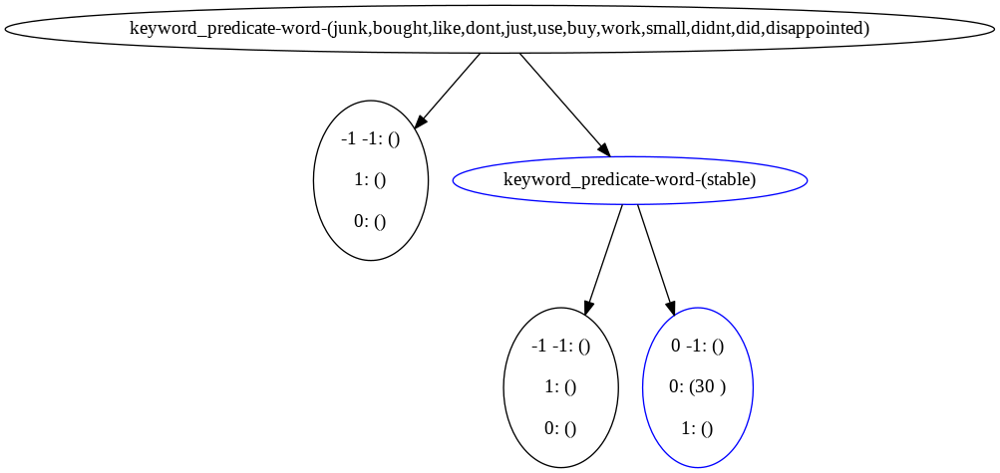



***********************************
candidate res tree:
PredicateNode(id=0, pred=keyword_predicate-word-(junk,bought,like,dont,just,use,buy,work,small,didnt,did,disappointed))
    LabelNode(id=51, label=-1)
    PredicateNode(id=3, pred=keyword_predicate-word-(shoes,metal,fabric,replace,battery,warranty,plug))
        LabelNode(id=52, label=-1)
        PredicateNode(id=9, pred=keyword_predicate-word-(good), added=True)
            LabelNode(id=10, label=1, added=True)
            LabelNode(id=11, label=0, added=True)
candidate res tree:
PredicateNode(id=12, pred=keyword_predicate-word-(one), added=True)
    LabelNode(id=added_1, label=-1)
    PredicateNode(id=18, pred=keyword_predicate-word-(completely), added=True)
        PredicateNode(id=24, pred=keyword_predicate-word-(five), added=True)
            LabelNode(id=25, label=1, added=True)
            LabelNode(id=26, label=0, added=True)
        LabelNode(id=20, label=0, added=True)
candidate res tree:
PredicateNode(id=0, pred=keywo

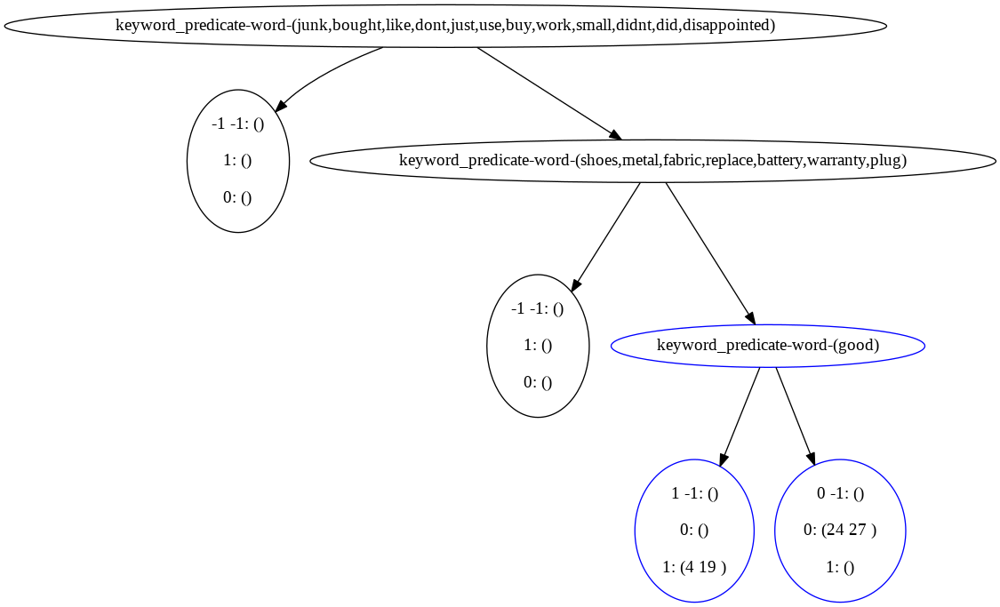

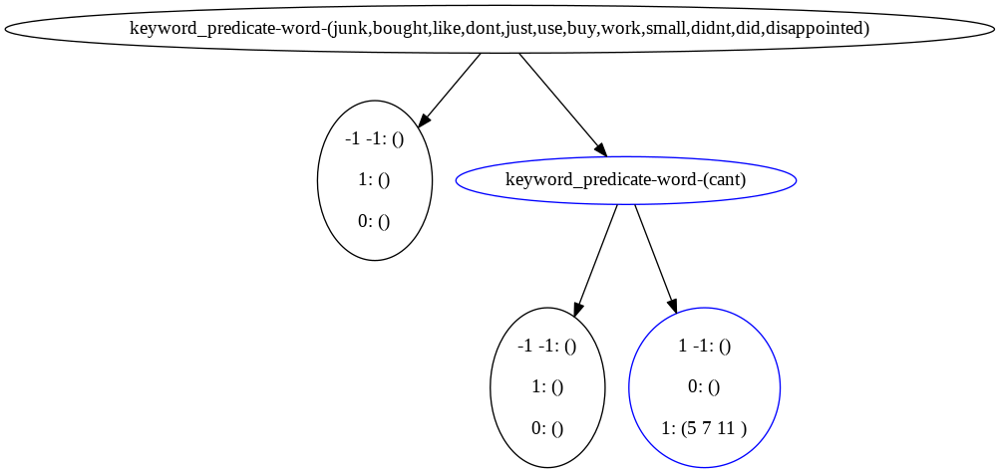

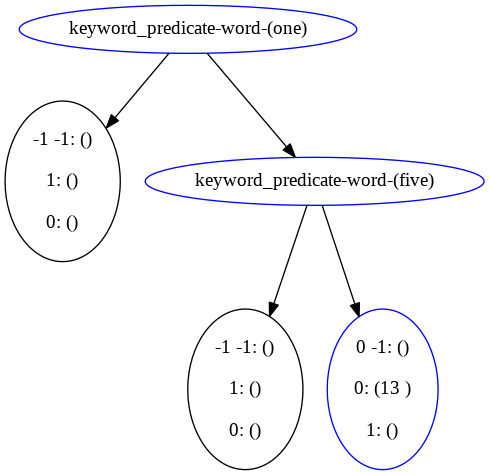

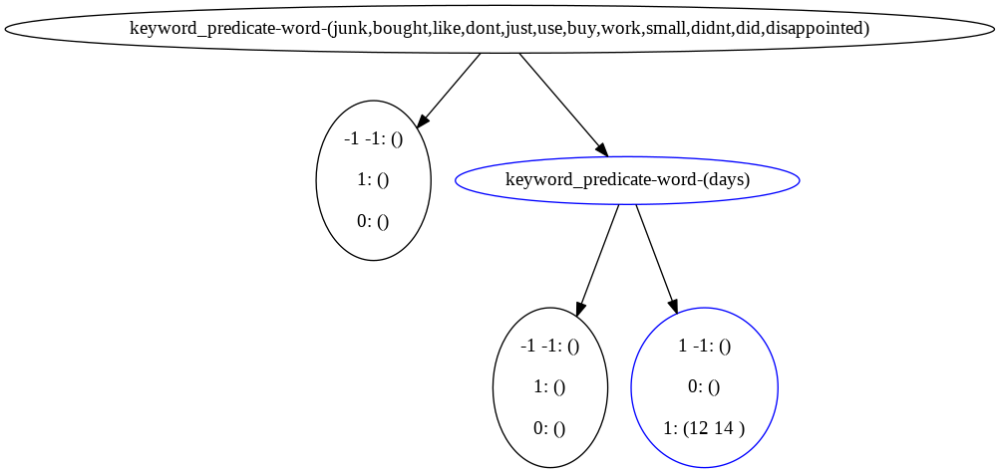

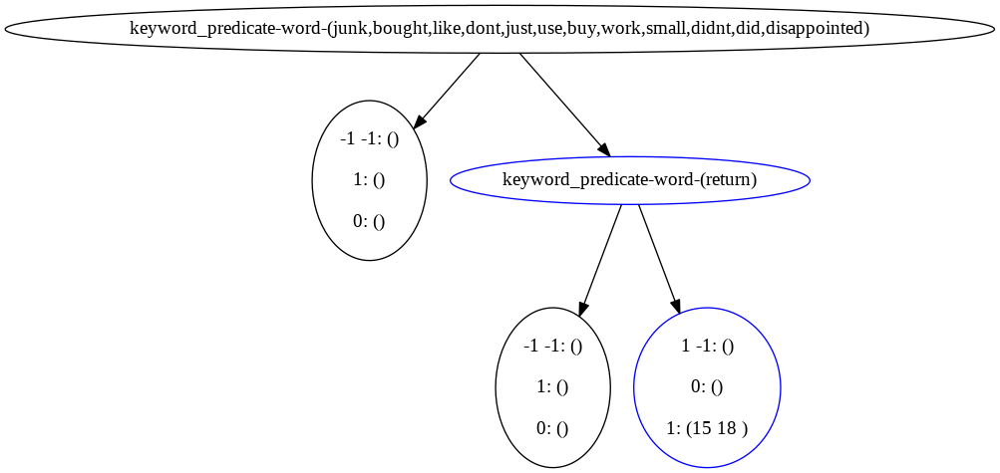

...

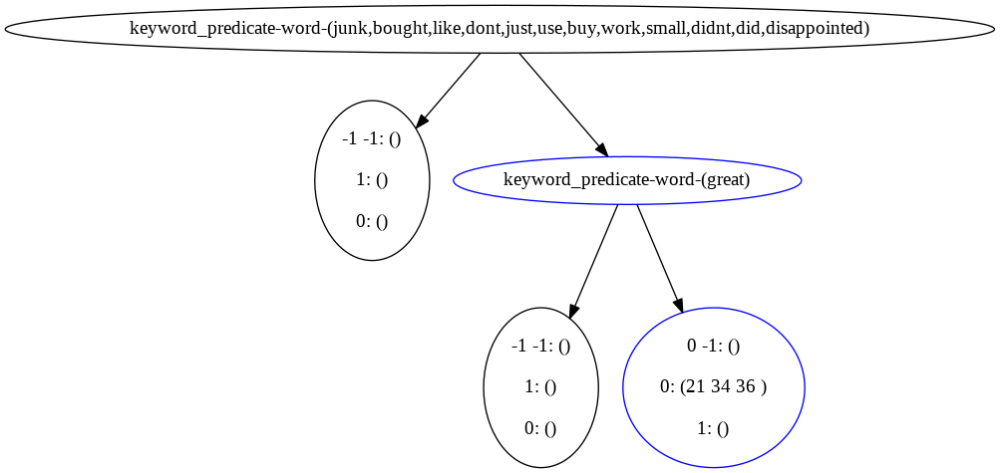

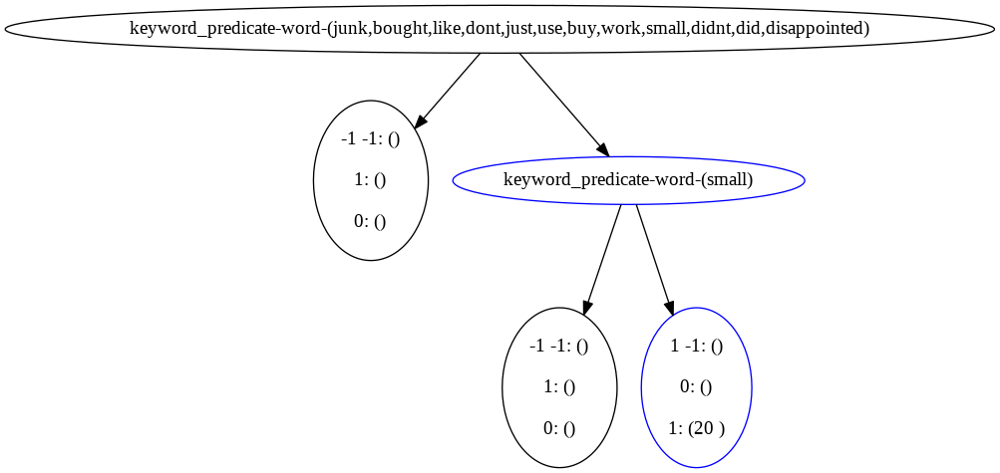

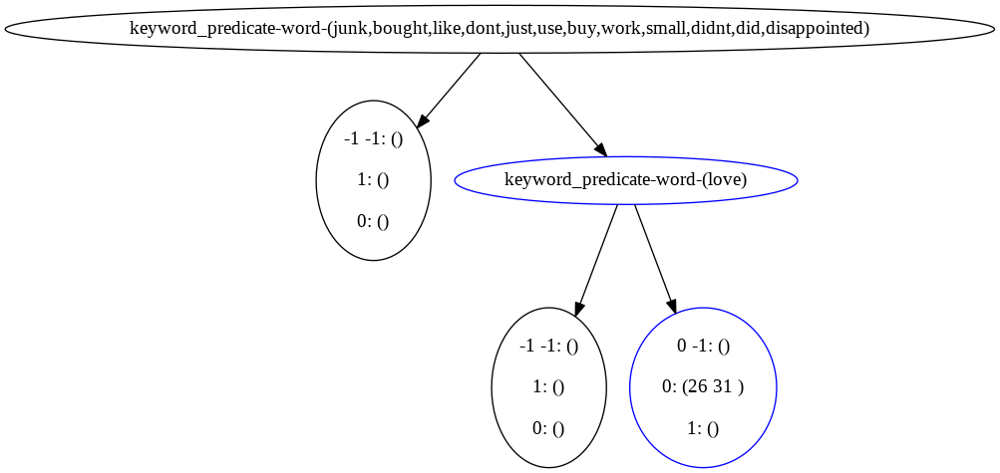

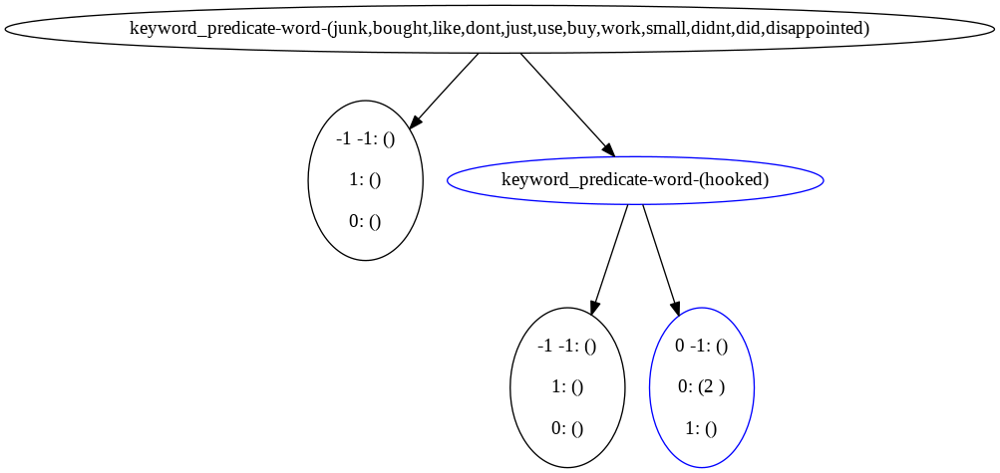

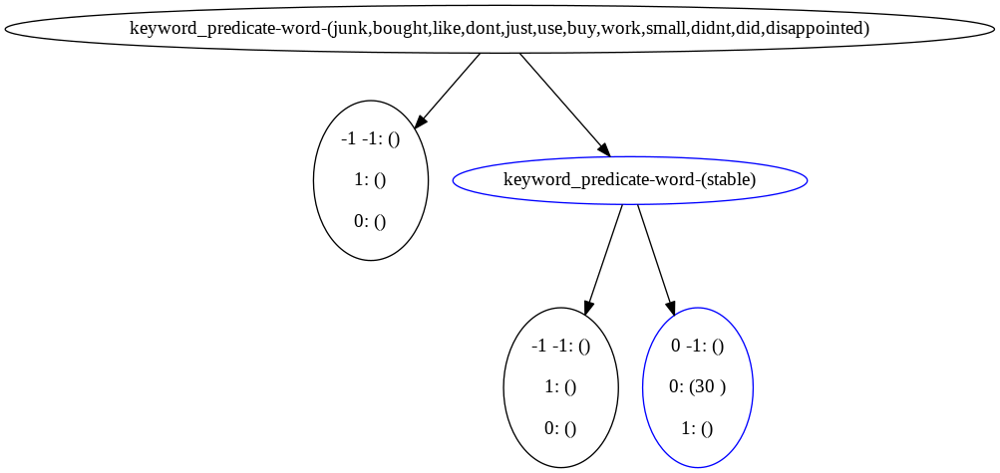



-----------------------------------------------------
original tree 8


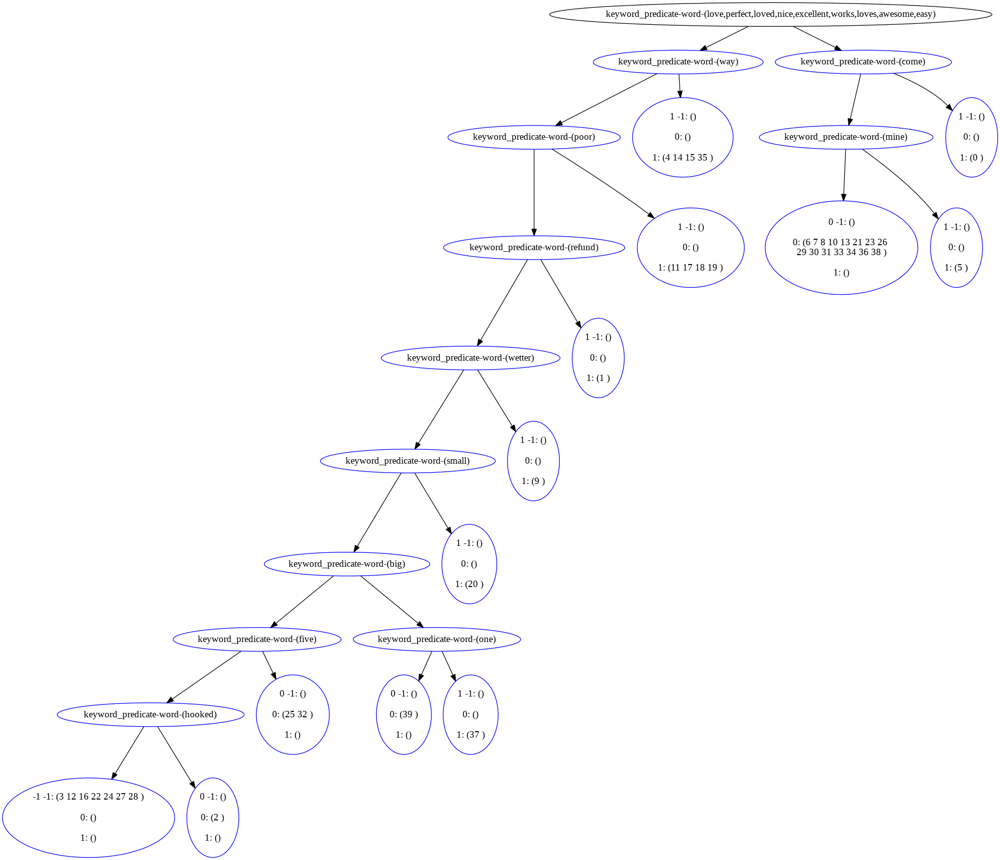



















after reconstructing, original tree is


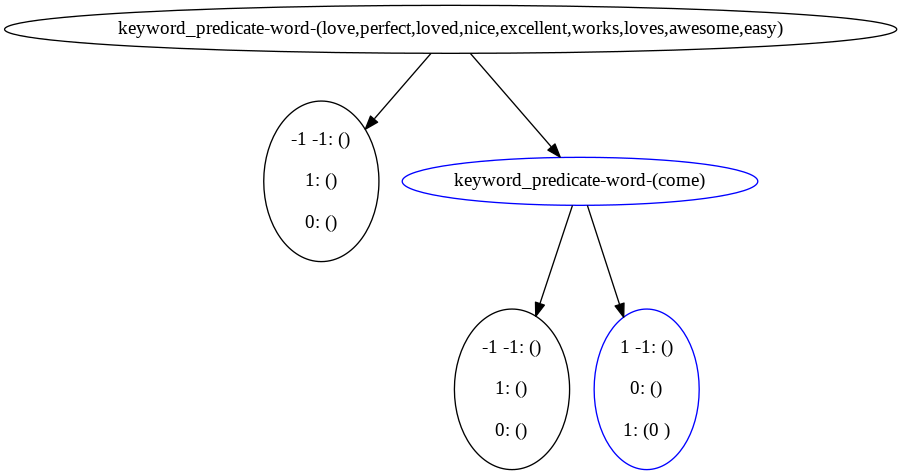



res trees before deduplication


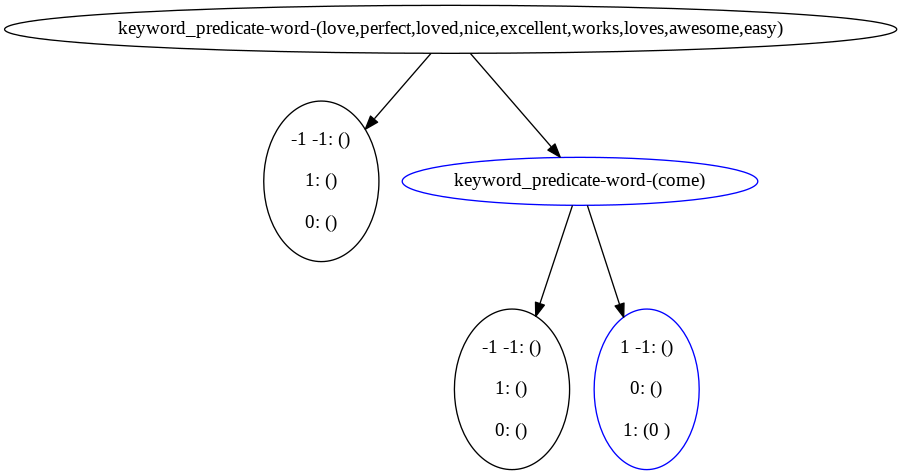

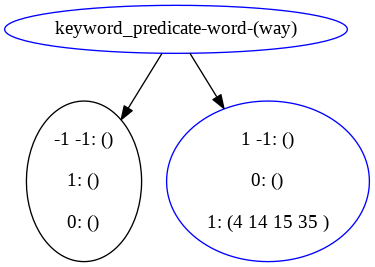

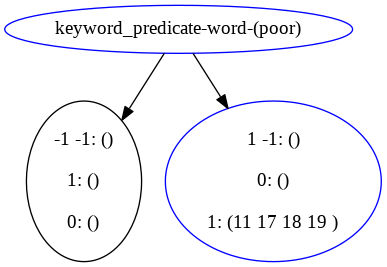

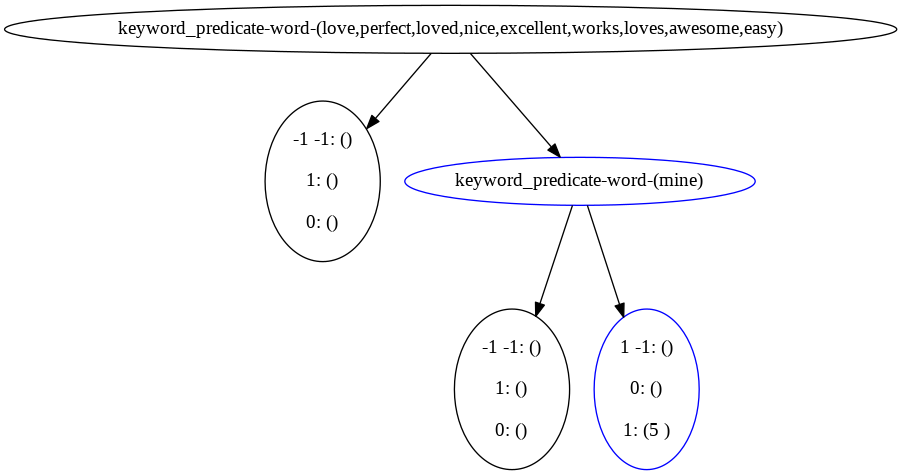

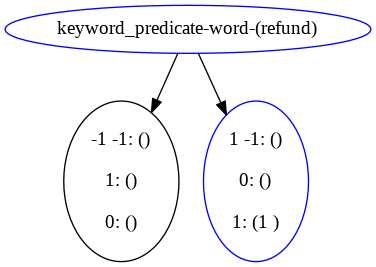

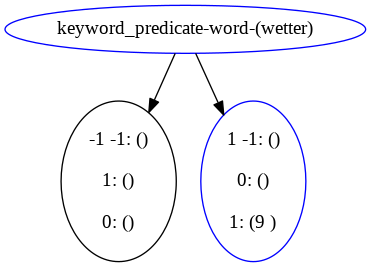

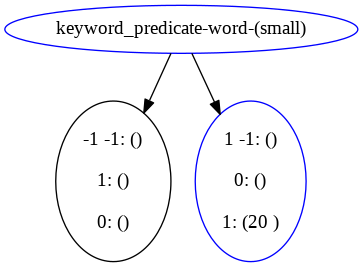

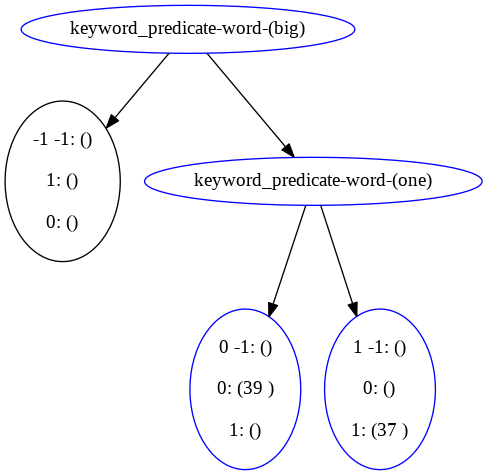

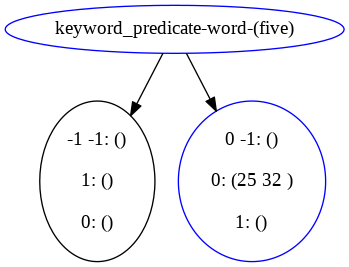

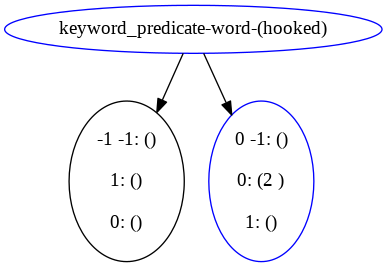



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy))
    LabelNode(id=37, label=-1)
    PredicateNode(id=4, pred=keyword_predicate-word-(come), added=True)
        LabelNode(id=39, label=-1)
        LabelNode(id=6, label=1, added=True)
candidate res tree:
PredicateNode(id=7, pred=keyword_predicate-word-(way), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=9, label=1, added=True)
candidate res tree:
PredicateNode(id=13, pred=keyword_predicate-word-(poor), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=15, label=1, added=True)
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy))
    LabelNode(id=added_2, label=-1)
    PredicateNode(id=10, pred=keyword_predicate-word-(mine), added=True)
        LabelNode(id=added_1, label=-1)
        LabelNode(id=12, label=1, added

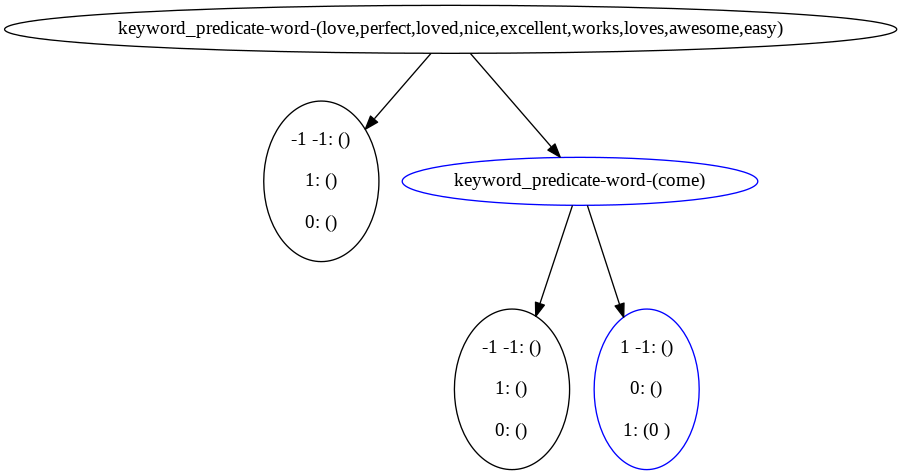

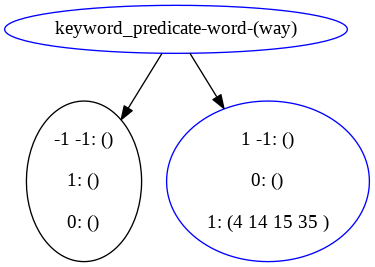

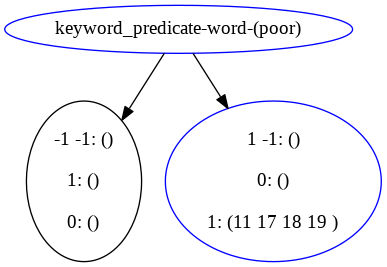

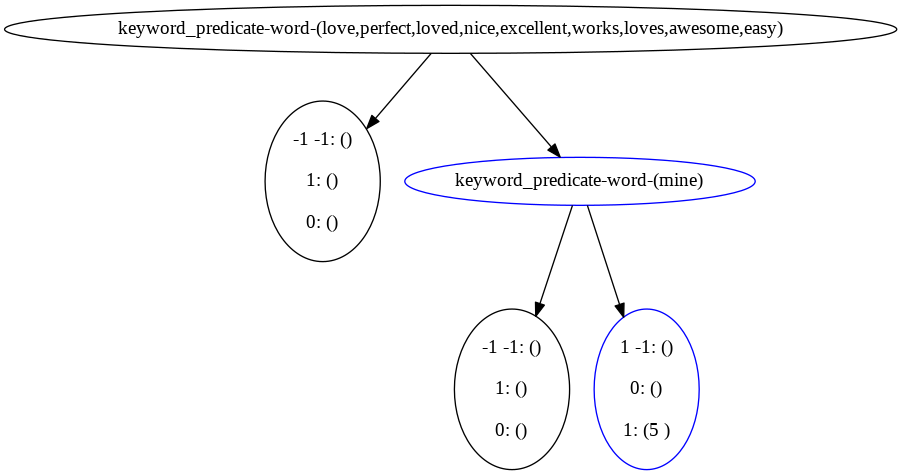

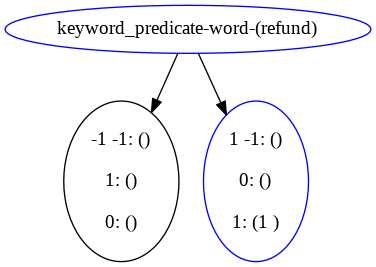

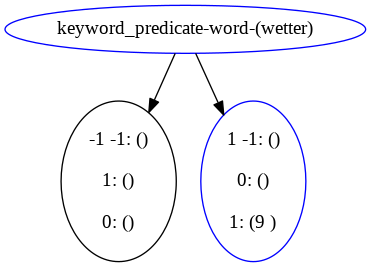

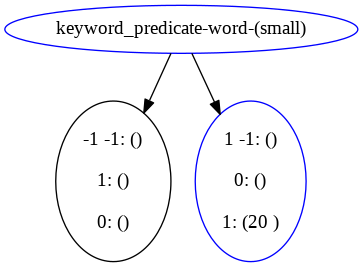

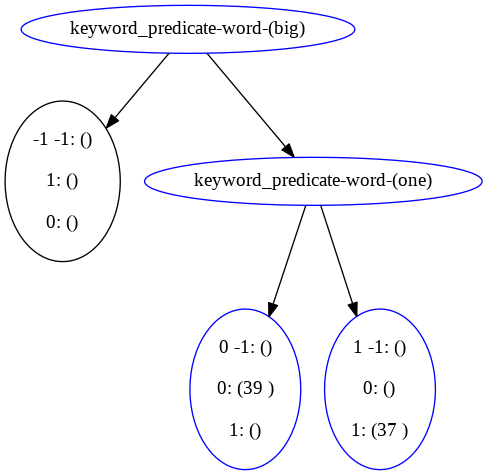

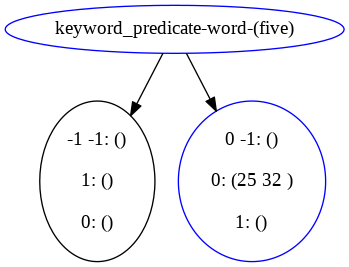

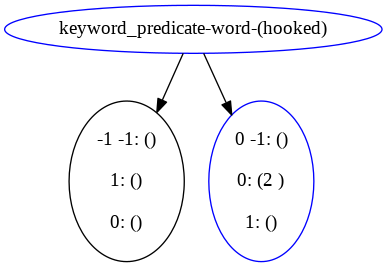



-----------------------------------------------------
original tree 9


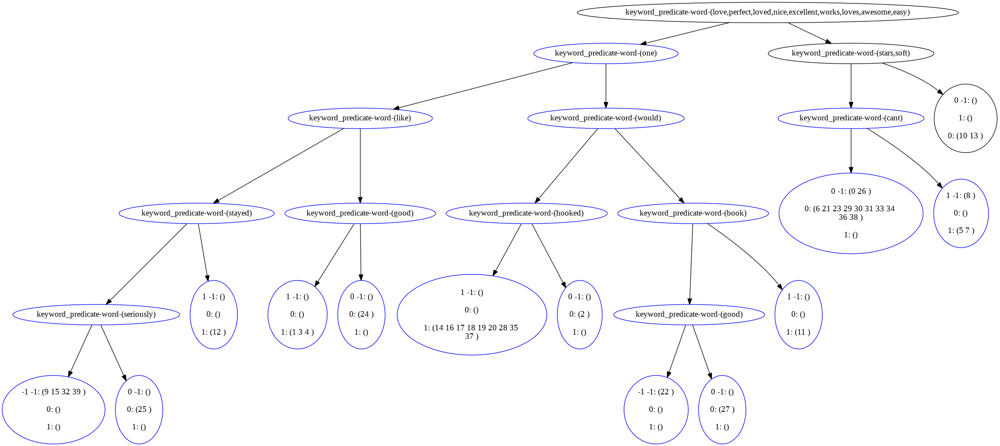















after reconstructing, original tree is


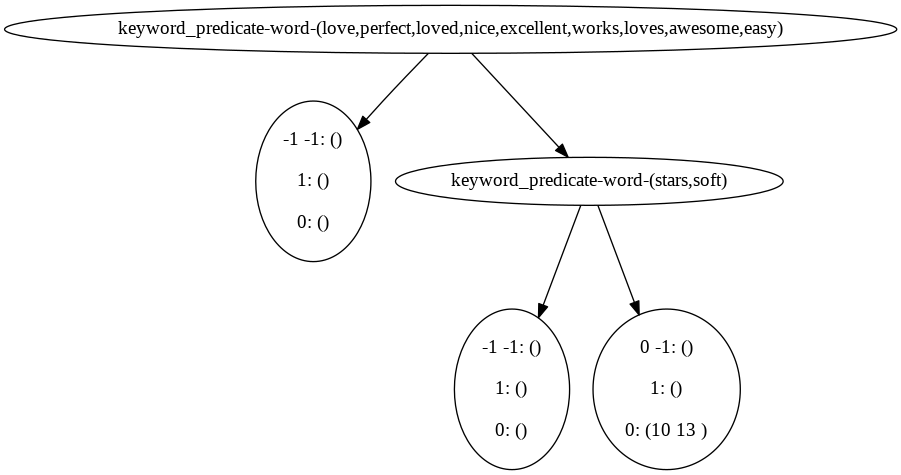



res trees before deduplication


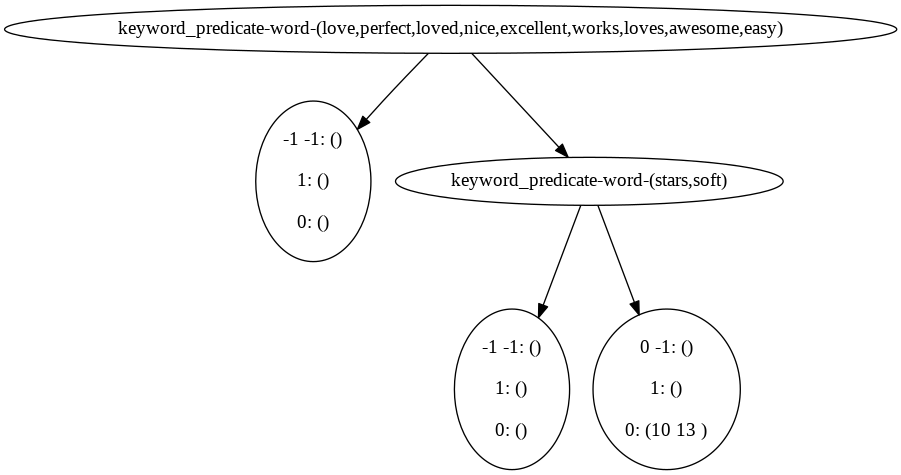

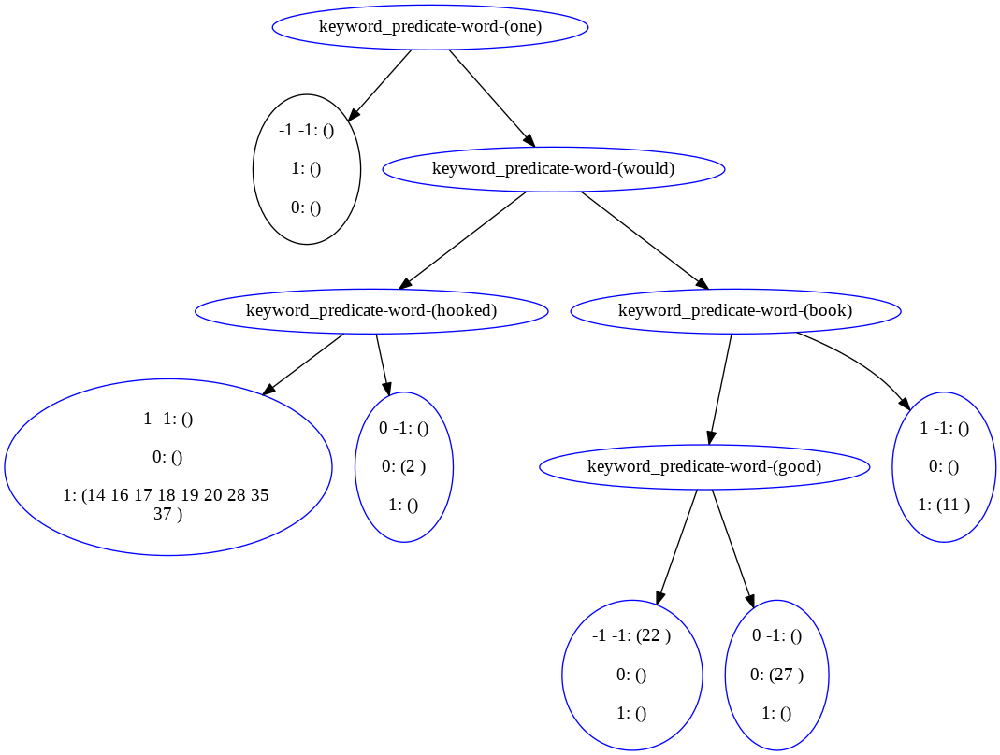

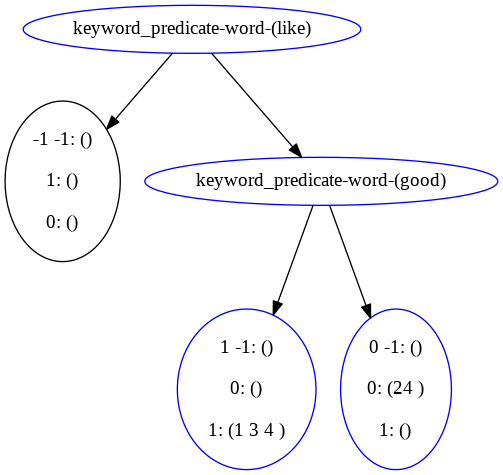

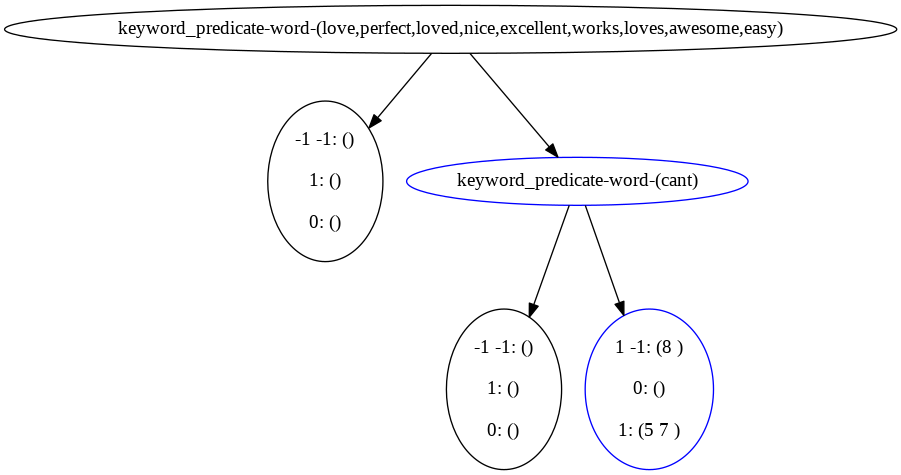

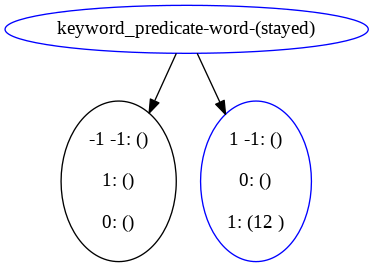

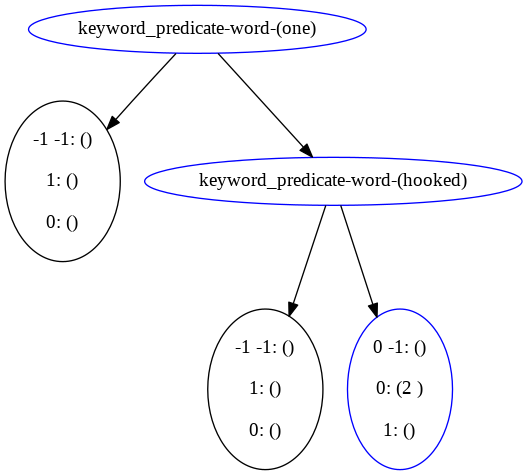

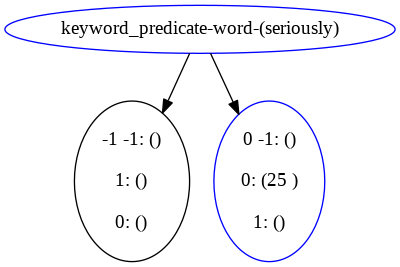

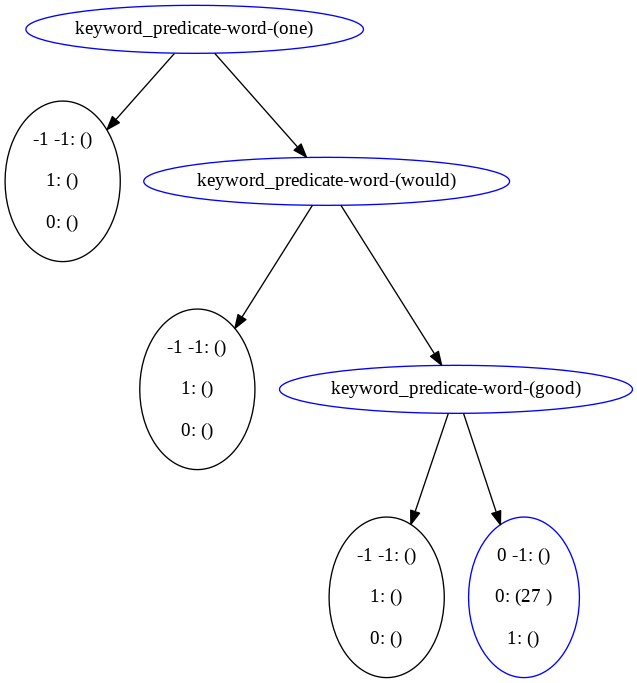



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy))
    LabelNode(id=36, label=-1)
    PredicateNode(id=3, pred=keyword_predicate-word-(stars,soft))
        LabelNode(id=38, label=-1)
        LabelNode(id=5, label=0)
candidate res tree:
PredicateNode(id=9, pred=keyword_predicate-word-(one), added=True)
    LabelNode(id=added_1, label=-1)
    PredicateNode(id=15, pred=keyword_predicate-word-(would), added=True)
        PredicateNode(id=24, pred=keyword_predicate-word-(hooked), added=True)
            LabelNode(id=25, label=1, added=True)
            LabelNode(id=26, label=0, added=True)
        PredicateNode(id=27, pred=keyword_predicate-word-(book), added=True)
            PredicateNode(id=33, pred=keyword_predicate-word-(good), added=True)
                LabelNode(id=34, label=-1, added=True)
                LabelNode(id=35, label=0, added=True)
            LabelNode(id

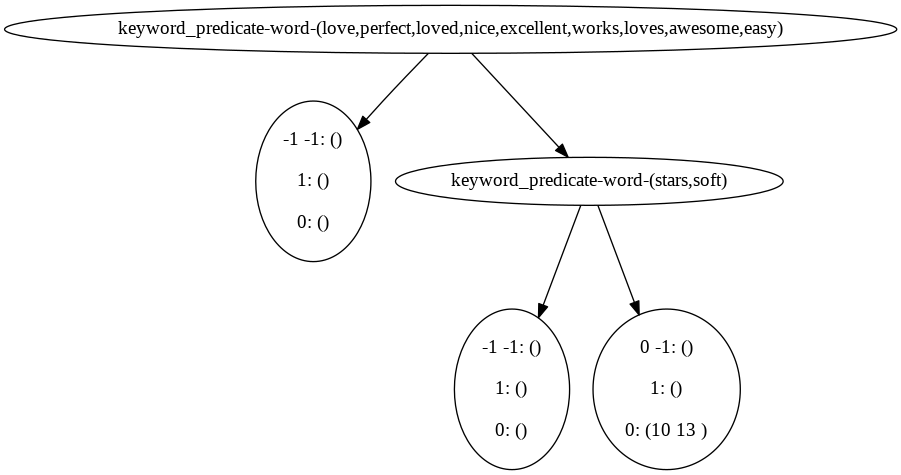

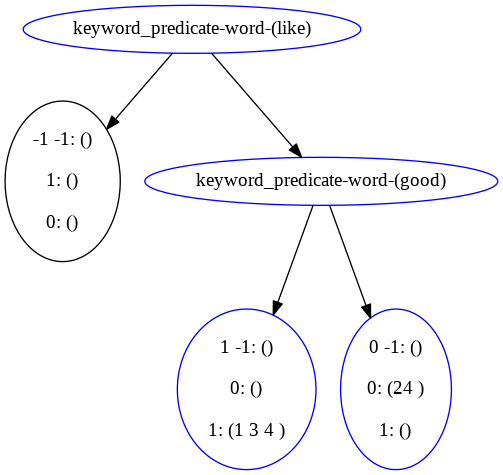

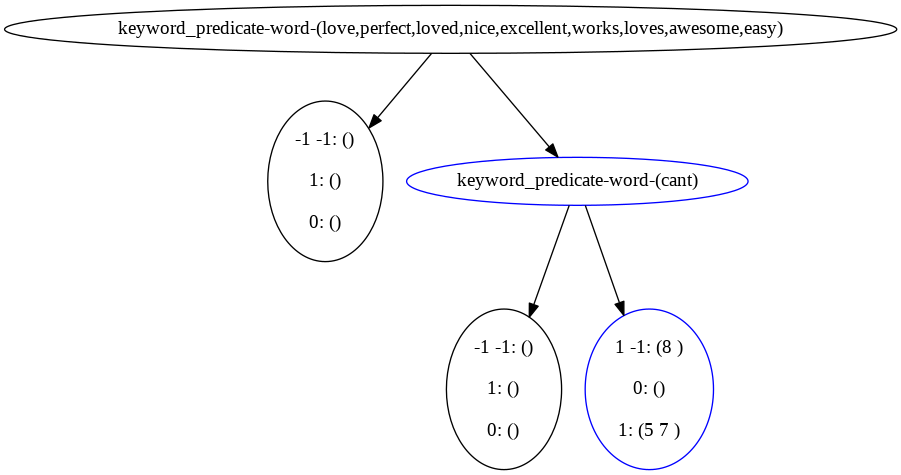

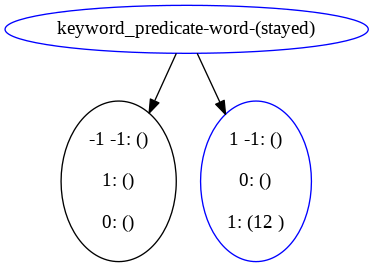

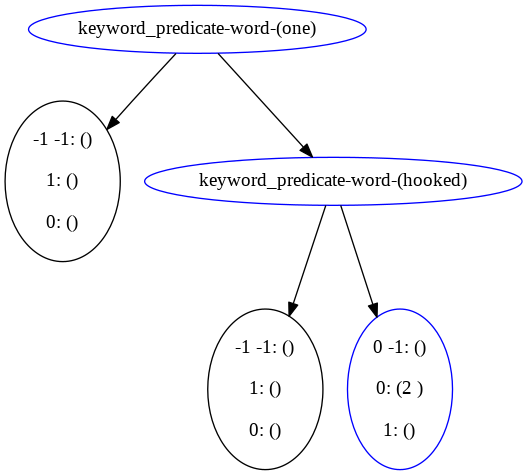

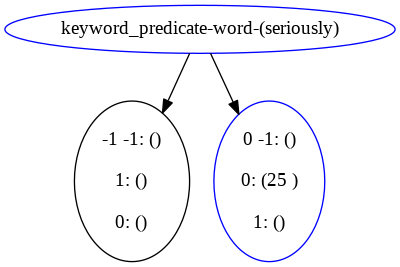

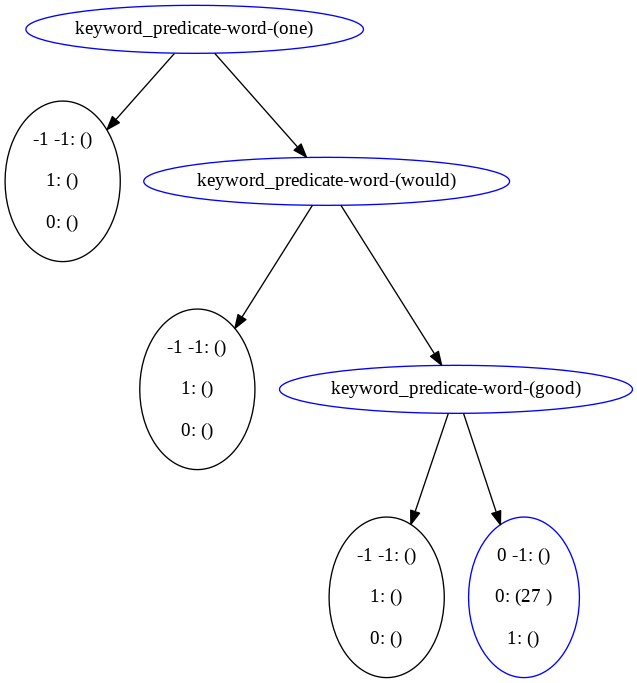



-----------------------------------------------------
original tree 10


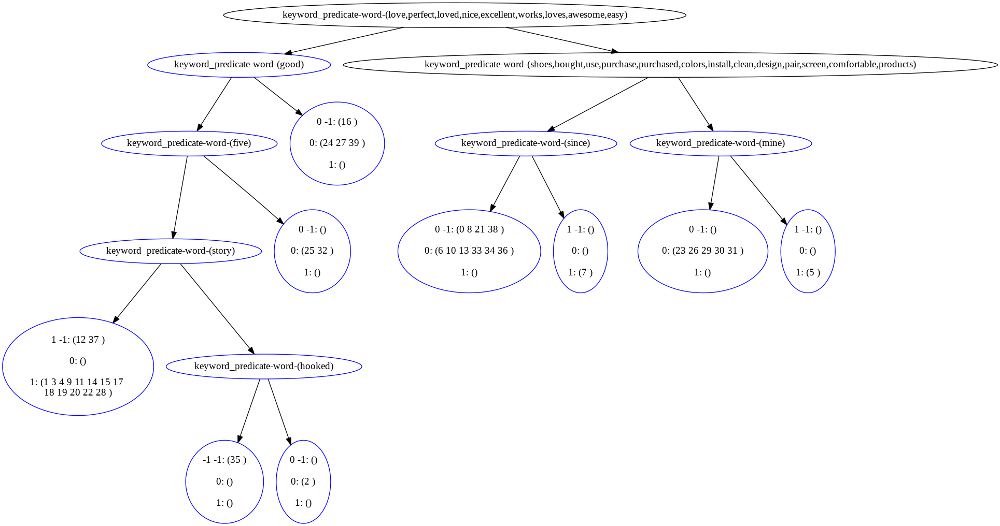









after reconstructing, original tree is


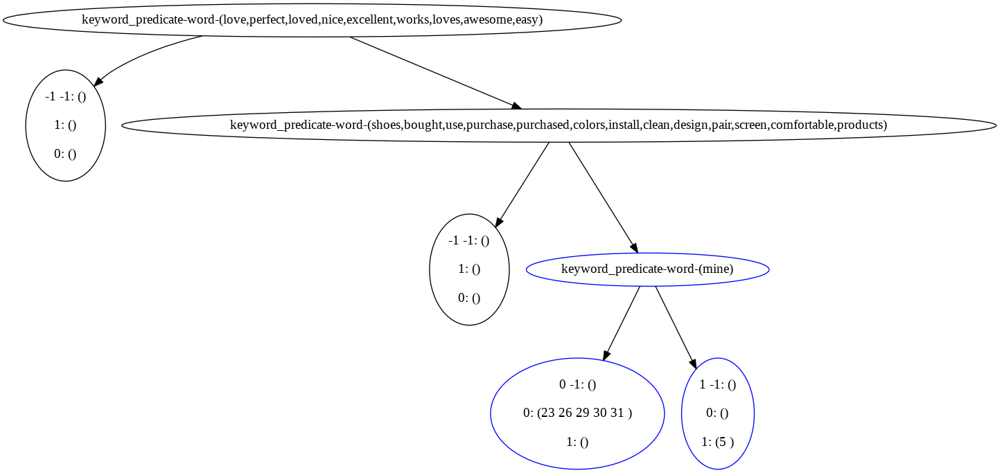



res trees before deduplication


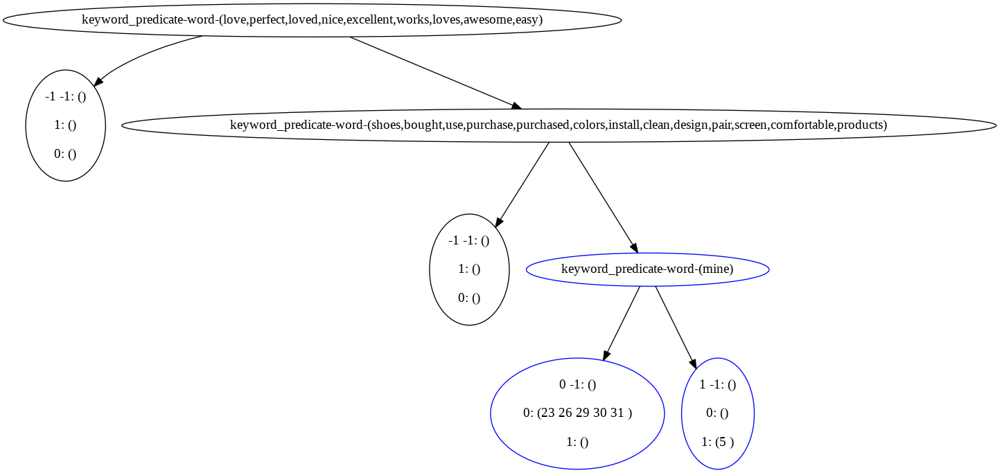

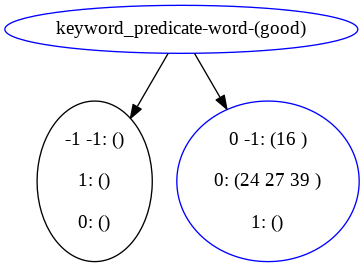

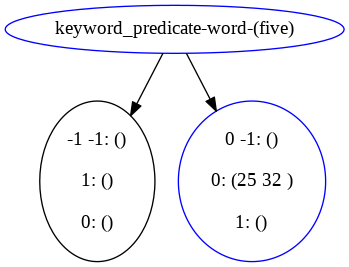

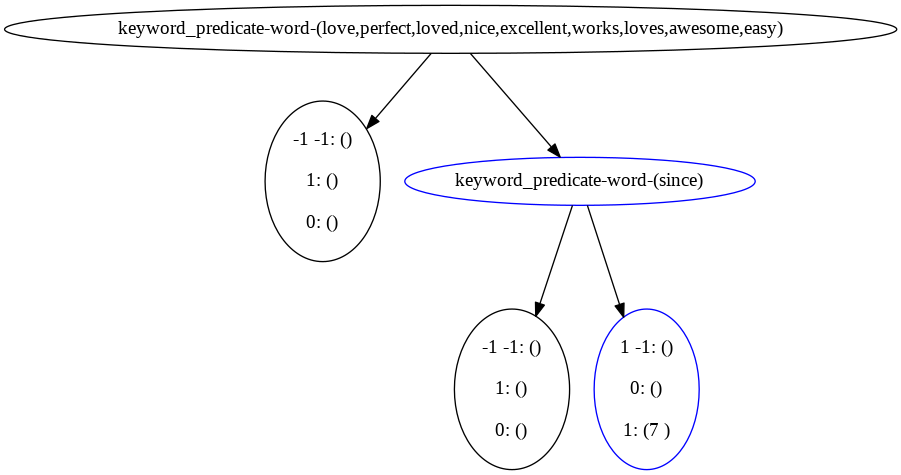

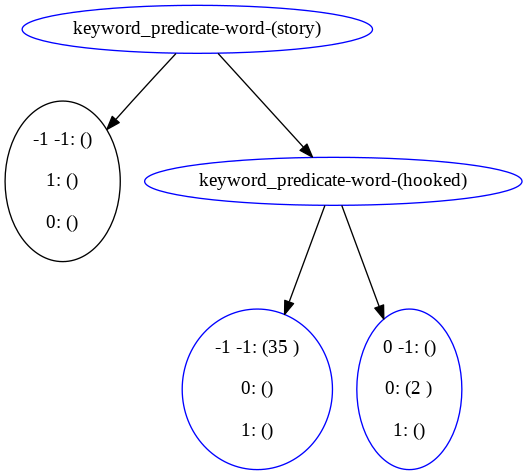



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy))
    LabelNode(id=24, label=-1)
    PredicateNode(id=3, pred=keyword_predicate-word-(shoes,bought,use,purchase,purchased,colors,install,clean,design,pair,screen,comfortable,products))
        LabelNode(id=26, label=-1)
        PredicateNode(id=12, pred=keyword_predicate-word-(mine), added=True)
            LabelNode(id=13, label=0, added=True)
            LabelNode(id=14, label=1, added=True)
candidate res tree:
PredicateNode(id=9, pred=keyword_predicate-word-(good), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=11, label=0, added=True)
candidate res tree:
PredicateNode(id=15, pred=keyword_predicate-word-(five), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=17, label=0, added=True)
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(love,perfect,loved,nice,excellent,w

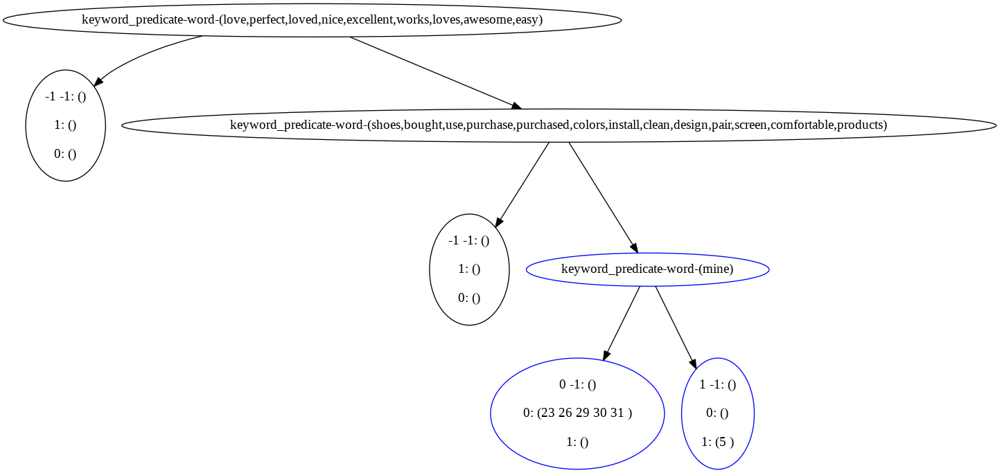

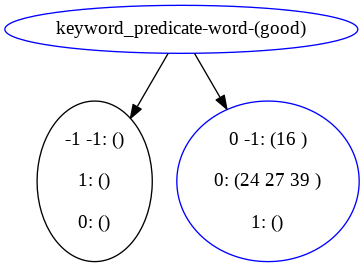

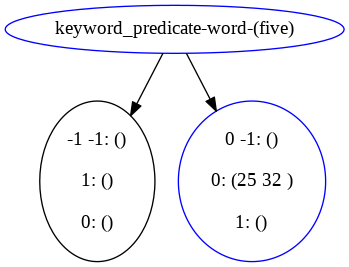

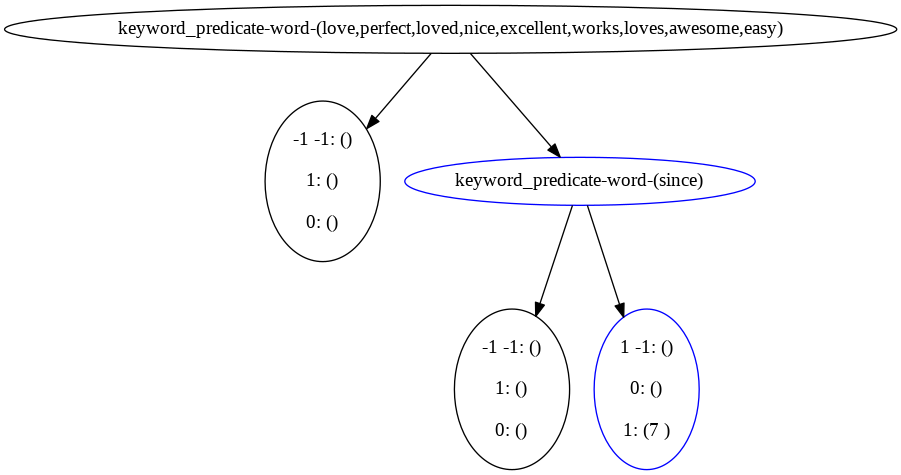

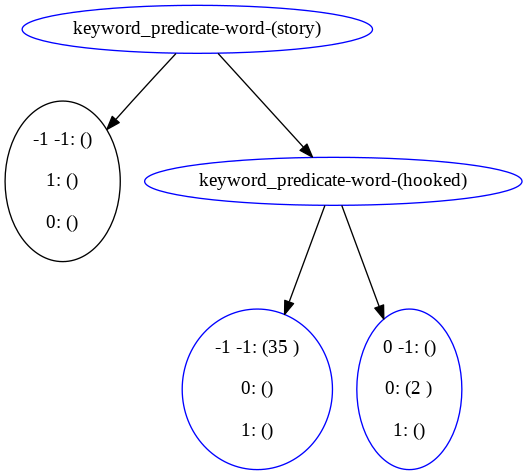



-----------------------------------------------------
original tree 11


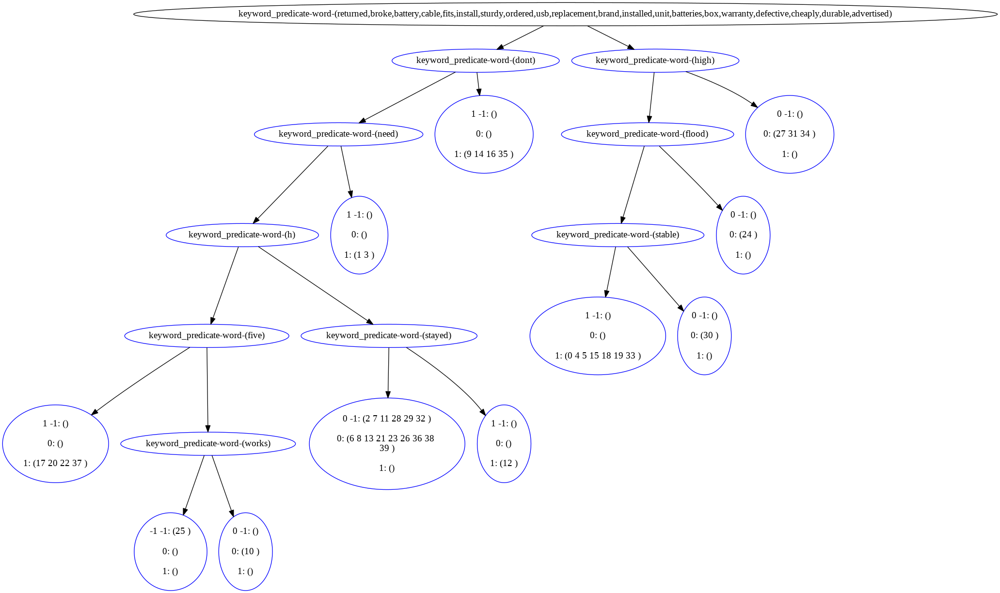













after reconstructing, original tree is


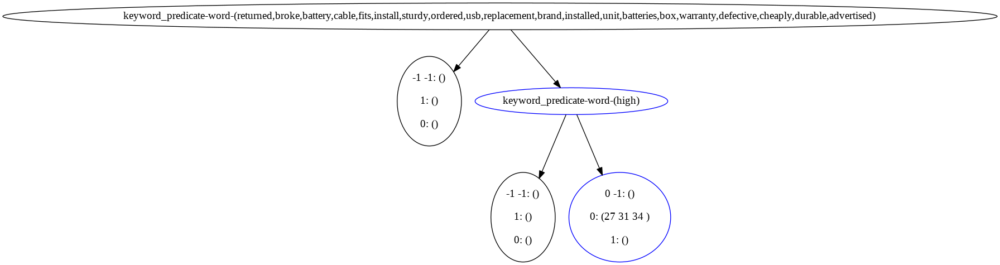



res trees before deduplication


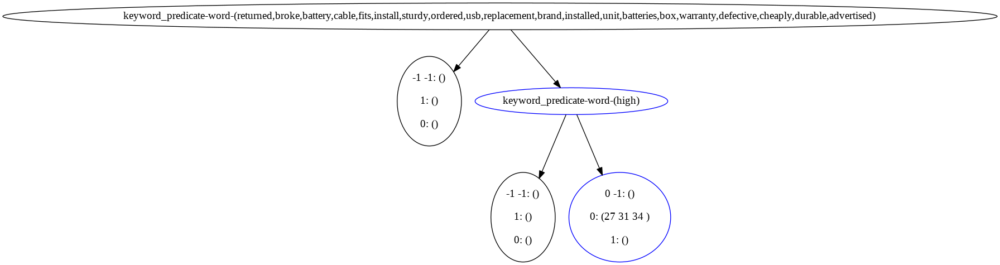

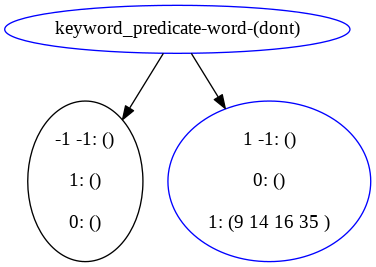

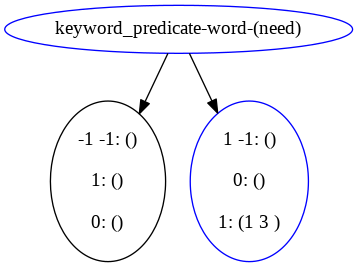

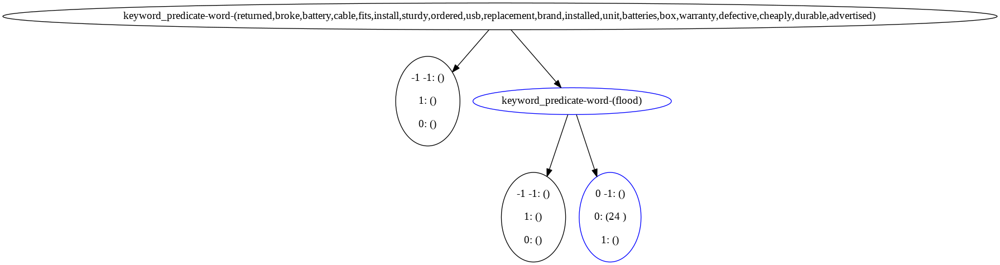

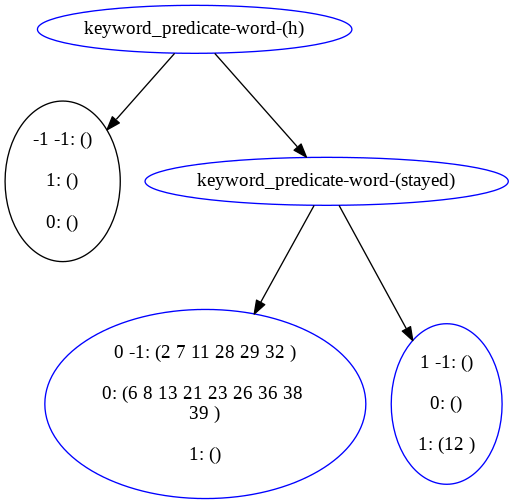

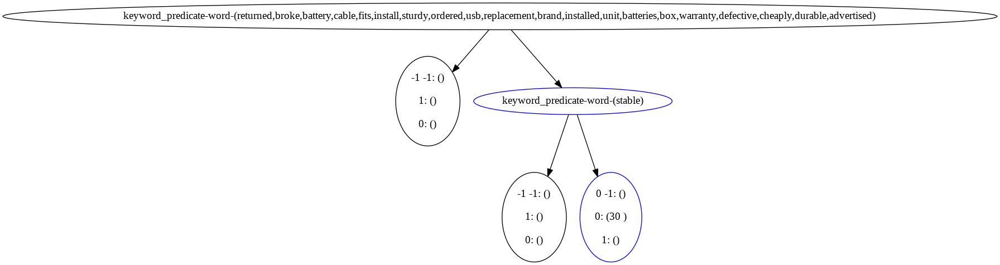

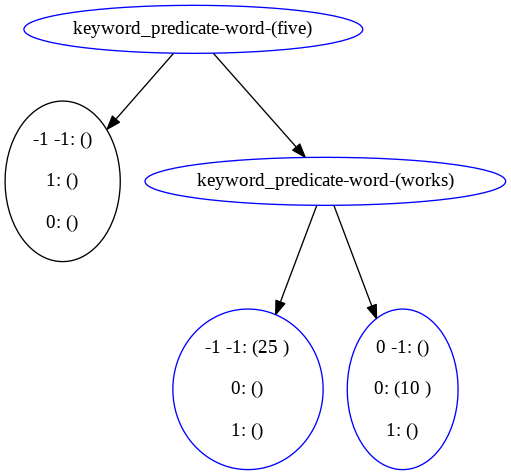



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(returned,broke,battery,cable,fits,install,sturdy,ordered,usb,replacement,brand,installed,unit,batteries,box,warranty,defective,cheaply,durable,advertised))
    LabelNode(id=31, label=-1)
    PredicateNode(id=4, pred=keyword_predicate-word-(high), added=True)
        LabelNode(id=33, label=-1)
        LabelNode(id=6, label=0, added=True)
candidate res tree:
PredicateNode(id=7, pred=keyword_predicate-word-(dont), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=9, label=1, added=True)
candidate res tree:
PredicateNode(id=13, pred=keyword_predicate-word-(need), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=15, label=1, added=True)
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(returned,broke,battery,cable,fits,install,sturdy,ordered,usb,replacement,brand,installed,unit,batteries,box,warranty,defective,cheaply,durable,advertised

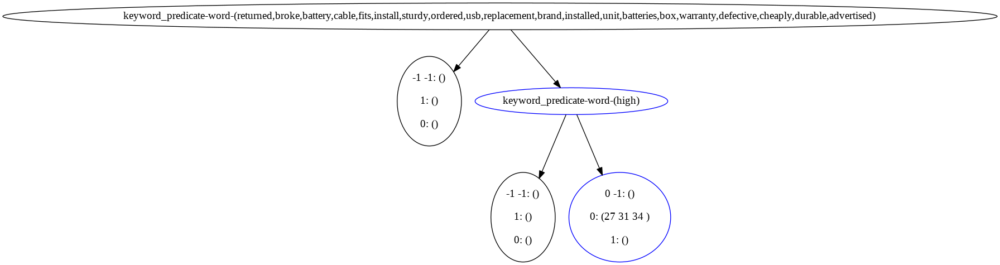

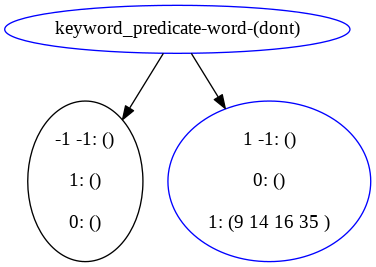

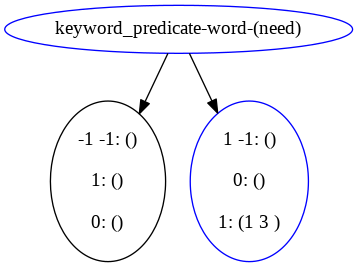

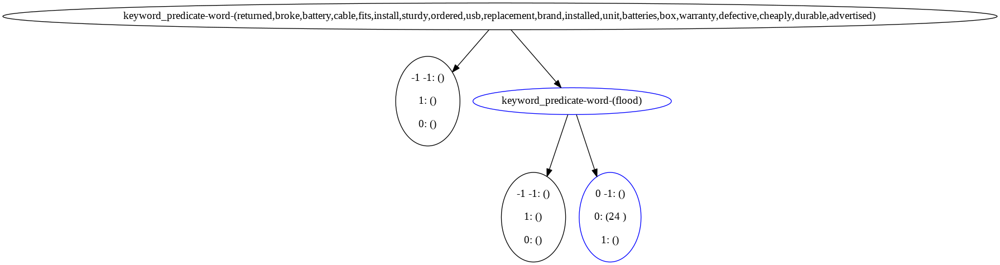

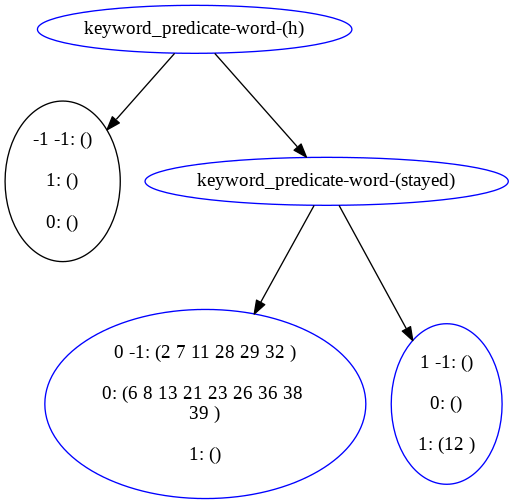

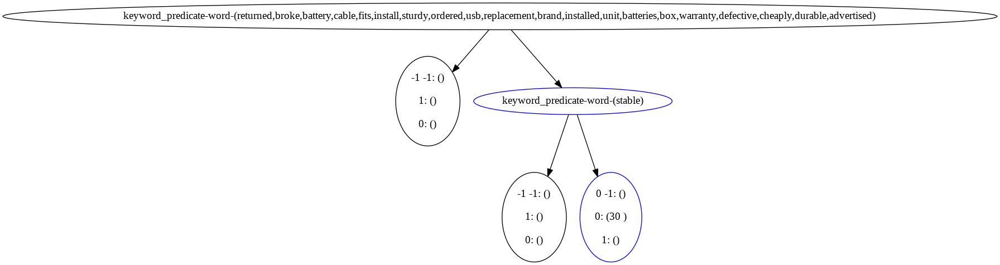

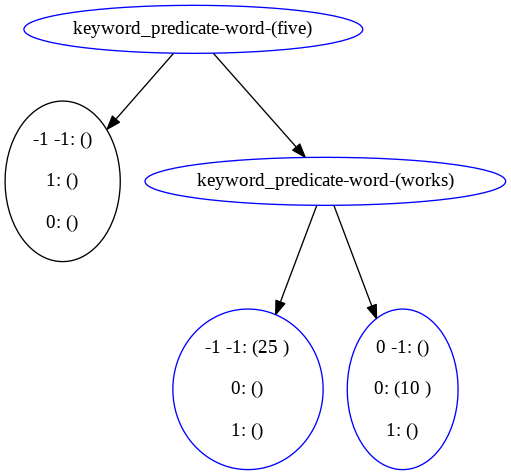



-----------------------------------------------------
original tree 12


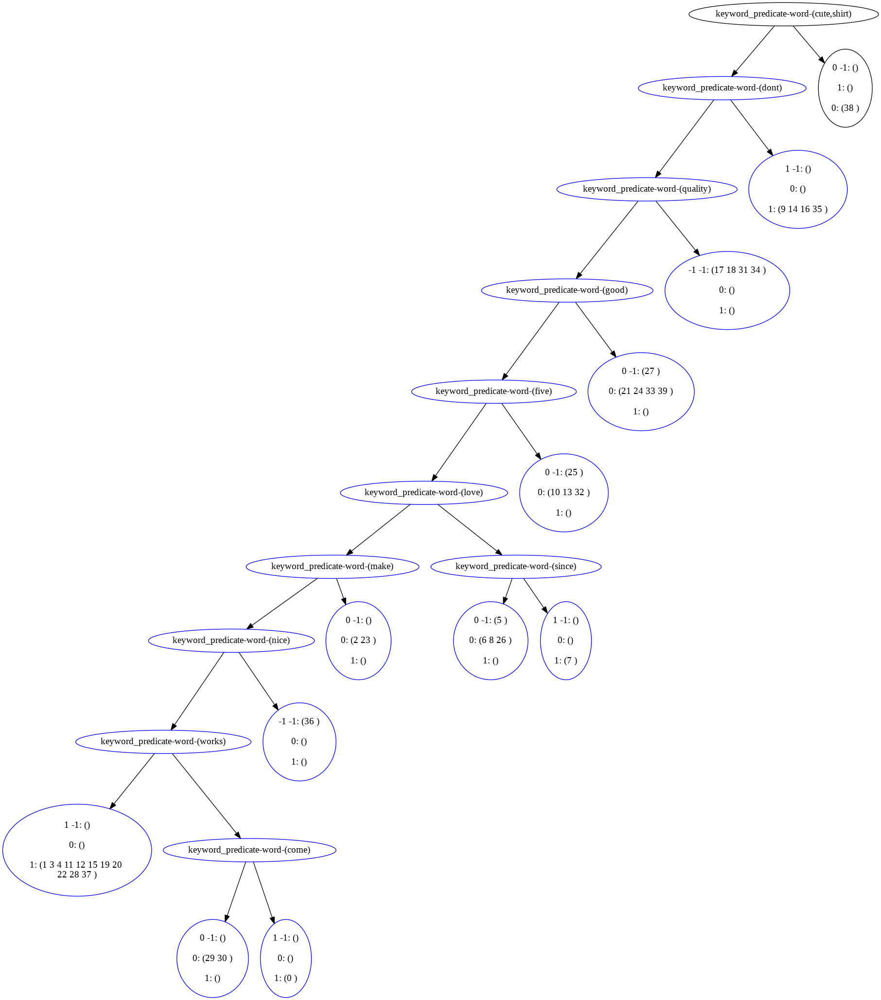

















after reconstructing, original tree is


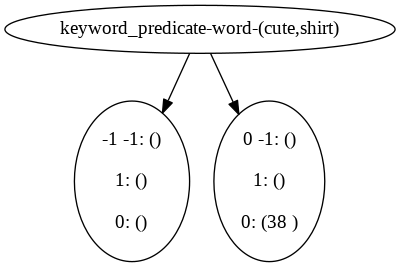



res trees before deduplication


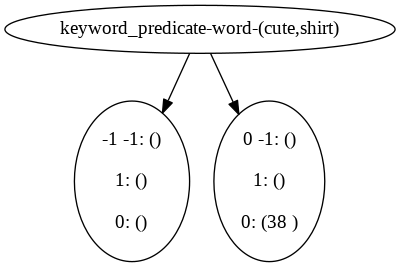

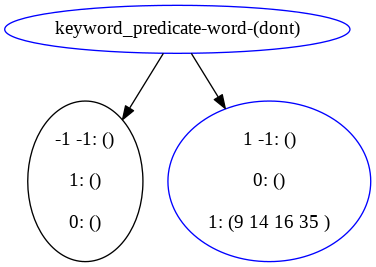

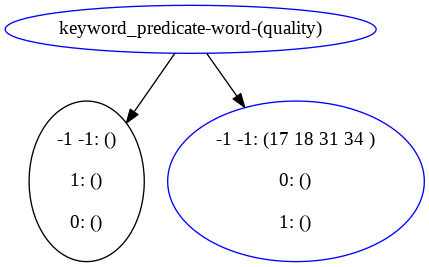

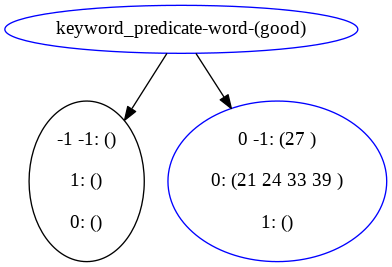

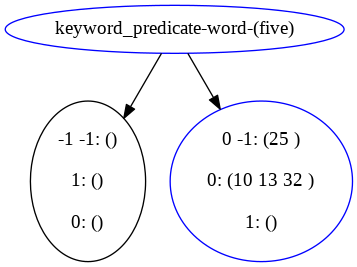

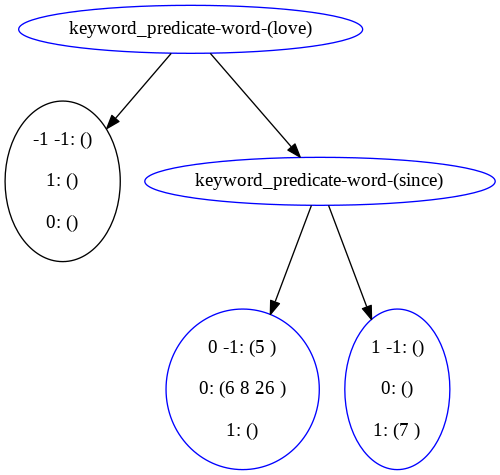

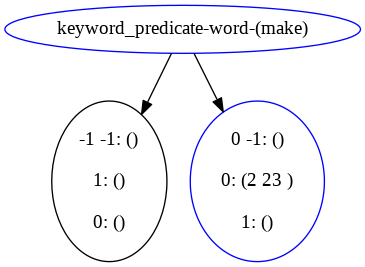

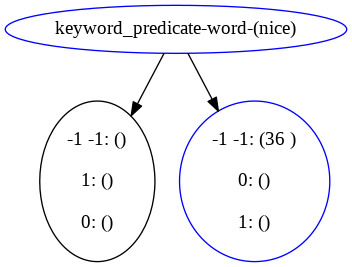

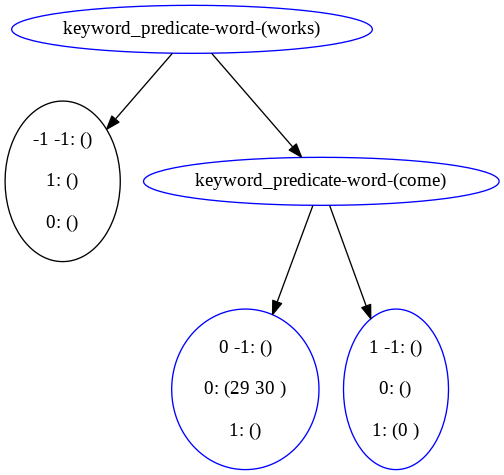



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(cute,shirt))
    LabelNode(id=34, label=-1)
    LabelNode(id=3, label=0)
candidate res tree:
PredicateNode(id=4, pred=keyword_predicate-word-(dont), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=6, label=1, added=True)
candidate res tree:
PredicateNode(id=7, pred=keyword_predicate-word-(quality), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=9, label=-1, added=True)
candidate res tree:
PredicateNode(id=10, pred=keyword_predicate-word-(good), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=12, label=0, added=True)
candidate res tree:
PredicateNode(id=13, pred=keyword_predicate-word-(five), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=15, label=0, added=True)
candidate res tree:
PredicateNode(id=16, pred=keyword_predicate-word-(love), added=True)
    LabelNode(id=added_1, label=-1)
    PredicateNode(id=22, pr

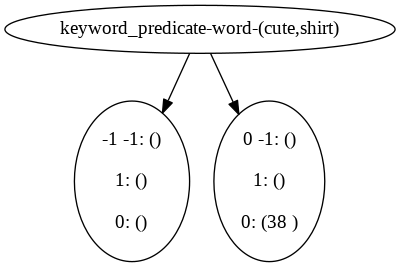

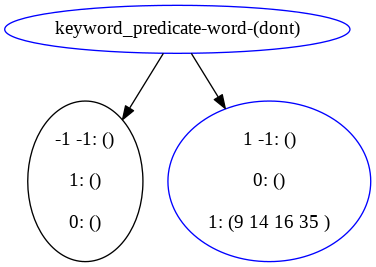

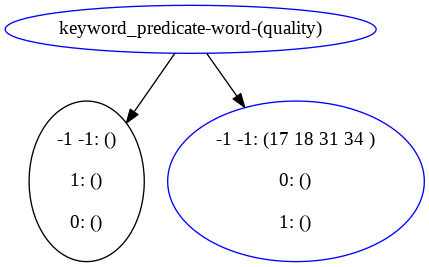

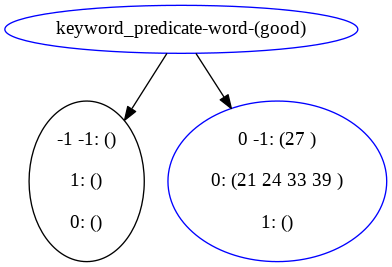

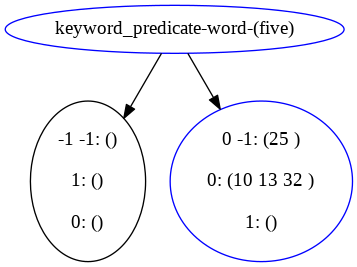

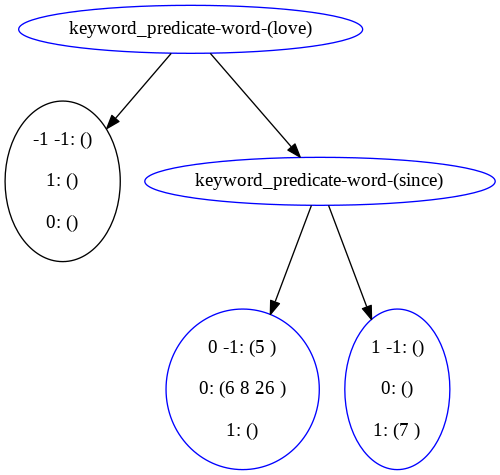

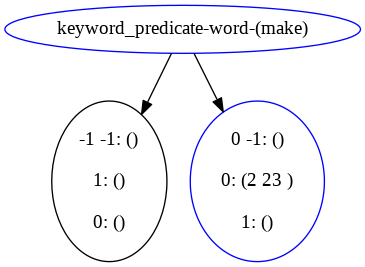

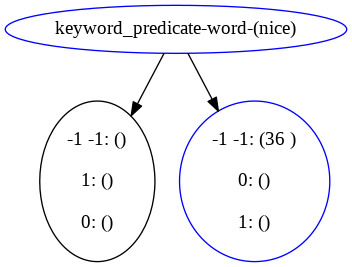

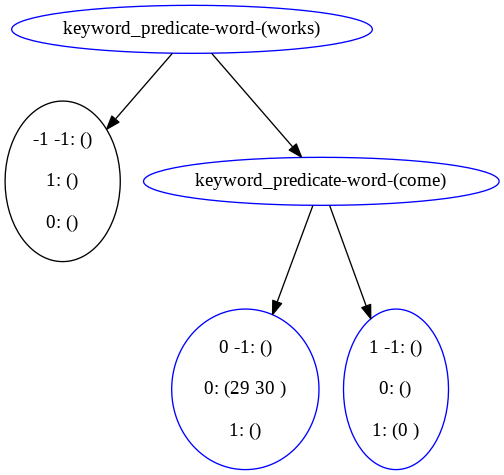



-----------------------------------------------------
original tree 13


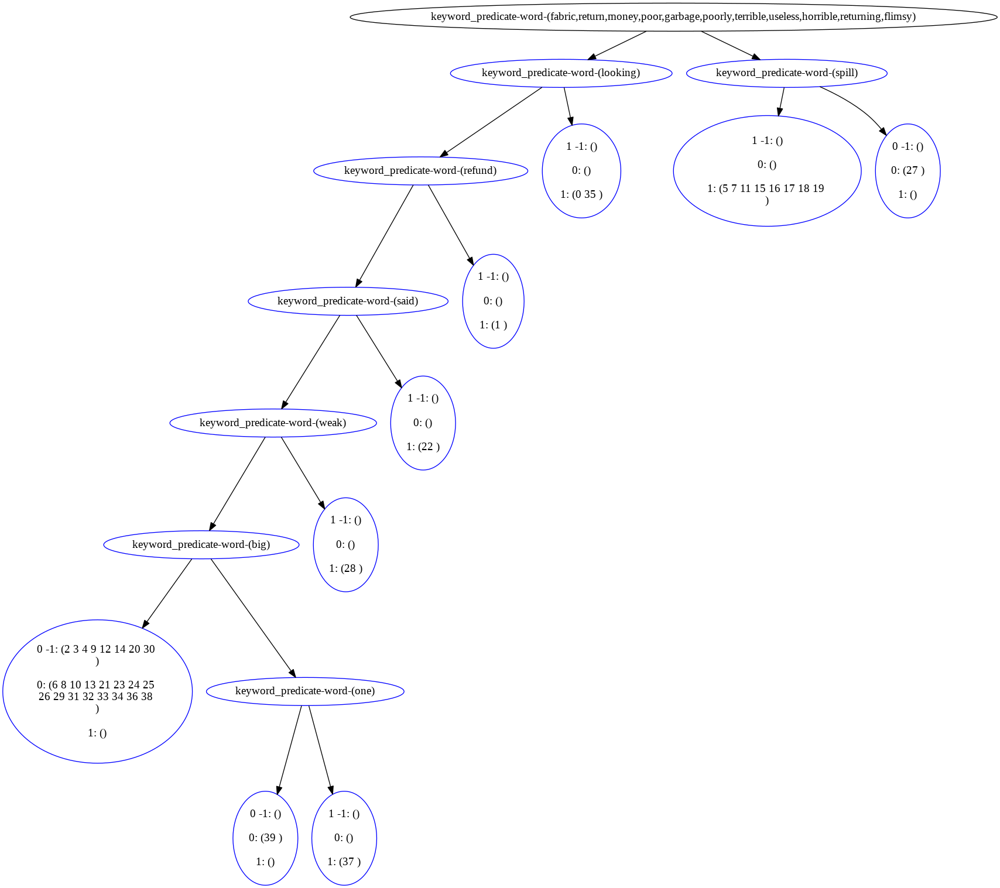











after reconstructing, original tree is


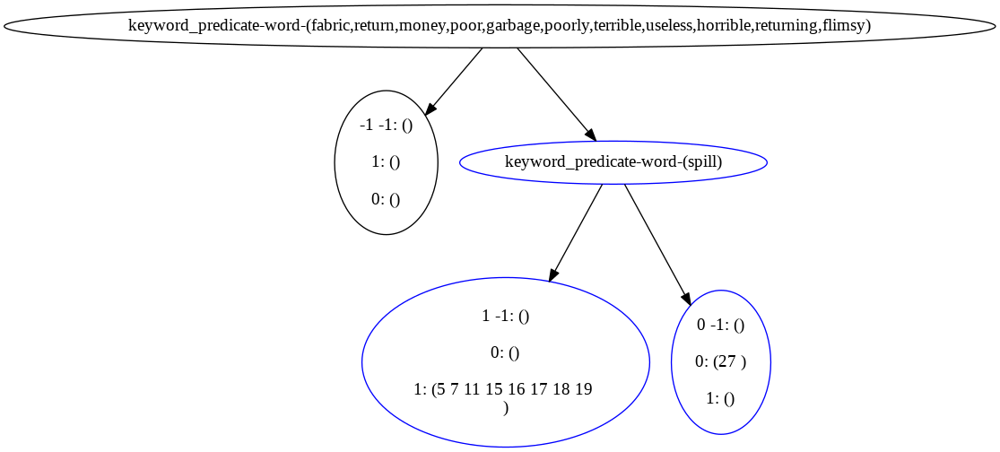



res trees before deduplication


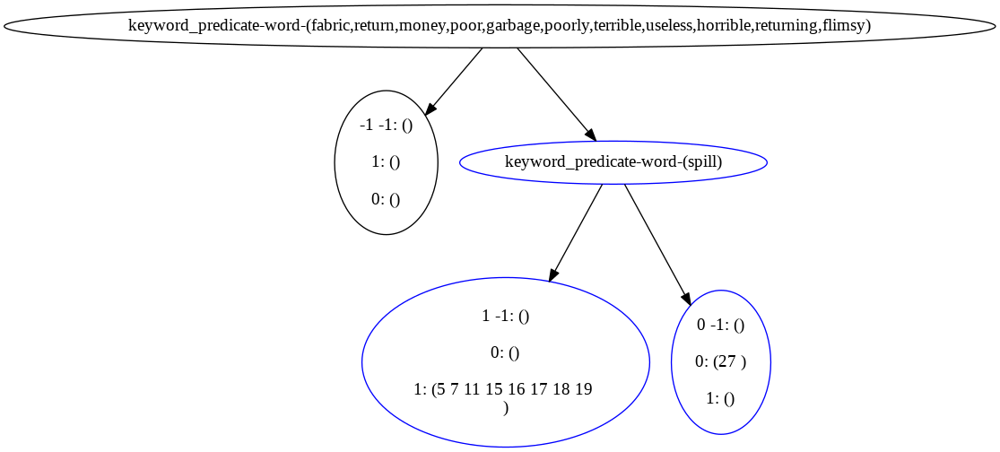

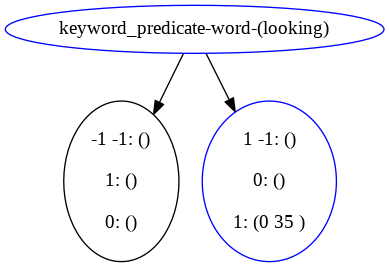

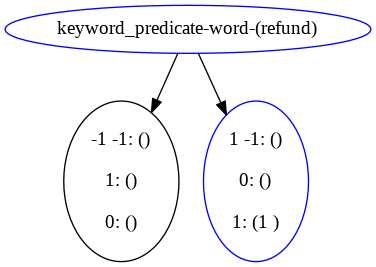

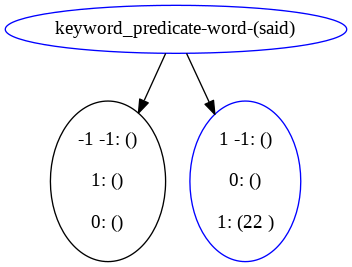

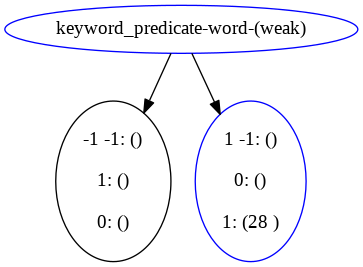

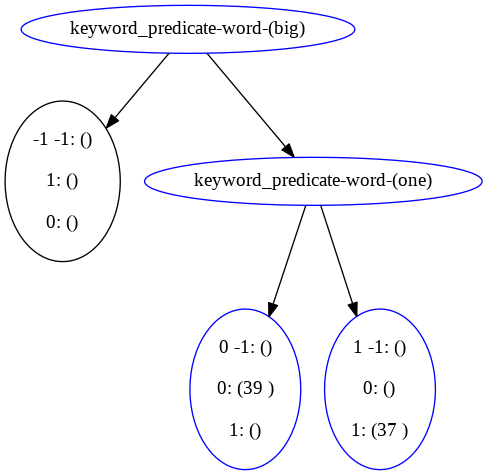



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(fabric,return,money,poor,garbage,poorly,terrible,useless,horrible,returning,flimsy))
    LabelNode(id=25, label=-1)
    PredicateNode(id=7, pred=keyword_predicate-word-(spill), added=True)
        LabelNode(id=8, label=1, added=True)
        LabelNode(id=9, label=0, added=True)
candidate res tree:
PredicateNode(id=4, pred=keyword_predicate-word-(looking), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=6, label=1, added=True)
candidate res tree:
PredicateNode(id=10, pred=keyword_predicate-word-(refund), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=12, label=1, added=True)
candidate res tree:
PredicateNode(id=13, pred=keyword_predicate-word-(said), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=15, label=1, added=True)
candidate res tree:
PredicateNode(id=16, pred=keyword_predicate-word-(weak), added=True)
    LabelNode(id=adde

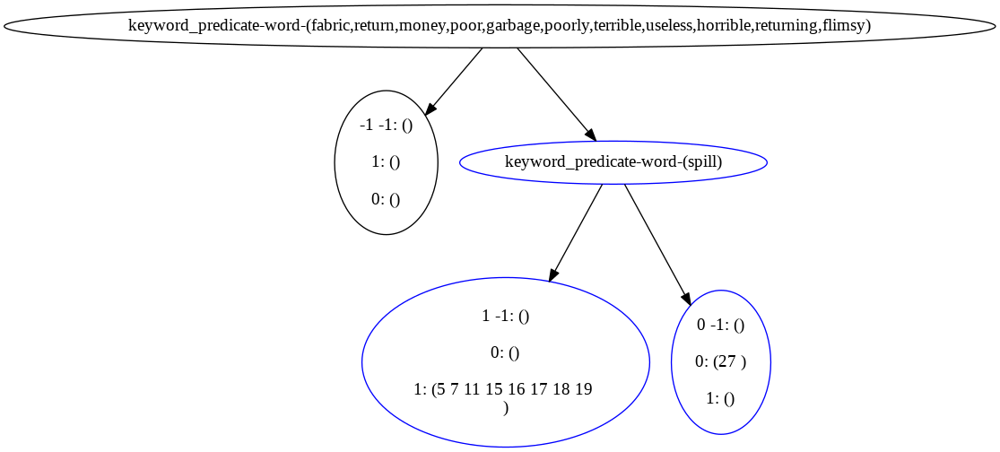

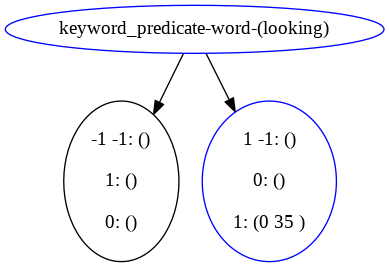

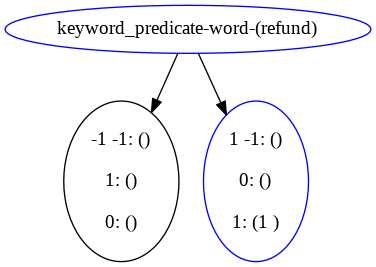

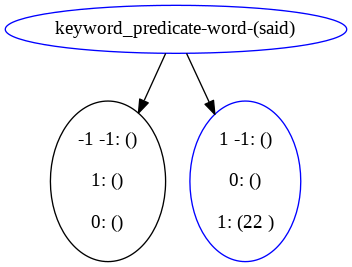

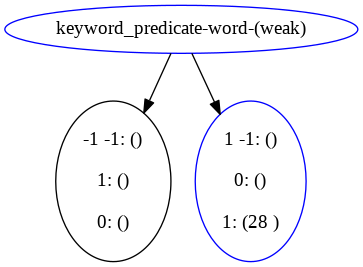

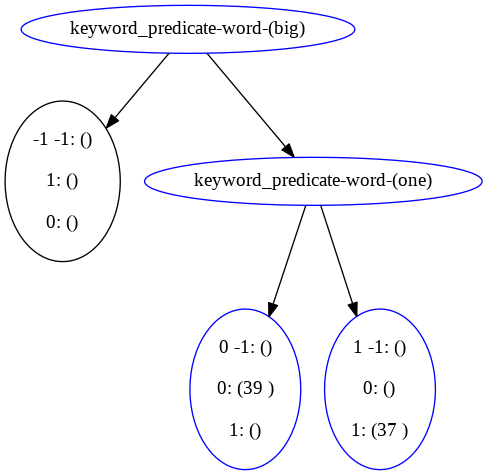



-----------------------------------------------------
original tree 14


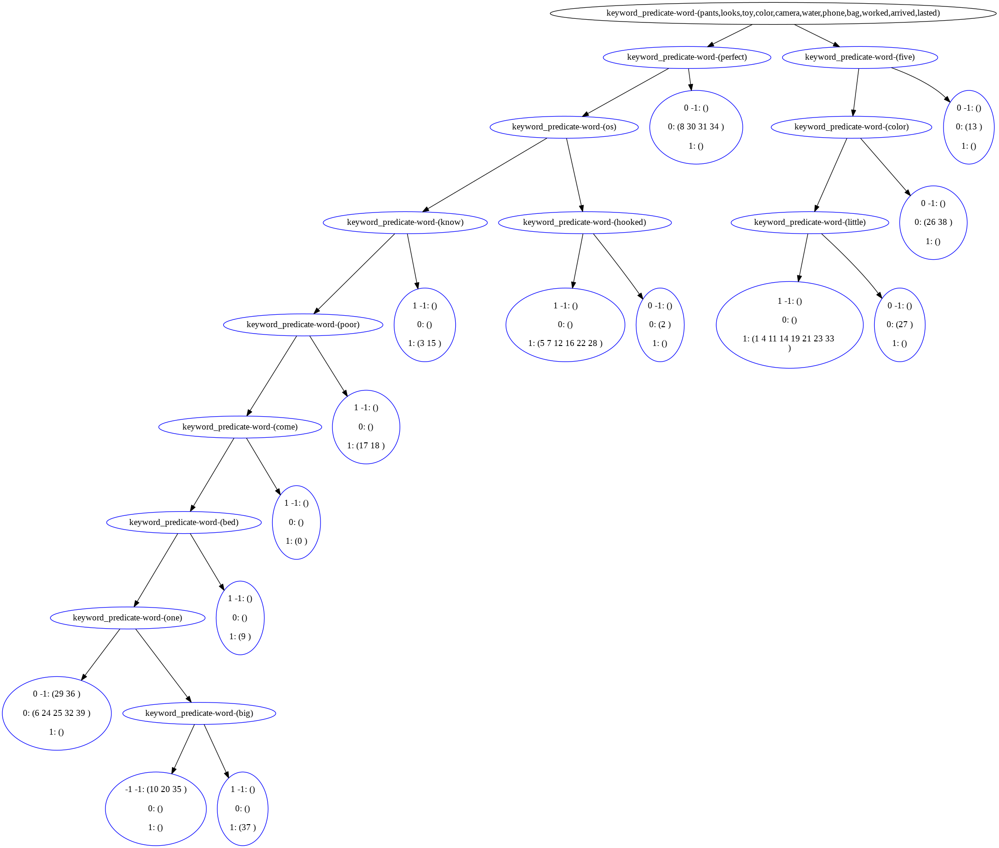



















after reconstructing, original tree is


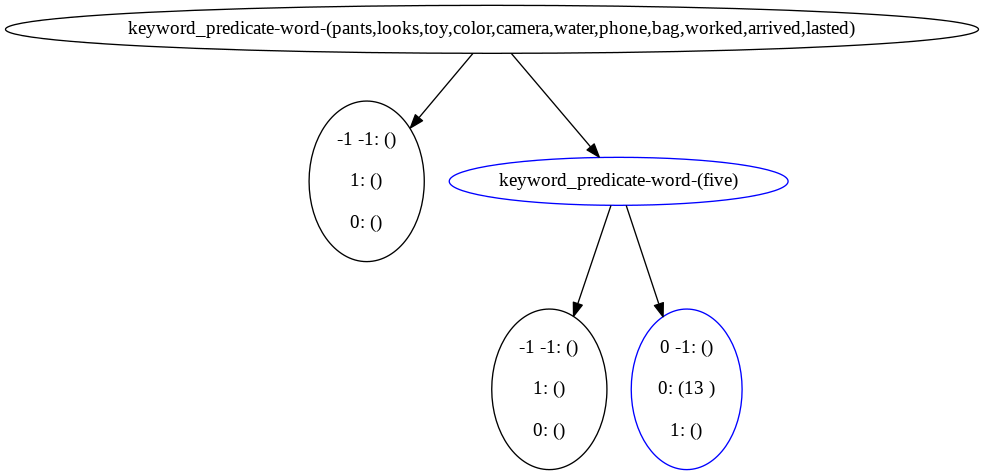



res trees before deduplication


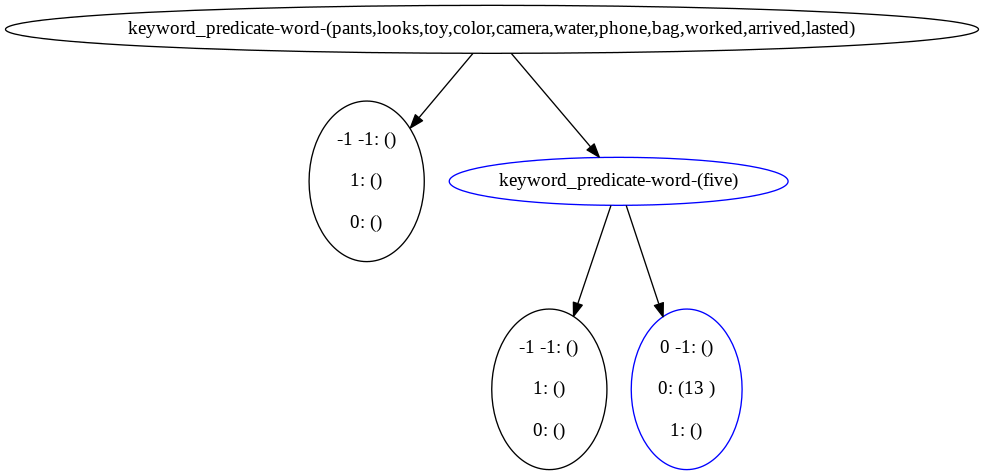

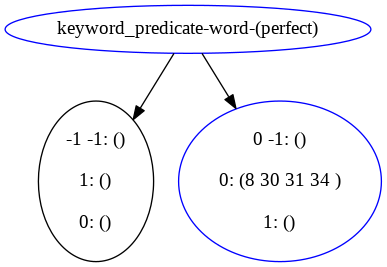

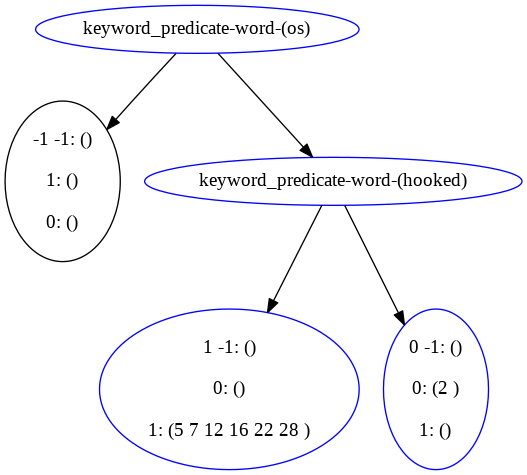

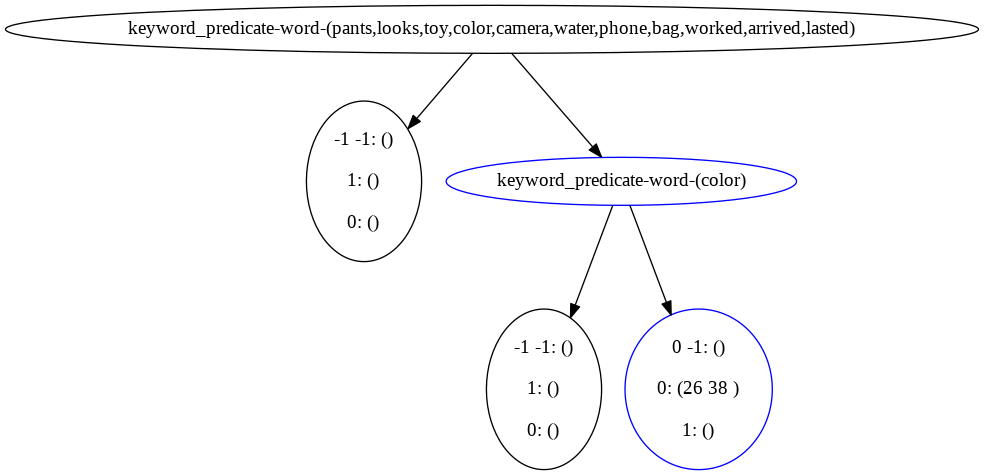

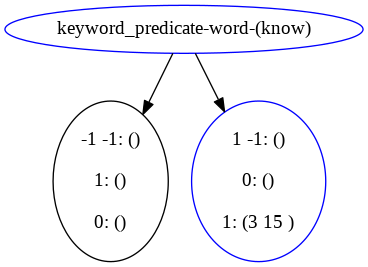

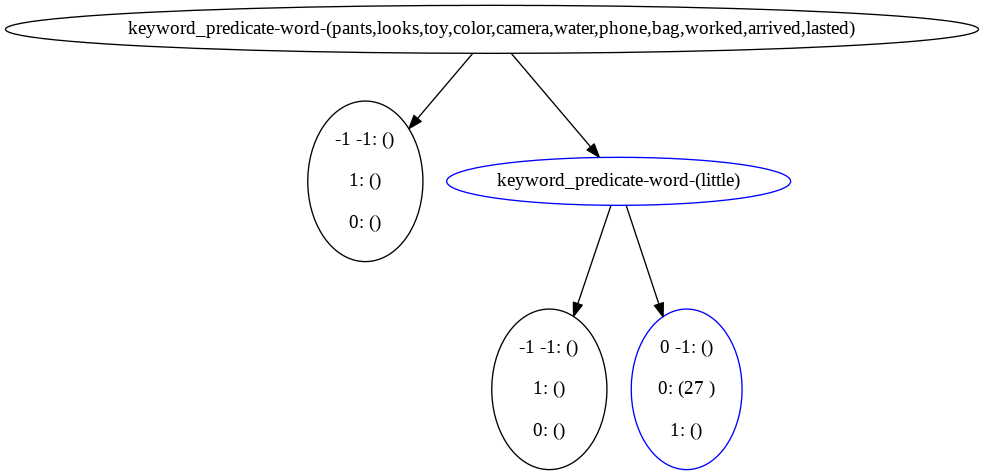

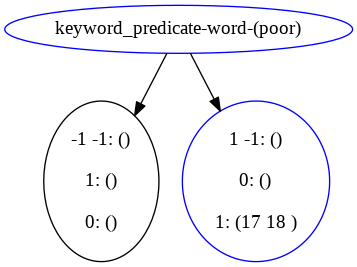

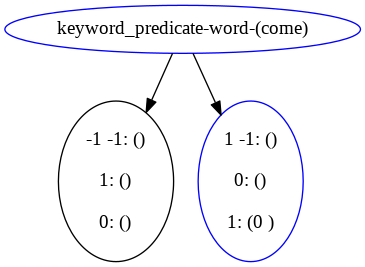

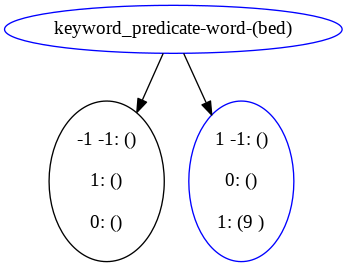

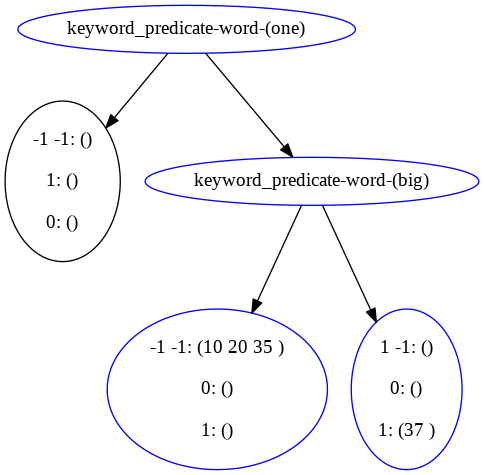



***********************************
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(pants,looks,toy,color,camera,water,phone,bag,worked,arrived,lasted))
    LabelNode(id=40, label=-1)
    PredicateNode(id=7, pred=keyword_predicate-word-(five), added=True)
        LabelNode(id=42, label=-1)
        LabelNode(id=9, label=0, added=True)
candidate res tree:
PredicateNode(id=4, pred=keyword_predicate-word-(perfect), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=6, label=0, added=True)
candidate res tree:
PredicateNode(id=10, pred=keyword_predicate-word-(os), added=True)
    LabelNode(id=added_1, label=-1)
    PredicateNode(id=19, pred=keyword_predicate-word-(hooked), added=True)
        LabelNode(id=20, label=1, added=True)
        LabelNode(id=21, label=0, added=True)
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(pants,looks,toy,color,camera,water,phone,bag,worked,arrived,lasted))
    LabelNode(id=added_2, label=-1)
    Predi

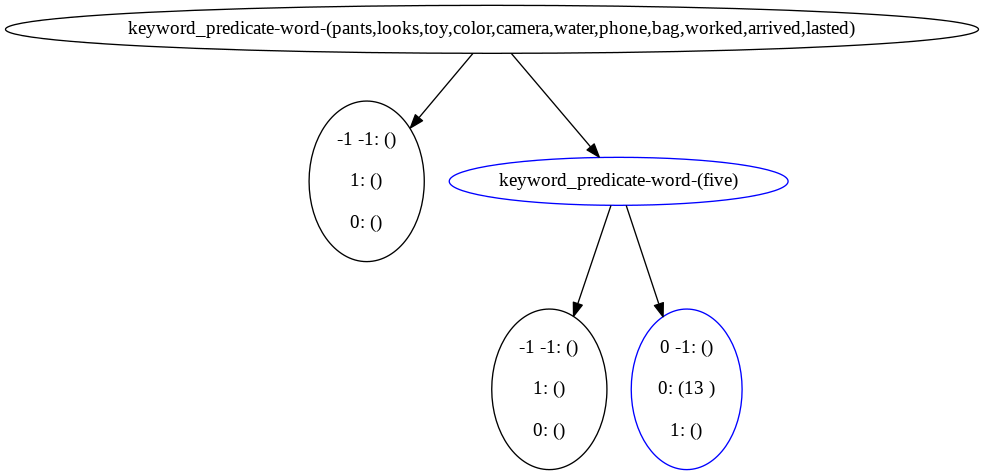

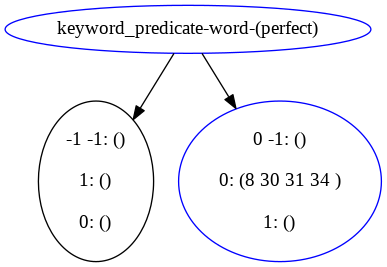

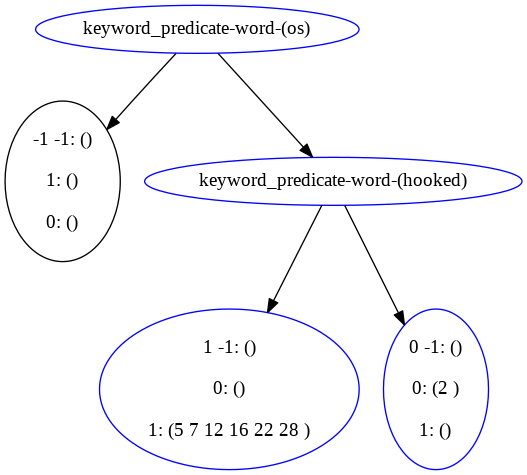

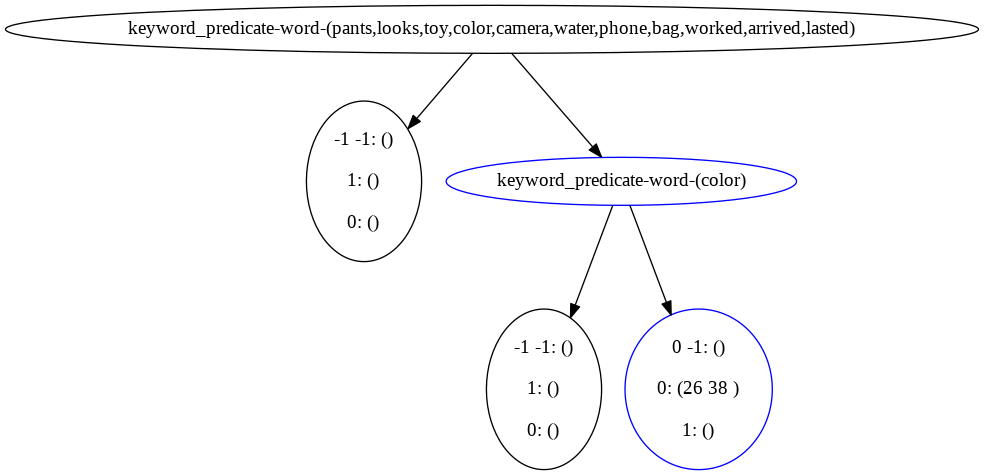

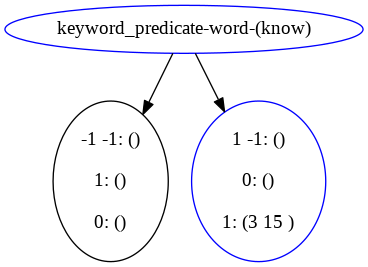

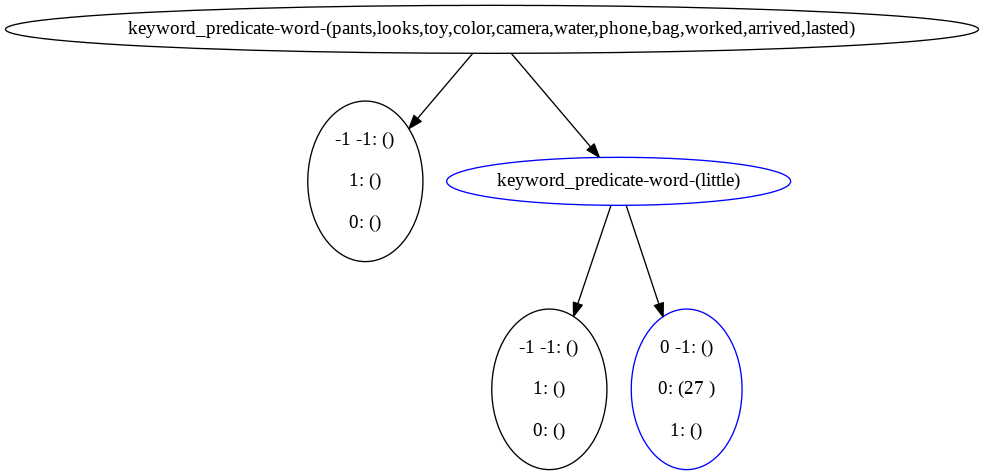

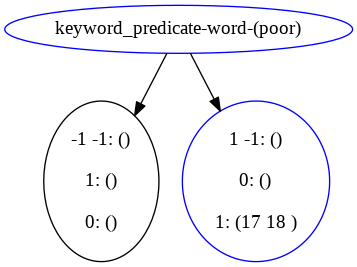

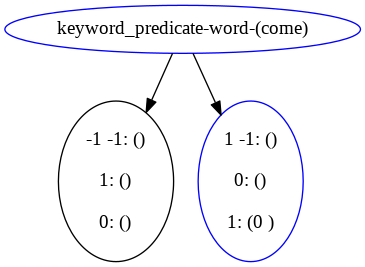

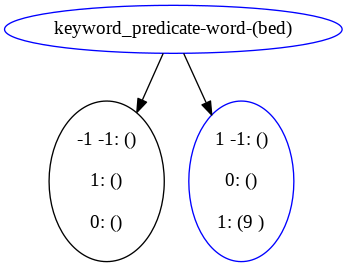

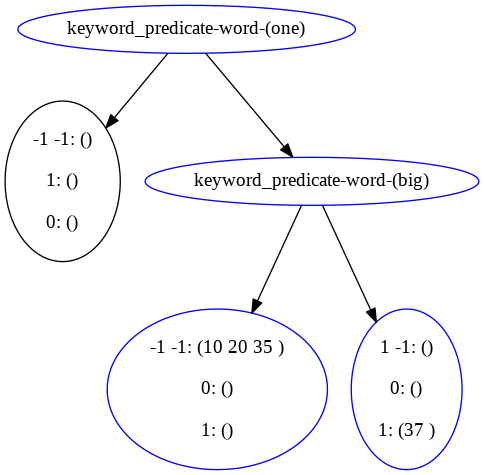



-----------------------------------------------------


In [119]:
for i in input_08075:
    cur_rule = input_08075[i]['rule']
    print(f"original tree {i}")
    dot_string=cur_rule.gen_dot_string('')
    graph = pydot.graph_from_dot_data(dot_string)[0]
    plt = Image(graph.create_png())
    display(plt)
#     print('\n')
    new_trees_from_cur_rule = post_process_break_tree_to_subtrees(cur_rule)
    new_rules.extend(new_trees_from_cur_rule)
    print('-----------------------------------------------------')

In [103]:
with open('amazon_la_0.8_ia_0.75_input.pkl', 'rb') as f:
    input_test = pickle.load(f)


In [105]:
for i in input_test:
    input_test[i]['user_input']['id'] = input_test[i]['user_input'].reset_index().index
fix_rules_with_solver_input(fix_book_keeping_dict=input_test)

original tree 14


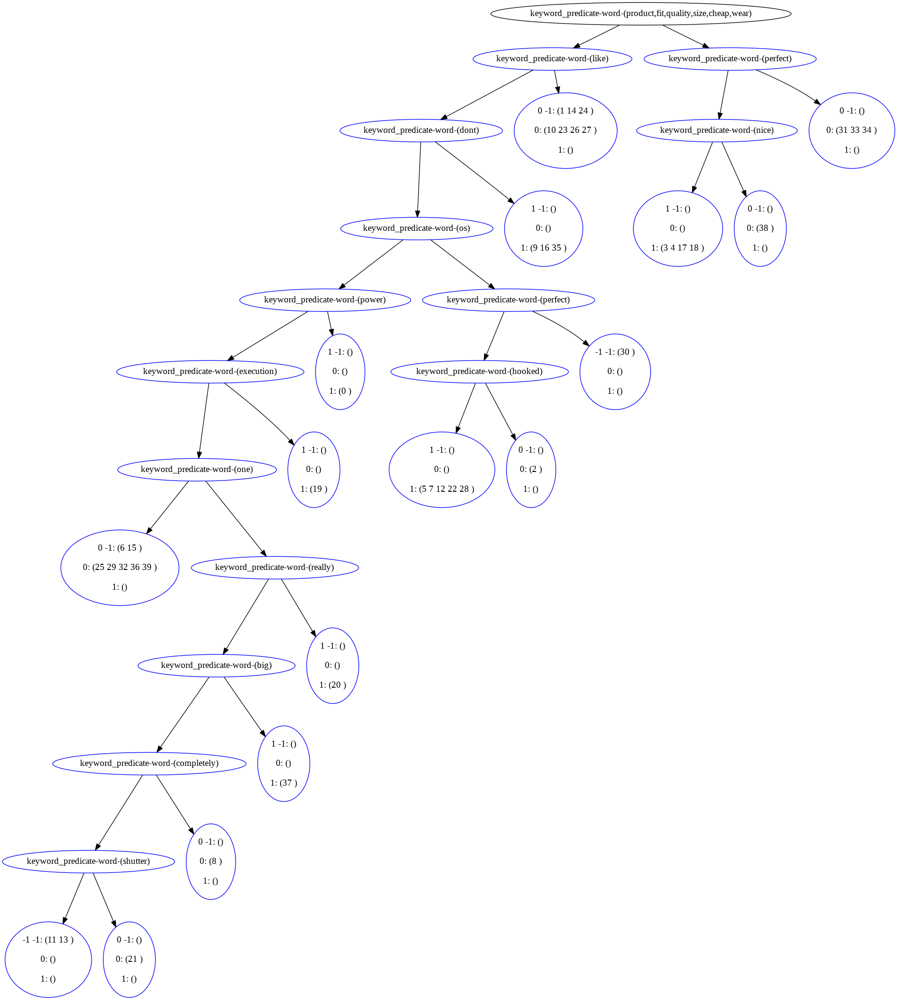























after reconstructing, original tree is


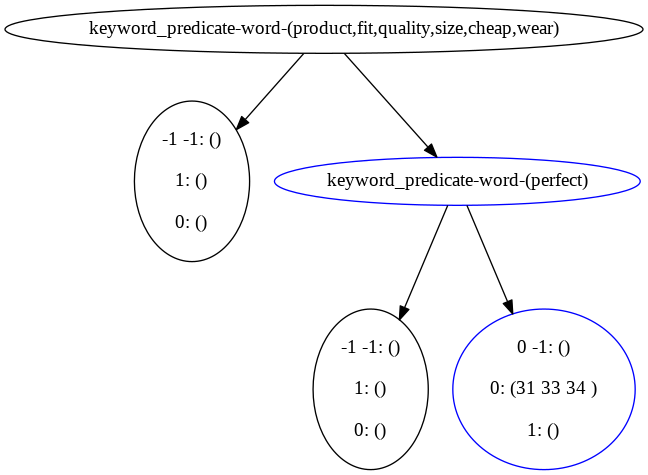



candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(product,fit,quality,size,cheap,wear))
    LabelNode(id=46, label=-1)
    PredicateNode(id=7, pred=keyword_predicate-word-(perfect), added=True)
        LabelNode(id=48, label=-1)
        LabelNode(id=9, label=0, added=True)
candidate res tree:
PredicateNode(id=4, pred=keyword_predicate-word-(like), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=6, label=0, added=True)
candidate res tree:
PredicateNode(id=10, pred=keyword_predicate-word-(dont), added=True)
    LabelNode(id=added_1, label=-1)
    LabelNode(id=12, label=1, added=True)
candidate res tree:
PredicateNode(id=1, pred=keyword_predicate-word-(product,fit,quality,size,cheap,wear))
    LabelNode(id=added_2, label=-1)
    PredicateNode(id=13, pred=keyword_predicate-word-(nice), added=True)
        LabelNode(id=added_1, label=-1)
        LabelNode(id=15, label=0, added=True)
candidate res tree:
PredicateNode(id=16, pred=keyword_predicate-word-(o

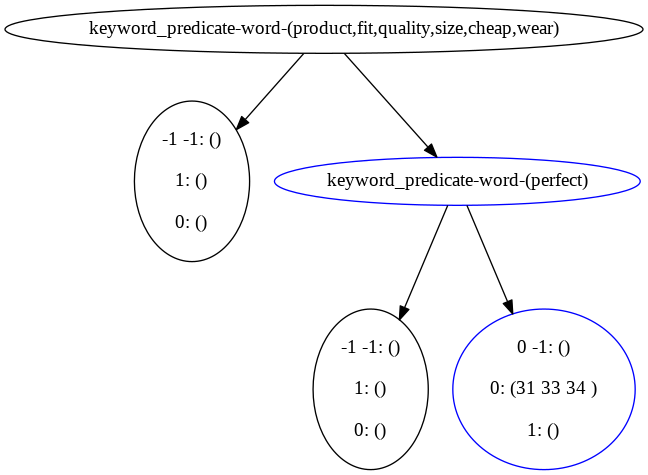

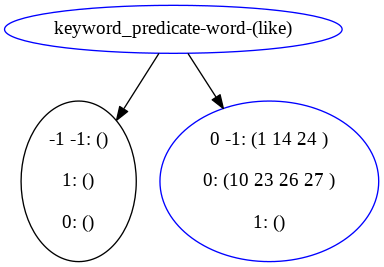

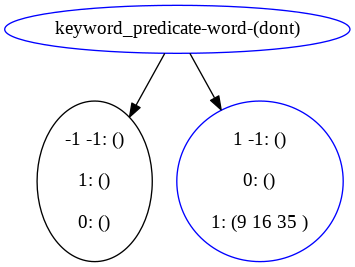

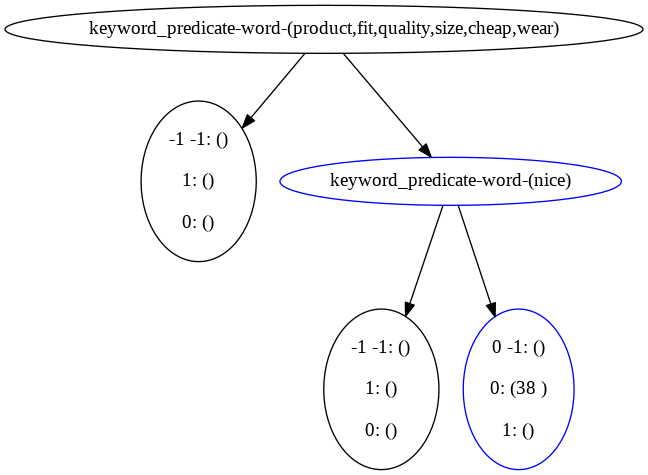

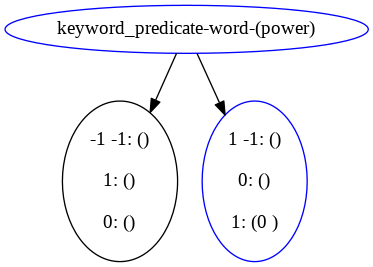

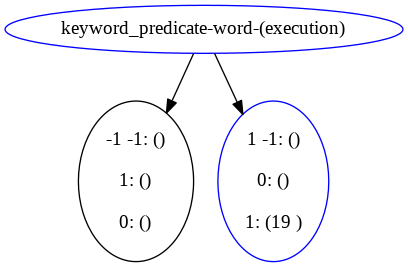

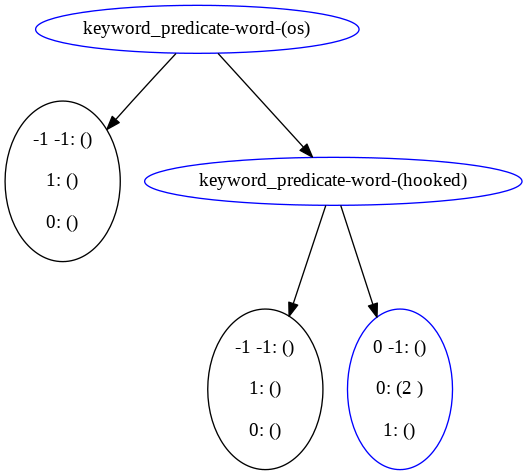

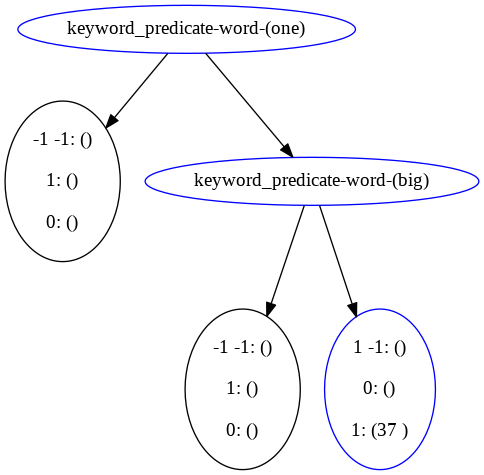

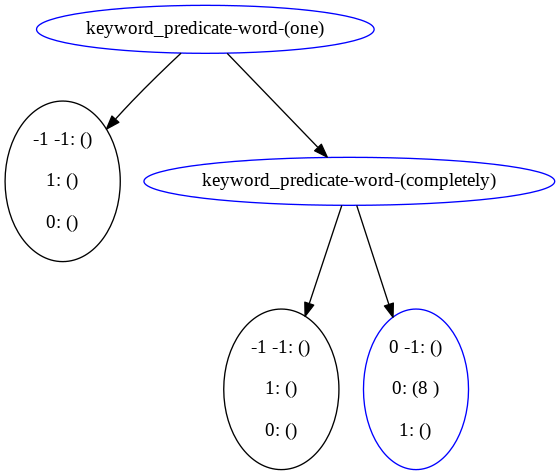

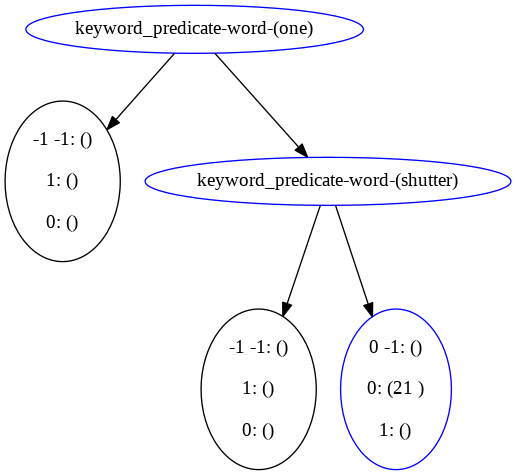



-----------------------------------------------------


In [106]:
cur_rule = input_test[1]['rule']
print(f"original tree {i}")
dot_string=cur_rule.gen_dot_string('')
graph = pydot.graph_from_dot_data(dot_string)[0]
plt = Image(graph.create_png())
display(plt)
#     print('\n')
new_trees_from_cur_rule = post_process_break_tree_to_subtrees(cur_rule)
new_rules.extend(new_trees_from_cur_rule)
print('-----------------------------------------------------')

In [ ]:
  A
 / \ 
-1 B
  / \
  C  D
  /\  /\  
 -1 0 -1 1

1: queue = [(A,[])], res = [A]
2: while(q)
   cur_node, R_ancestors = q.popleft()
   if(cur_node.left is Predicate):
       new_root = dupRancestors(cur_node.left, R_ancestors)
       res.append(new_root)
       queue.append((cur_node.left, R_ancestors))
       cur_node.left=LabelNode(ABSTAIN)
   if(cur_node.right is Predicate):
       new_ancestors = R_ancestors + cur_node
       queue.append((cur_node.right, new_ancestors))
       